# *Owner - Harshdeep Kohli*

# LSE Data Analytics Online Career Accelerator 

# DA301:  Advanced Analytics for Organisational Impact

# Assignment: Predicting future outcomes

# GitHub
## ***This project will be hosted on GitHub which is one of the largest coding communities and has the benefits of reproducability of code and promotes collaboration with industry professionals. You can view my github repostitories by pressing the below link.***
### My GitHub: https://github.com/harshdeepkohli53

### Scenario
You are a data analyst working for Turtle Games, a game manufacturer and retailer. They manufacture and sell their own products, along with sourcing and selling products manufactured by other companies. Their product range includes books, board games, video games and toys. They have a global customer base and have a business objective of improving overall sales performance by utilising customer trends. In particular, Turtle Games wants to understand: 
- how customers accumulate loyalty points (Week 1)
- exploring the structure using decision trees (Week 2)
- exploring clusters in customer behaviour (Week 3)
- can social data (e.g. customer reviews) be used in marketing campaigns (Week 4)
- loading, transforming and visualising data in R (Week 5)
- statistical analysis and modelling in R (Week 6)

# Week 1 assignment: Linear regression using Python
The marketing department of Turtle Games prefers Python for data analysis. As you are fluent in Python, they asked you to assist with data analysis of social media data. The marketing department wants to better understand how users accumulate loyalty points. Therefore, you need to investigate the possible relationships between the loyalty points, age, remuneration, and spending scores. Note that you will use this data set in future modules as well and it is, therefore, strongly encouraged to first clean the data as per provided guidelines and then save a copy of the clean data for future use.

## Instructions
1. Load and explore the data.
    1. Create a new DataFrame (e.g. reviews).
    2. Sense-check the DataFrame.
    3. Determine if there are any missing values in the DataFrame.
    4. Create a summary of the descriptive statistics.
2. Remove redundant columns (`language` and `platform`).
3. Change column headings to names that are easier to reference (e.g. `renumeration` and `spending_score`).
4. Save a copy of the clean DataFrame as a CSV file. Import the file to sense-check.
5. Use linear regression and goodness of fit metrics to evaluate possible linear relationships between loyalty points and age/renumeration/spending scores to determine whether these can be used to predict the loyalty points.
    1. Specify the independent and dependent variables.
    2. Create the OLS model.
    3. Extract the estimated parameters, standard errors, and predicted values.
    4. Generate the regression table based on the X coefficient and constant values.
    5. Plot the linear regression and add a regression line.
6. Include your insights and observations.

## 1. Prepare Workstation

In [7]:
# Import libraries
import os
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import pylab
import seaborn as sns
import statsmodels.api as sm 
from statsmodels.formula.api import ols
import statsmodels.stats.diagnostic as sms
from statsmodels.stats.outliers_influence import variance_inflation_factor
import scipy.stats as stats
from scipy.spatial.distance import cdist
from scipy.stats import norm
import sklearn
from sklearn import linear_model
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.metrics import r2_score, mean_squared_error,mean_absolute_error,accuracy_score, confusion_matrix,classification_report,silhouette_score
from sklearn.tree import DecisionTreeRegressor, plot_tree 
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
import nltk 
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist
from nltk.corpus import stopwords
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from textblob import TextBlob
from wordcloud import WordCloud
import re
from collections import Counter

# ignore warnings
import warnings
warnings.filterwarnings('ignore')

In [8]:
# Set figure size
plt.rcParams['figure.figsize'] = [15, 8]

# set colour palette for easy accessability
sns.color_palette('colorblind')

[(0.00392156862745098, 0.45098039215686275, 0.6980392156862745),
 (0.8705882352941177, 0.5607843137254902, 0.0196078431372549),
 (0.00784313725490196, 0.6196078431372549, 0.45098039215686275),
 (0.8352941176470589, 0.3686274509803922, 0.0),
 (0.8, 0.47058823529411764, 0.7372549019607844),
 (0.792156862745098, 0.5686274509803921, 0.3803921568627451),
 (0.984313725490196, 0.6862745098039216, 0.8941176470588236),
 (0.5803921568627451, 0.5803921568627451, 0.5803921568627451),
 (0.9254901960784314, 0.8823529411764706, 0.2),
 (0.33725490196078434, 0.7058823529411765, 0.9137254901960784)]

## User defined functions

In [10]:
# data validation function
def validate_data(df):
    """
    Performs basic data checks on a Pandas DataFrame.

    Args:
        df: The Pandas DataFrame to validate.

    Returns:
        A dictionary containing the results of the data checks to easily access individual elements
    """

    results = {}

    results['shape'] = df.shape  # determine number of rows and columns in the df
    results['null_values'] = df.isnull().sum()  # determine number of null values in the df
    results['duplicate_values'] = df.duplicated().sum()  # determine number of duplicates in the df
    results['data_types'] = df.dtypes  # determine column data types in the df
    
    return results

In [11]:
# remove punctuation function
def remove_punctuation(text):
    """Removes punctuation from a string using regular expressions."""
    return re.sub(r'[^\w\s]', '', text)

In [12]:
# Determine TextBlob polarity score
def generate_polarity(comment):
    '''Extract polarity score (-1 to +1) for each comment'''
    return TextBlob(comment).sentiment[0]

In [13]:
# Determine TextBlob subjectivity score
def generate_subjectivity(comment):
    '''Extract subjectivity score (0 to 1) for each comment'''
    return TextBlob(comment).sentiment[1]

In [14]:
# Create a sentiment category for easy interpretation - TextBlob (apply to polarity score)
def classify_sentiment_textblob(score):
    '''categorises TextBlob polarity scores for easier interpretation'''
    if score > 0:
        return 'Positive'
    elif score < 0:
        return 'Negative'
    else:
        return 'Neutral'

In [15]:
# Determine Vader sentiment scores (negative, neutral, positive, compound)
def get_sentiment_scores(text):
    '''returns the negative,neutral,positive,compound scores using Vader library'''
    scores = analyzer.polarity_scores(text)
    return pd.Series([scores['neg'], scores['neu'], scores['pos'], scores['compound']])

In [16]:
# Create a sentiment category for easy interpretation - VADER (apply to compound score)
def classify_sentiment_vader(score):
    '''categorises vader compound scores for easier interpretation'''
    if score >= 0.05:
        return 'Positive'
    elif score <= -0.05:
        return 'Negative'
    else:
        return 'Neutral'

## Load the data

In [18]:
# Load the CSV file(s) as reviews.
reviews = pd.read_csv('turtle_reviews.csv')

## Data Validation

In [20]:
# apply data validation function
validate_data(reviews)

{'shape': (2000, 11),
 'null_values': gender                    0
 age                       0
 remuneration (k£)         0
 spending_score (1-100)    0
 loyalty_points            0
 education                 0
 language                  0
 platform                  0
 product                   0
 review                    0
 summary                   0
 dtype: int64,
 'duplicate_values': 0,
 'data_types': gender                     object
 age                         int64
 remuneration (k£)         float64
 spending_score (1-100)      int64
 loyalty_points              int64
 education                  object
 language                   object
 platform                   object
 product                     int64
 review                     object
 summary                    object
 dtype: object}

> Note - As determined by the validate_data function, there are 0 null values and 0 duplicates.

In [22]:
# view the metadata
reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   gender                  2000 non-null   object 
 1   age                     2000 non-null   int64  
 2   remuneration (k£)       2000 non-null   float64
 3   spending_score (1-100)  2000 non-null   int64  
 4   loyalty_points          2000 non-null   int64  
 5   education               2000 non-null   object 
 6   language                2000 non-null   object 
 7   platform                2000 non-null   object 
 8   product                 2000 non-null   int64  
 9   review                  2000 non-null   object 
 10  summary                 2000 non-null   object 
dtypes: float64(1), int64(4), object(6)
memory usage: 172.0+ KB


In [23]:
# view the summary statistics
reviews.describe()

,age,remuneration (k£),spending_score (1-100),loyalty_points,product
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,39.495000,48.079060,50.000000,1578.032000,4320.521500
std,13.573212,23.123984,26.094702,1283.239705,3148.938839
min,17.000000,12.300000,1.000000,25.000000,107.000000
25%,29.000000,30.340000,32.000000,772.000000,1589.250000
50%,38.000000,47.150000,50.000000,1276.000000,3624.000000
75%,49.000000,63.960000,73.000000,1751.250000,6654.000000
max,72.000000,112.340000,99.000000,6847.000000,11086.000000


In [24]:
# view the data frame
reviews

,gender,age,remuneration (k£),spending_score (1-100),loyalty_points,education,language,platform,product,review,summary
0,Male,18,12.30,39,210,graduate,EN,Web,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,EN,Web,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,EN,Web,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,EN,Web,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,EN,Web,291,As my review of GF9's previous screens these w...,Money trap
...,...,...,...,...,...,...,...,...,...,...,...
1995,Female,37,84.46,69,4031,PhD,EN,Web,977,The perfect word game for mixed ages (with Mom...,The perfect word game for mixed ages (with Mom
1996,Female,43,92.66,8,539,PhD,EN,Web,979,Great game. Did not think I would like it whe...,Super fun
1997,Male,34,92.66,91,5614,graduate,EN,Web,1012,Great game for all.........\nKeeps the mind ni...,Great Game
1998,Male,34,98.40,16,1048,PhD,EN,Web,1031,fun game!,Four Stars


## Drop columns

In [26]:
# Drop unnecessary columns.
reviews.drop(['language', 'platform'], axis=1, inplace=True)

# View columns names.
reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 9 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   gender                  2000 non-null   object 
 1   age                     2000 non-null   int64  
 2   remuneration (k£)       2000 non-null   float64
 3   spending_score (1-100)  2000 non-null   int64  
 4   loyalty_points          2000 non-null   int64  
 5   education               2000 non-null   object 
 6   product                 2000 non-null   int64  
 7   review                  2000 non-null   object 
 8   summary                 2000 non-null   object 
dtypes: float64(1), int64(4), object(4)
memory usage: 140.8+ KB


## Rename columns

> Rename 'remuneration (k£)' to 'pay'
>
> Rename'spending_score (1-100)' to 'spend'
>
> Rename 'loyalty_points' to 'loyalty'

In [29]:
# Rename the column headers.
reviews.rename(columns={'remuneration (k£)':'pay','spending_score (1-100)':'spend','loyalty_points':'loyalty'}, inplace=True)

# View column names.
reviews.columns

Index(['gender', 'age', 'pay', 'spend', 'loyalty', 'education', 'product',
       'review', 'summary'],
      dtype='object')

## Save the DataFrame as a CSV file

In [31]:
# Create a CSV file as output - rename the updated data frame as turtle and save a CSV copy to our computer
reviews.to_csv('turtle.csv', index=False)

In [32]:
# Import new CSV file with Pandas - (file name: turtle)
turtle = pd.read_csv('turtle.csv')

# View DataFrame.
turtle

,gender,age,pay,spend,loyalty,education,product,review,summary
0,Male,18,12.30,39,210,graduate,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,291,As my review of GF9's previous screens these w...,Money trap
...,...,...,...,...,...,...,...,...,...
1995,Female,37,84.46,69,4031,PhD,977,The perfect word game for mixed ages (with Mom...,The perfect word game for mixed ages (with Mom
1996,Female,43,92.66,8,539,PhD,979,Great game. Did not think I would like it whe...,Super fun
1997,Male,34,92.66,91,5614,graduate,1012,Great game for all.........\nKeeps the mind ni...,Great Game
1998,Male,34,98.40,16,1048,PhD,1031,fun game!,Four Stars


In [33]:
# revalidate the data frame
validate_data(turtle)

{'shape': (2000, 9),
 'null_values': gender       0
 age          0
 pay          0
 spend        0
 loyalty      0
 education    0
 product      0
 review       0
 summary      0
 dtype: int64,
 'duplicate_values': 0,
 'data_types': gender        object
 age            int64
 pay          float64
 spend          int64
 loyalty        int64
 education     object
 product        int64
 review        object
 summary       object
 dtype: object}

In [34]:
# recheck columns and data types in the data frame
turtle.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 9 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   gender     2000 non-null   object 
 1   age        2000 non-null   int64  
 2   pay        2000 non-null   float64
 3   spend      2000 non-null   int64  
 4   loyalty    2000 non-null   int64  
 5   education  2000 non-null   object 
 6   product    2000 non-null   int64  
 7   review     2000 non-null   object 
 8   summary    2000 non-null   object 
dtypes: float64(1), int64(4), object(4)
memory usage: 140.8+ KB


#

## Correlation between numeric variables

<Axes: >

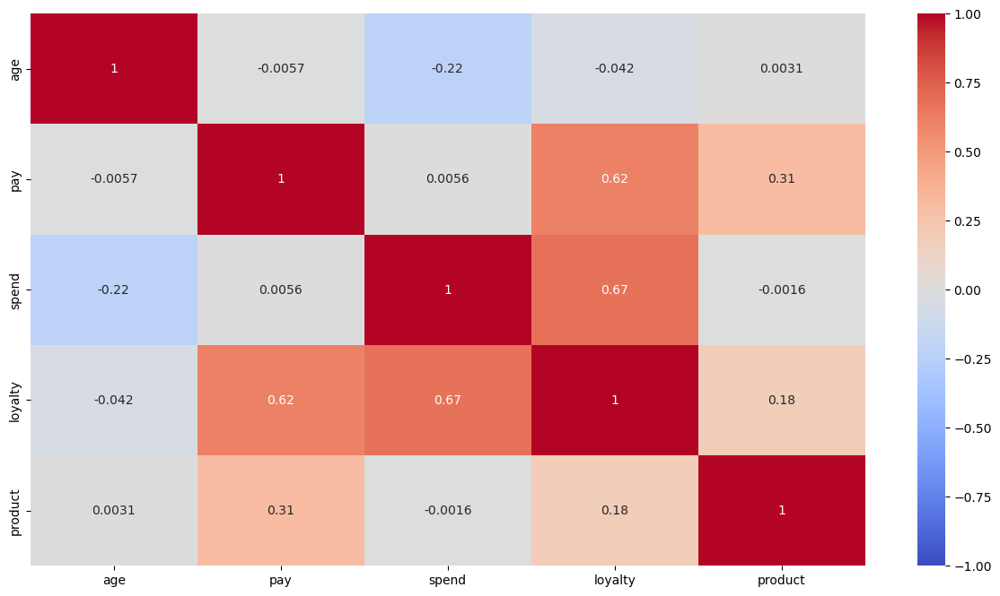

In [37]:
# view the correlation between the numeric variables using a heatmap
plt.figure(figsize=(15,8))
sns.heatmap(turtle.corr(numeric_only=True),vmin=-1,vmax=1,cmap='coolwarm',annot=True)

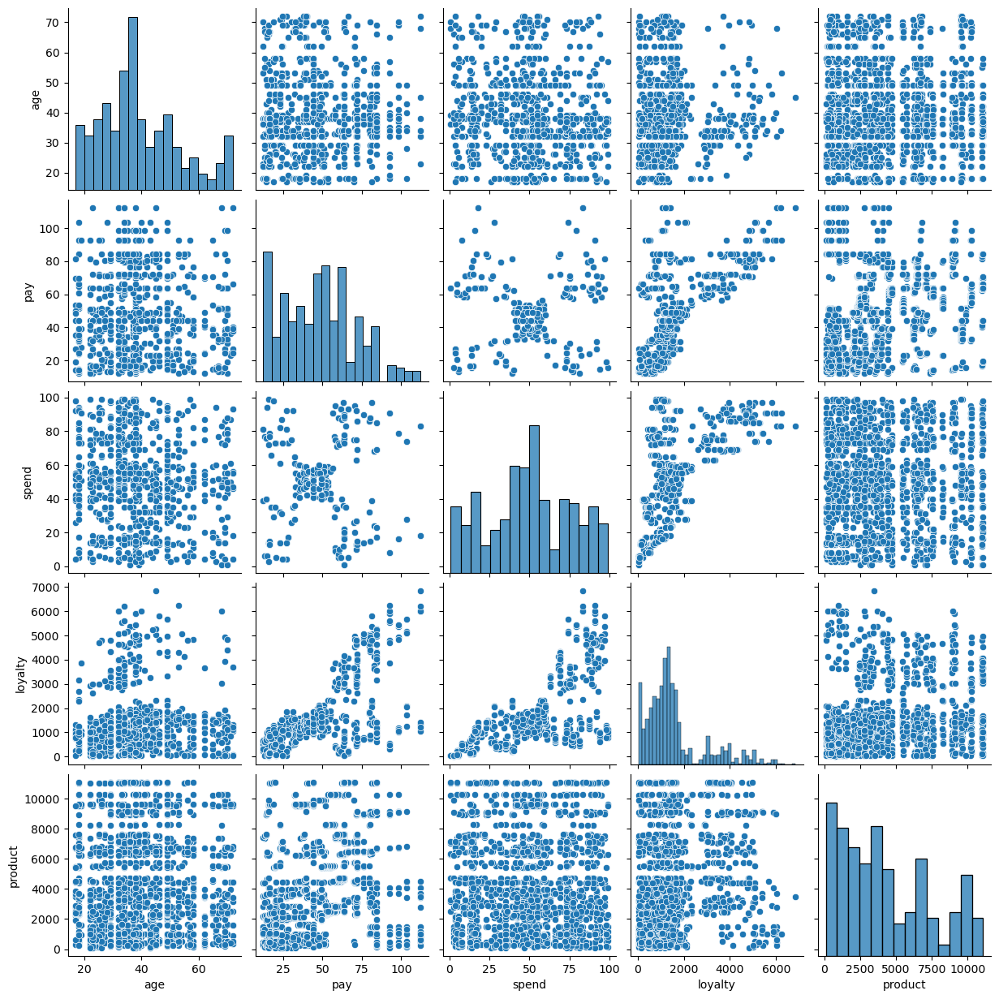

In [38]:
# view the relationship between variables using a pairplot
sns.pairplot(turtle)

> The pairplot allows us to visualise the distributions and relationships of the numerical variables in the dataset. This will help identify variables to use to build a regression model.
>
> There are correlations between pay and loyalty, and spend and loyalty. There is no correlation between age and loyalty. There is possible clustering in the pay and spend plot. These relationships will be explored in further detail below
>
> Product is actually not a numeric variable, but represents a categorical variable (i.e product ID) and can be ignored in this instance

#

# 2. Simple Linear regression using OLS method

## MODEL 1 - Spend vs Loyalty

Text(0.5, 1.0, 'relationship between spend and loyalty')

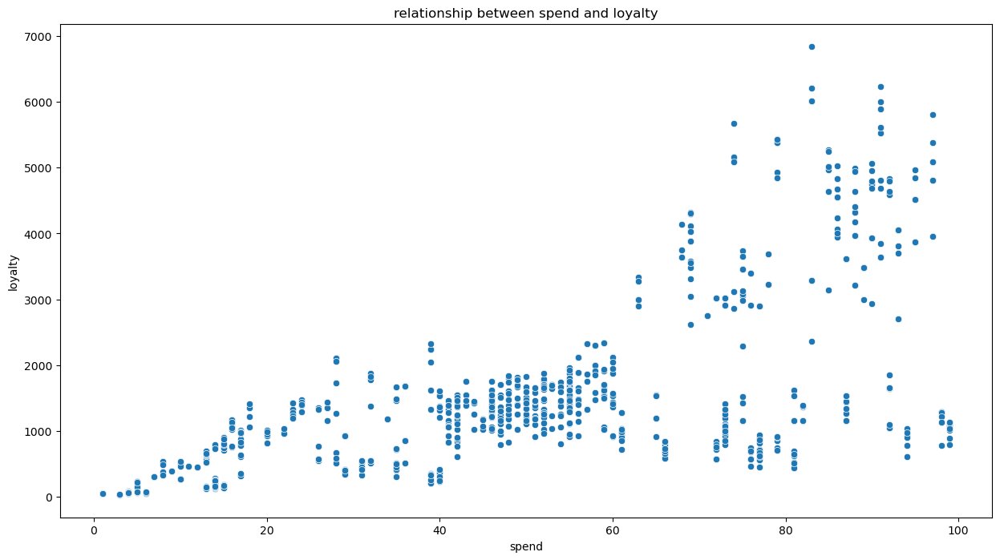

In [43]:
# determine if there is a linear relationship between spend and loyalty
sns.scatterplot(data = turtle, x = 'spend', y = 'loyalty')
plt.title('relationship between spend and loyalty')

> We can clearly see above that there is a significant linear relationship between spend and loyalty. As this assumption has been satisfied, but we can build a simple linear regression model to further analyse this relationship 

In [45]:
# Define independent variable.
x = turtle['spend']

# Define dependent variable.
y = turtle['loyalty']

In [46]:
# Create formula and pass through OLS methods.
model1 = ols('loyalty ~ spend', data = turtle).fit()

# Print the regression table.
model1.summary() 

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                loyalty   R-squared:                       0.452
Model:                            OLS   Adj. R-squared:                  0.452
Method:                 Least Squares   F-statistic:                     1648.
Date:                Mon, 14 Apr 2025   Prob (F-statistic):          2.92e-263
Time:                        11:22:01   Log-Likelihood:                -16550.
No. Observations:                2000   AIC:                         3.310e+04
Df Residuals:                    1998   BIC:                         3.312e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    -75.0527     45.931     -1.634      0.102    -165.129      15.024
spend         33.0617      0.814     40.595      0.000      31.464      34.659
==============================================================================
Omnibus:                      126.554   Durbin-Watson:                   1.191
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              260.528
Skew:                           0.422   Prob(JB):                     2.67e-57
Kurtosis:                       4.554   Cond. No.                         122.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### Parameters/errors/predictions

In [48]:
# Extract the estimated parameters.
print("Parameters: ", model1.params)  

# Extract the standard errors.
print("Standard errors: ", model1.bse)  

# Extract the predicted values.
print("Predicted values: ", model1.predict())

Parameters:  Intercept   -75.052663
spend        33.061693
dtype: float64
Standard errors:  Intercept    45.930554
spend         0.814419
dtype: float64
Predicted values:  [1214.35337415 2602.94449102  123.31749662 ... 2933.56142361  453.93442921
  189.44088314]


In [49]:
# Set the X coefficient and the constant to generate the regression equation
y_pred = (model1.params[1] * turtle['spend']) + model1.params[0]

The correlation between spend & loyalty is:  0.6723101119155436
The R-Squared value for this model is:  0.4520008865838909


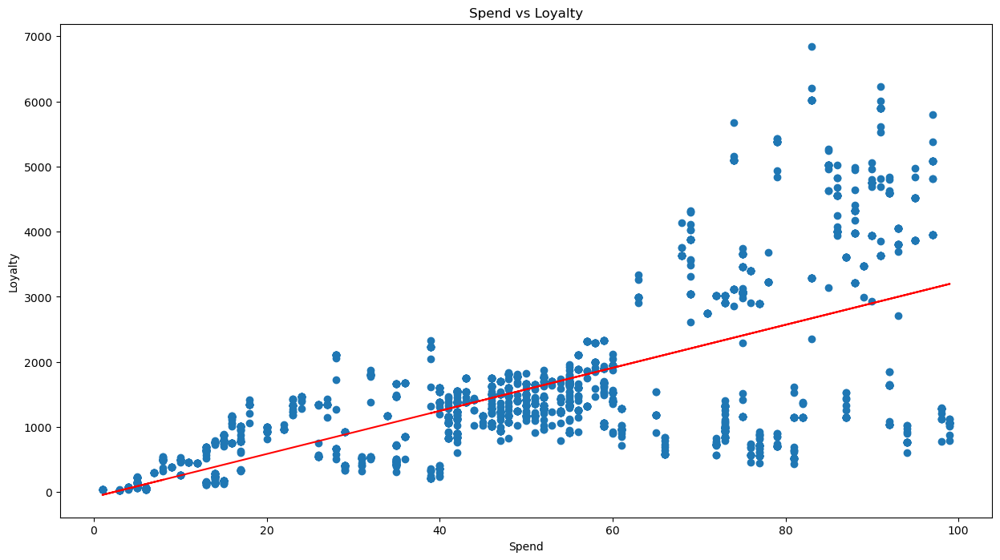

In [50]:
# Plot the graph with a regression line.
plt.scatter(x=turtle['spend'],y=turtle['loyalty'])
plt.plot(x,y_pred,color='red')
plt.xlabel('Spend')
plt.ylabel('Loyalty')
plt.title('Spend vs Loyalty')


print('The correlation between spend & loyalty is: ',turtle['spend'].corr(turtle['loyalty']))
print('The R-Squared value for this model is: ',model1.rsquared)

> As seen above we have a moderately strong positive correlation between spend and loyalty (0.67). This means that as "spending score" increases, "loyalty points" tend to increase as well. However an R-Squared value of 45% is low, so we'll explore other variables to see if there is a more significant predictor of loyalty.

### Evaluate Model 1

In [53]:
# Run the Breusch-Pagan test
bp_test = sms.het_breuschpagan(model1.resid, model1.model.exog)

# store the results of the Breusch-Pagan test in a dictionary
terms = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
result = dict(zip(terms, bp_test))

# view the bp test results
print(result)

# Interpret the results
alpha = 0.05  # Significance level

if result.get('LM Test p-value') < alpha:
    print("Reject the null hypothesis. There is evidence of heteroscedasticity.")
else:
    print("Fail to reject the null hypothesis. There is no evidence of heteroscedasticity.")

{'LM stat': 629.9823360215912, 'LM Test p-value': 5.042699614942239e-139, 'F-stat': 918.7507142907729, 'F-test p-value': 2.3037887924497478e-166}
Reject the null hypothesis. There is evidence of heteroscedasticity.


> The LM Test p-value for the Breusch-Pagan Test is less than our significance level (alpha=0.05). We therefore reject the null hypothesis as there is evidence of heteroscedasticty

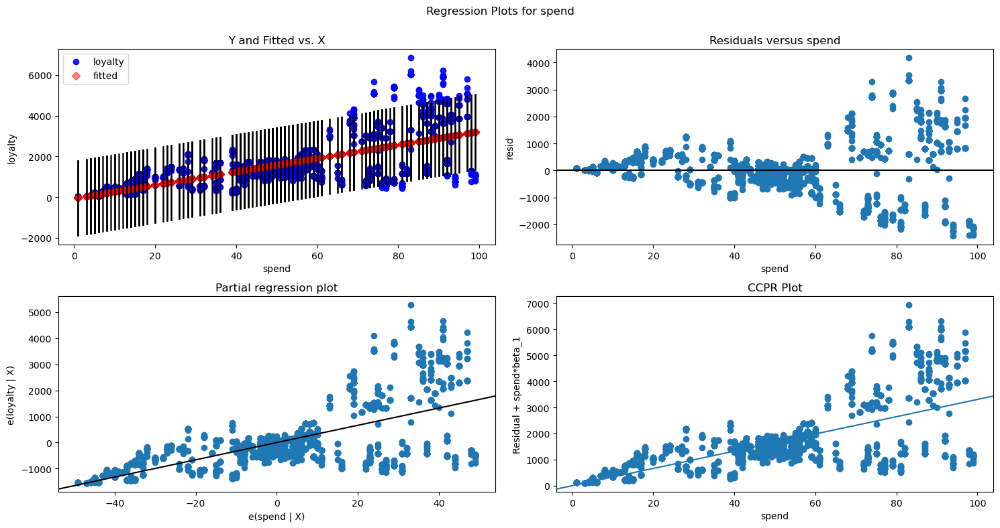

In [55]:
# evaluate the distribution of residuals

# set figure size
fig = plt.figure(figsize=(15,8))

# Produce regression plots.
fig = sm.graphics.plot_regress_exog(model1, 'spend', fig=fig)

> Our residuals versus spend plots (top right) resembles a 'funnel' shape, which indicates heteroscedasticity (unequal variance of errors).
>
> We can try to remove some of this heteroscedasticty by taking the 'natural log' of our 'loyalty' variable, which will be explored below          

# 

## MODEL 2 - Spend vs LOG Loyalty

In [59]:
# Transform loyalty to natural log loyalty to remove uneven variance (heteroscedasicity)
turtle['log_loyalty'] = np.log(turtle['loyalty'])

Text(0.5, 1.0, 'relationship between spend and LOG loyalty')

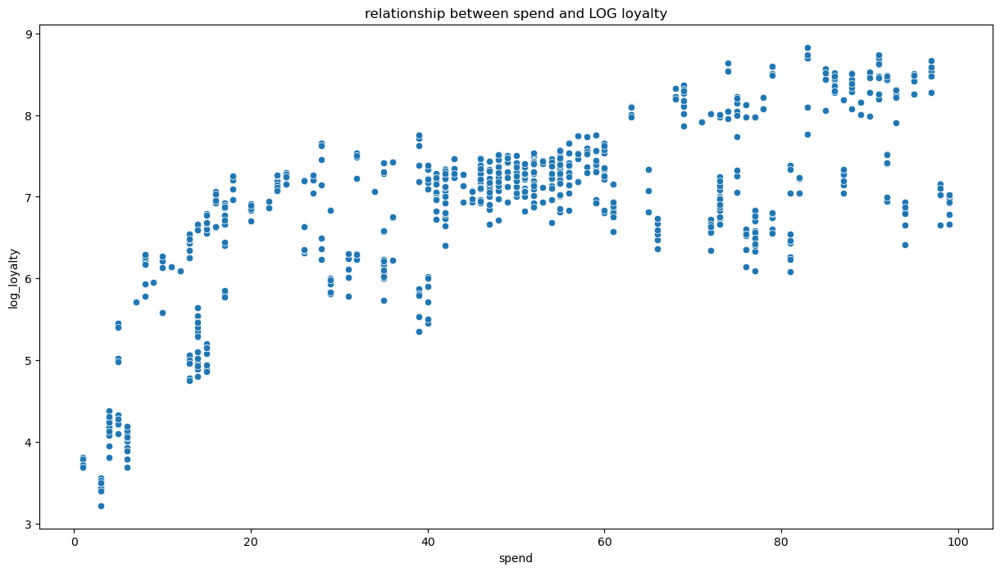

In [60]:
# # determine if there is a linear relationship between spend and log loyalty
sns.scatterplot(data = turtle, x = 'spend', y = 'log_loyalty')
plt.title('relationship between spend and LOG loyalty')

> We can still observe a linear relationship between our independent variable (spend) and our dependent variable (LOG loyalty), but by taking the natural log of our dependent variable (loyalty), we can see that the variation in the above scatterplot has been reduced. We will run the regression model once again, and test for heteroscedasticity using the Breusch-Pagan test.

In [62]:
# Define independent variable.
x = turtle['spend']

# Define dependent variable.
y = turtle['log_loyalty']

In [63]:
# Fit a simple linear regression model using spend to predict log_loyalty.
model2 = ols('log_loyalty ~ spend', data = turtle).fit()

# print the regression table
model2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            log_loyalty   R-squared:                       0.519
Model:                            OLS   Adj. R-squared:                  0.518
Method:                 Least Squares   F-statistic:                     2153.
Date:                Mon, 14 Apr 2025   Prob (F-statistic):          1.44e-319
Time:                        11:22:07   Log-Likelihood:                -2146.7
No. Observations:                2000   AIC:                             4297.
Df Residuals:                    1998   BIC:                             4309.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      5.5740      0.034    162.833      0.000       5.507       5.641
spend          0.0282      0.001     46.400      0.000       0.027       0.029
==============================================================================
Omnibus:                      247.764   Durbin-Watson:                   0.562
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              344.804
Skew:                          -1.000   Prob(JB):                     1.34e-75
Kurtosis:                       3.366   Cond. No.                         122.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### Parameters/errors/predictions

In [65]:
# Extract the estimated parameters.
print("Parameters: ", model2.params)  

# Extract the standard errors.
print("Standard errors: ", model2.bse)  

# Extract the predicted values.
print("Predicted values: ", model2.predict())

Parameters:  Intercept    5.573981
spend        0.028163
dtype: float64
Standard errors:  Intercept    0.034231
spend        0.000607
dtype: float64
Predicted values:  [6.67235588 7.85522067 5.74296212 ... 8.13685514 6.02459659 5.79928901]


In [66]:
# Set the X coefficient and the constant to generate the regression equation
y_pred = (model2.params[1] * turtle['spend']) + model2.params[0]

The correlation between spend & log loyalty is:  0.7201843355260034
The R-Squared value for this model is:  0.5186654771370309


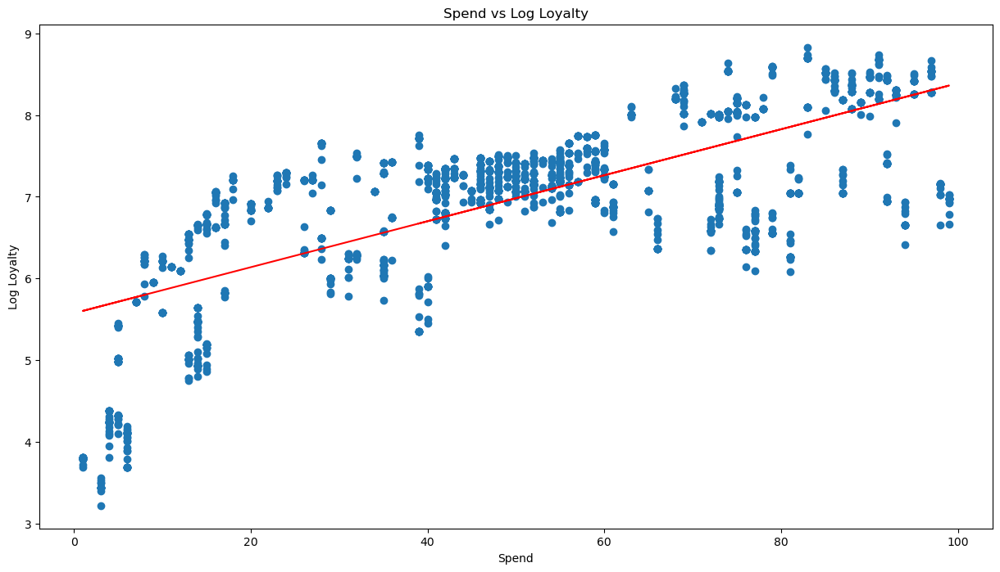

In [67]:
# Plot the graph with a regression line.
plt.scatter(x=turtle['spend'],y=turtle['log_loyalty'])
plt.plot(x,y_pred,color='red')
plt.xlabel('Spend')
plt.ylabel('Log Loyalty')
plt.title('Spend vs Log Loyalty')


print('The correlation between spend & log loyalty is: ',turtle['spend'].corr(turtle['log_loyalty']))
print('The R-Squared value for this model is: ',model2.rsquared)

> By taking the natural log of the dependent variable (loyalty), we can observe a stronger correlation (72%) compared to not taking the log. We also observe a higher R-Squared value in this model (52%) compared to our previous model, suggesting it is a better model at predicting loyalty points 

### Evaluate model 2

In [70]:
# Run the Breusch-Pagan test
bp_test = sms.het_breuschpagan(model2.resid, model2.model.exog)

# store the results of the Breusch-Pagan test in a dictionary
terms = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
result = dict(zip(terms, bp_test))

# view the bp test results
print(result)

# Interpret the results
alpha = 0.05  # Significance level

if result.get('LM Test p-value') < alpha:
    print("Reject the null hypothesis. There is evidence of heteroscedasticity.")
else:
    print("Fail to reject the null hypothesis. There is no evidence of heteroscedasticity.")

{'LM stat': 92.4511694198511, 'LM Test p-value': 6.900660585145353e-22, 'F-stat': 96.83497142491689, 'F-test p-value': 2.404357715983474e-22}
Reject the null hypothesis. There is evidence of heteroscedasticity.


> The LM Test p-value for the Breusch-Pagan Test is less than our significance level (alpha=0.05). We therefore reject the null hypothesis as there is evidence of heteroscedasticty. The LM Test p-value in this model is also larger than the LM Test p-value for Model 1, so this weakens the accuracy of this model.

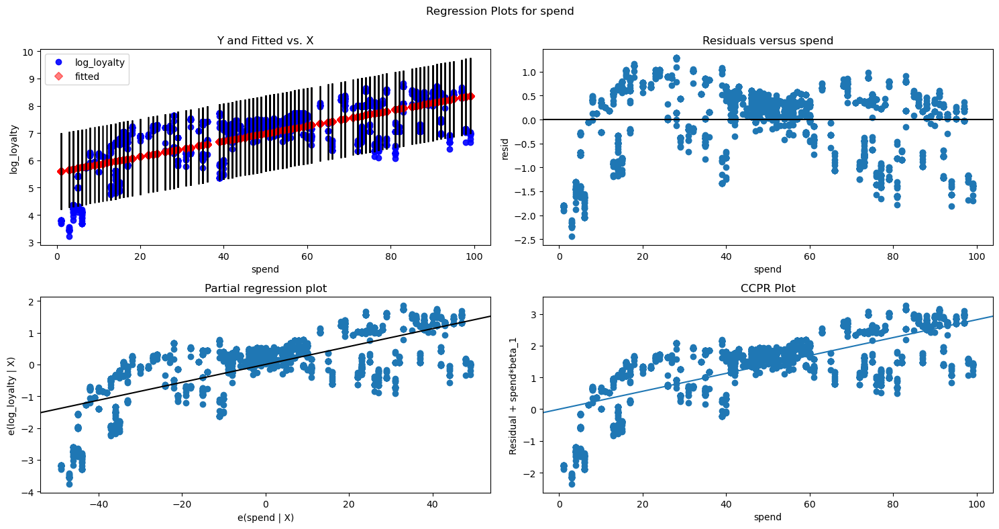

In [72]:
# evaluate the distribution of residuals

# set figure size
fig = plt.figure(figsize=(15,8))

# Produce regression plots.
fig = sm.graphics.plot_regress_exog(model2, 'spend', fig=fig)

> Our residuals versus spend plots (top right) show a much more even variation in residuals, but as determined by the Breusch-Pagan test, there is significant heteroscedasticity, so this should be considered when using this model

# 

## MODEL 3 - Pay vs Loyalty

Text(0.5, 1.0, 'relationship between pay and loyalty')

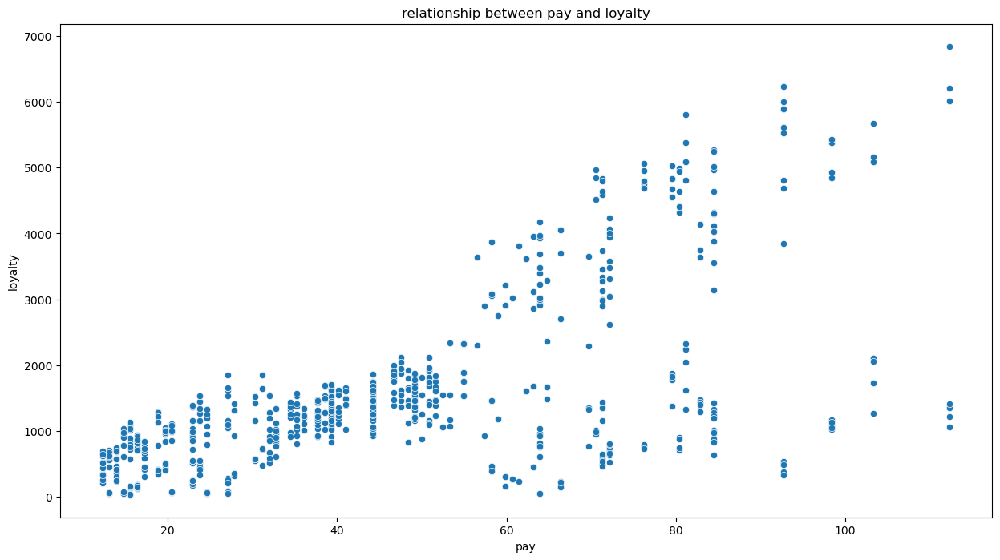

In [76]:
# determine if there is a linear relationship between pay and loyalty
sns.scatterplot(data = turtle, x = 'pay', y = 'loyalty')
plt.title('relationship between pay and loyalty')

> We can clearly see above that there is a significant linear relationship between pay and loyalty. As this assumption has been satisfied, but we can build a simple linear regression model to further analyse this relationship

In [78]:
# Define independent variable.
x = turtle['pay']

# Define dependent variable.
y = turtle['loyalty']

In [79]:
# Create formula and pass through OLS methods.
model3 = ols('loyalty ~ pay', data = turtle).fit()

# Print the regression table.
model3.summary() 

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                loyalty   R-squared:                       0.380
Model:                            OLS   Adj. R-squared:                  0.379
Method:                 Least Squares   F-statistic:                     1222.
Date:                Mon, 14 Apr 2025   Prob (F-statistic):          2.43e-209
Time:                        11:22:13   Log-Likelihood:                -16674.
No. Observations:                2000   AIC:                         3.335e+04
Df Residuals:                    1998   BIC:                         3.336e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    -65.6865     52.171     -1.259      0.208    -168.001      36.628
pay           34.1878      0.978     34.960      0.000      32.270      36.106
==============================================================================
Omnibus:                       21.285   Durbin-Watson:                   3.622
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               31.715
Skew:                           0.089   Prob(JB):                     1.30e-07
Kurtosis:                       3.590   Cond. No.                         123.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### Parameters/errors/predictions

In [81]:
# Extract the estimated parameters.
print("Parameters: ", model3.params)  

# Extract the standard errors.
print("Standard errors: ", model3.bse)  

# Extract the predicted values.
print("Predicted values: ", model3.predict())

Parameters:  Intercept   -65.686513
pay          34.187825
dtype: float64
Standard errors:  Intercept    52.170717
pay           0.977925
dtype: float64
Predicted values:  [ 354.82374068  354.82374068  382.85775758 ... 3102.15739671 3298.39551499
 3102.15739671]


In [82]:
# Set the X coefficient and the constant to generate the regression equation
y_pred = (model3.params[1] * turtle['pay']) + model3.params[0]

The correlation between pay & loyalty is:  0.6160647476356381
The R-Squared value for this model is:  0.3795357732793636


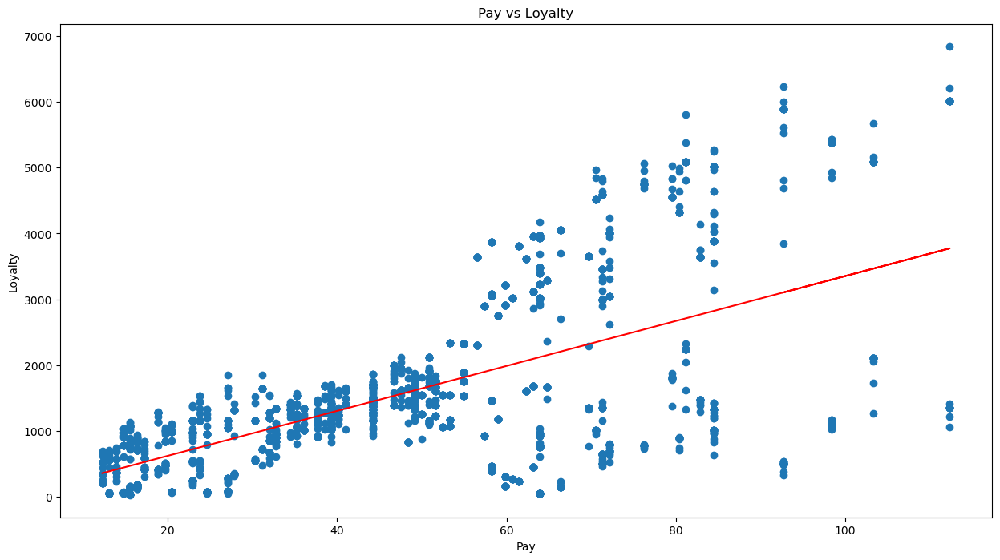

In [83]:
# Plot the graph with a regression line.
plt.scatter(x=turtle['pay'],y=turtle['loyalty'])
plt.plot(x,y_pred,color='red')
plt.xlabel('Pay')
plt.ylabel('Loyalty')
plt.title('Pay vs Loyalty')

print('The correlation between pay & loyalty is: ',turtle['pay'].corr(turtle['loyalty']))
print('The R-Squared value for this model is: ',model3.rsquared)

> The R-Squared in this model is only 38% which is significantly below model 1 and model 2, so not a good model choice at predicting loyalty points

### Evaluate model 3

In [86]:
# Run the Breusch-Pagan test
bp_test = sms.het_breuschpagan(model3.resid, model3.model.exog)

# store the results of the Breusch-Pagan test in a dictionary
terms = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
result = dict(zip(terms, bp_test))

# view the bp test results
print(result)

# Interpret the results
alpha = 0.05  # Significance level

if result.get('LM Test p-value') < alpha:
    print("Reject the null hypothesis. There is evidence of heteroscedasticity.")
else:
    print("Fail to reject the null hypothesis. There is no evidence of heteroscedasticity.")

{'LM stat': 1038.6445487288279, 'LM Test p-value': 7.153051772823832e-228, 'F-stat': 2158.631134421931, 'F-test p-value': 3.68e-320}
Reject the null hypothesis. There is evidence of heteroscedasticity.


> The LM Test p-value for the Breusch-Pagan Test is less than our significance level (alpha=0.05). We therefore reject the null hypothesis as there is evidence of heteroscedasticty

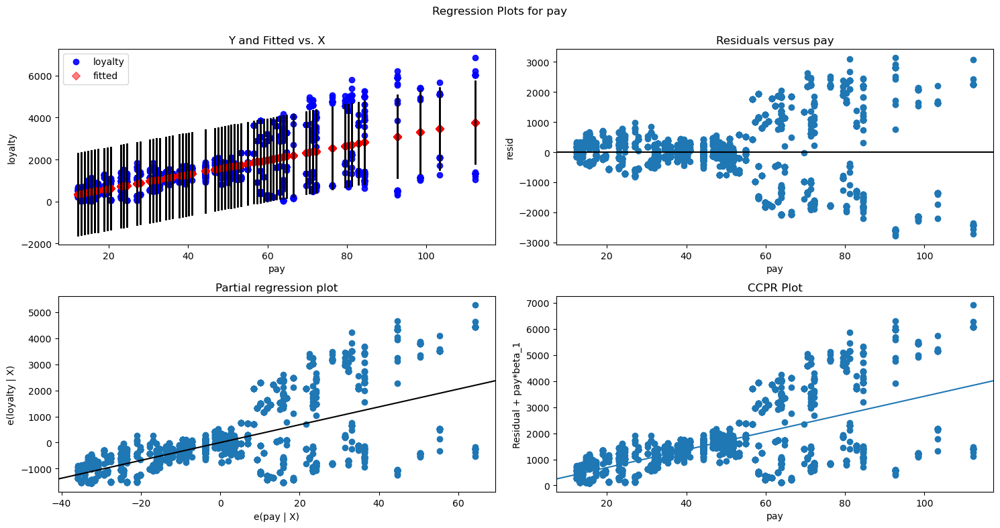

In [88]:
# evaluate the distribution of residuals

# set figure size
fig = plt.figure(figsize=(15,8))

# Produce regression plots.
fig = sm.graphics.plot_regress_exog(model3, 'pay', fig=fig)

> Our residuals versus spend plots (top right) resembles a 'funnel' shape, which indicates heteroscedasticity (unequal variance of errors) as also confirmed by the Breusch-Pagan test 
>
> We can try to remove some of this heteroscedasticty by building another regression model using our LOG loyalty variable VS pay      

# 

## MODEL 4 - Pay vs LOG Loyalty

Text(0.5, 1.0, 'relationship between pay and log  loyalty')

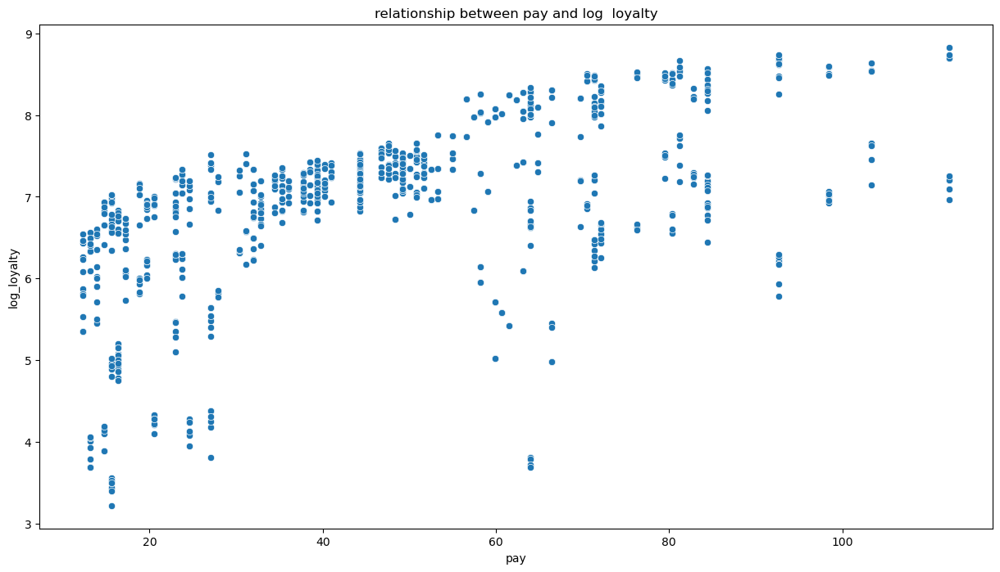

In [92]:
# determine if there is a linear relationship between pay and log loyalty
sns.scatterplot(data = turtle, x = 'pay', y = 'log_loyalty')
plt.title('relationship between pay and log  loyalty')

> We can clearly see that there is a moderately positive linear relationship between pay and loyalty, as such we will explore this further by building a linear regression model

In [94]:
# Define independent variable.
x = turtle['pay']

# Define dependent variable.
y = turtle['log_loyalty']

In [95]:
# Create formula and pass through OLS methods.
model4 = ols('log_loyalty ~ pay', data = turtle).fit()

# Print the regression table.
model4.summary() 

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            log_loyalty   R-squared:                       0.284
Model:                            OLS   Adj. R-squared:                  0.284
Method:                 Least Squares   F-statistic:                     794.3
Date:                Mon, 14 Apr 2025   Prob (F-statistic):          1.98e-147
Time:                        11:22:18   Log-Likelihood:                -2543.1
No. Observations:                2000   AIC:                             5090.
Df Residuals:                    1998   BIC:                             5101.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      5.8505      0.045    131.318      0.000       5.763       5.938
pay            0.0235      0.001     28.184      0.000       0.022       0.025
==============================================================================
Omnibus:                      610.463   Durbin-Watson:                   2.844
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1512.287
Skew:                          -1.669   Prob(JB):                         0.00
Kurtosis:                       5.647   Cond. No.                         123.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### Parameters/errors/predictions

In [97]:
# Extract the estimated parameters.
print("Parameters: ", model4.params)  

# Extract the standard errors.
print("Standard errors: ", model4.bse)  

# Extract the predicted values.
print("Predicted values: ", model4.predict())

Parameters:  Intercept    5.850516
pay          0.023537
dtype: float64
Standard errors:  Intercept    0.044552
pay          0.000835
dtype: float64
Predicted values:  [6.14002166 6.14002166 6.15932201 ... 8.0314559  8.16655834 8.0314559 ]


In [98]:
# Set the X coefficient and the constant to generate the regression equation
y_pred = (model4.params[1] * turtle['pay']) + model4.params[0]

The correlation between pay & log loyalty is:  0.5333588487766295
The R-Squared value for this model is:  0.2844716615683325


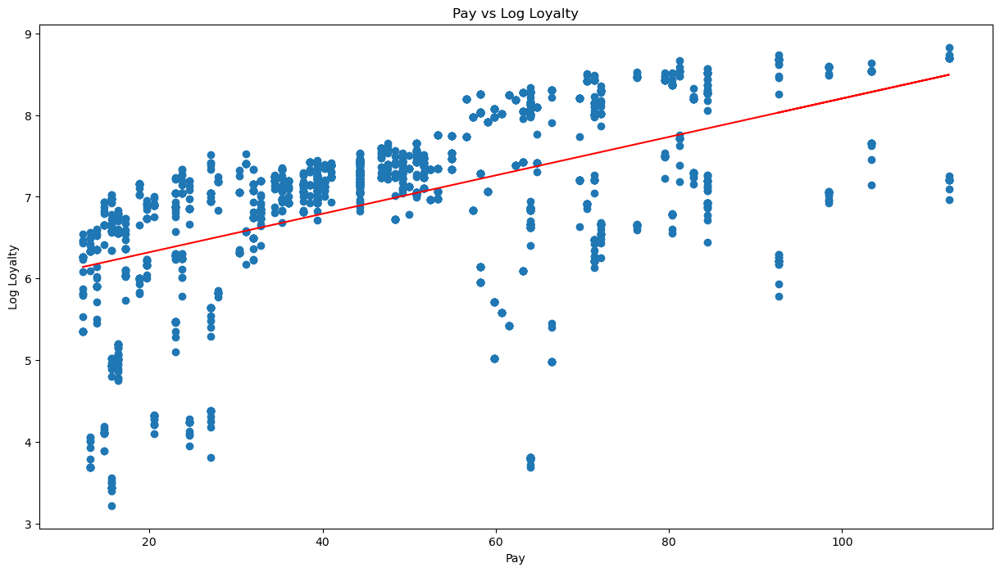

In [99]:
# Plot the graph with a regression line.
plt.scatter(x=turtle['pay'],y=turtle['log_loyalty'])
plt.plot(x,y_pred,color='red')
plt.xlabel('Pay')
plt.ylabel('Log Loyalty')
plt.title('Pay vs Log Loyalty')

print('The correlation between pay & log loyalty is: ',turtle['pay'].corr(turtle['log_loyalty']))
print('The R-Squared value for this model is: ',model4.rsquared)

> Our R-Squared value in this model is 28% which is again very low and worse compared to Model 1-3, so we can say pay is not a significant predictor of log loyalty points compared to spending score 

### Evaluate model 4

In [102]:
# Run the Breusch-Pagan test
bp_test = sms.het_breuschpagan(model4.resid, model4.model.exog)

# store the results of the Breusch-Pagan test in a dictionary
terms = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
result = dict(zip(terms, bp_test))

# view the bp test results
print(result)

# Interpret the results
alpha = 0.05  # Significance level

if result.get('LM Test p-value') < alpha:
    print("Reject the null hypothesis. There is evidence of heteroscedasticity.")
else:
    print("Fail to reject the null hypothesis. There is no evidence of heteroscedasticity.")

{'LM stat': 0.0476462601837202, 'LM Test p-value': 0.8272107748010233, 'F-stat': 0.04759974789850008, 'F-test p-value': 0.8273160836306521}
Fail to reject the null hypothesis. There is no evidence of heteroscedasticity.


> The LM Test p-value for the Breusch-Pagan Test is more than our significance level (alpha=0.05). We therefore fail to reject the null hypothesis as there is no evidence of heteroscedasticty

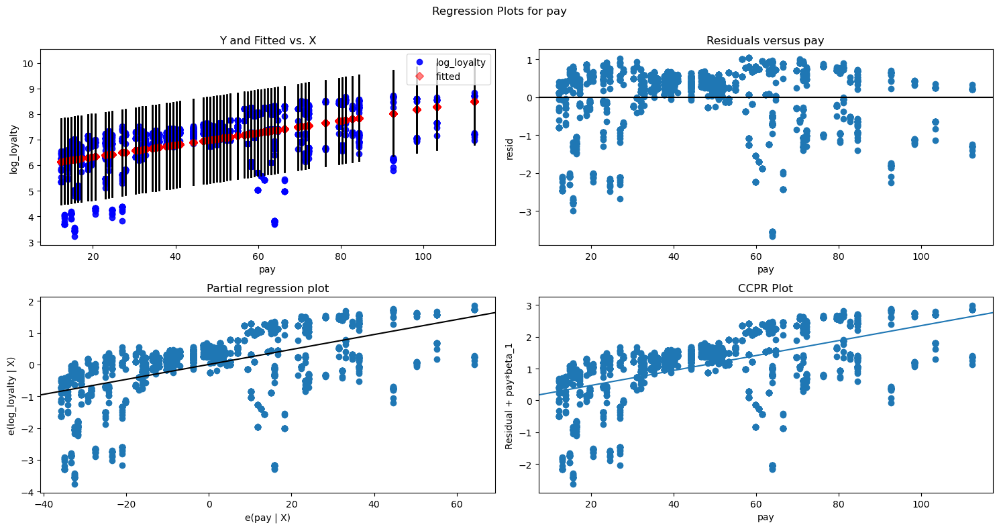

In [104]:
# evaluate the distribution of residuals

# set figure size
fig = plt.figure(figsize=(15,8))

# Produce regression plots.
fig = sm.graphics.plot_regress_exog(model4, 'pay', fig=fig)

> Our residuals versus spend plots (top right) shows the residuals are randomly scattered around 0, so our model is doing a decent job of capturing patterns in the data, but there does seem to be a significant presence of outliers which are affecting the model. Although there is no evidence of heteroscedasticity as confirmed by the Breusch-Pagan test, our R-Squared value is very low (0.284) at explaining the variance in log loyalty. However the p values for both the intercept and slope estimates are well below 0.05 suggesting a statistically significant relationship.

#

## MODEL 5 - Age vs Loyalty

Text(0.5, 1.0, 'relationship between age and loyalty')

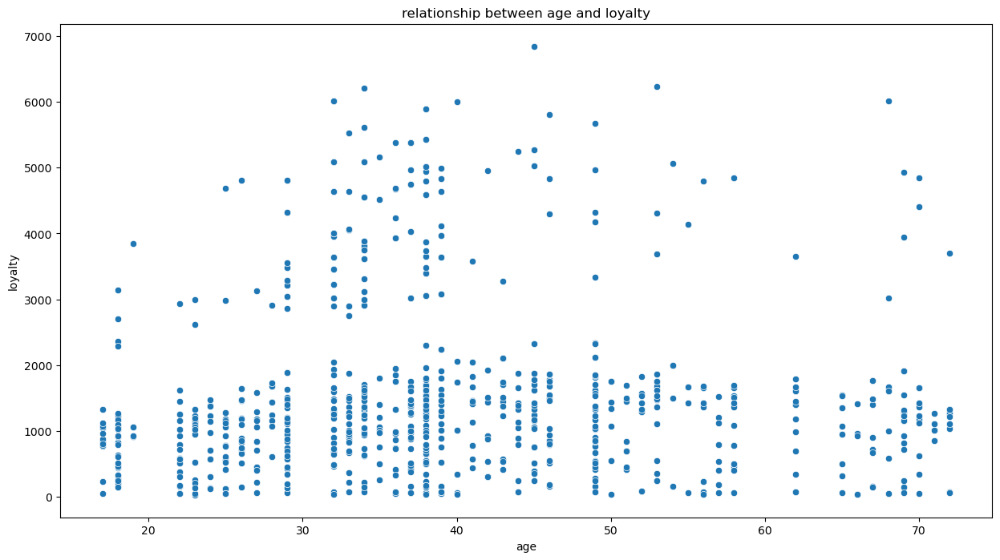

In [108]:
# determine if there is a linear relationship between age and loyalty
sns.scatterplot(data = turtle, x = 'age', y = 'loyalty')
plt.title('relationship between age and loyalty')

> Looking at the scatterplot, there is no linear relationship between pay and loyalty. We'll conduct a linear regression anyways just to confirm our predictions and see if anything interesting comes up.

In [110]:
# Define independent variable.
x = turtle['age']

# Define dependent variable.
y = turtle['loyalty']

In [111]:
# Create formula and pass through OLS methods.
model5 = ols('loyalty ~ age', data = turtle).fit()

# Print the regression table.
model5.summary() 

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                loyalty   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     3.606
Date:                Mon, 14 Apr 2025   Prob (F-statistic):             0.0577
Time:                        11:22:24   Log-Likelihood:                -17150.
No. Observations:                2000   AIC:                         3.430e+04
Df Residuals:                    1998   BIC:                         3.431e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1736.5177     88.249     19.678      0.000    1563.449    1909.587
age           -4.0128      2.113     -1.899      0.058      -8.157       0.131
==============================================================================
Omnibus:                      481.477   Durbin-Watson:                   2.277
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              937.734
Skew:                           1.449   Prob(JB):                    2.36e-204
Kurtosis:                       4.688   Cond. No.                         129.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### Parameters/errors/predictions

In [113]:
# Extract the estimated parameters.
print("Parameters: ", model5.params)  

# Extract the standard errors.
print("Standard errors: ", model5.bse)  

# Extract the predicted values.
print("Predicted values: ", model5.predict())

Parameters:  Intercept    1736.517739
age            -4.012805
dtype: float64
Standard errors:  Intercept    88.248731
age           2.113177
dtype: float64
Predicted values:  [1664.2872467  1644.22322095 1648.2360261  ... 1600.0823643  1600.0823643
 1608.1079746 ]


In [114]:
# Set the X coefficient and the constant to generate the regression equation
y_pred = (model5.params[1] * turtle['age']) + model5.params[0]

The correlation between age & loyalty is:  -0.0424446468205419
The R-Squared value for this model is:  0.0018015480437204578


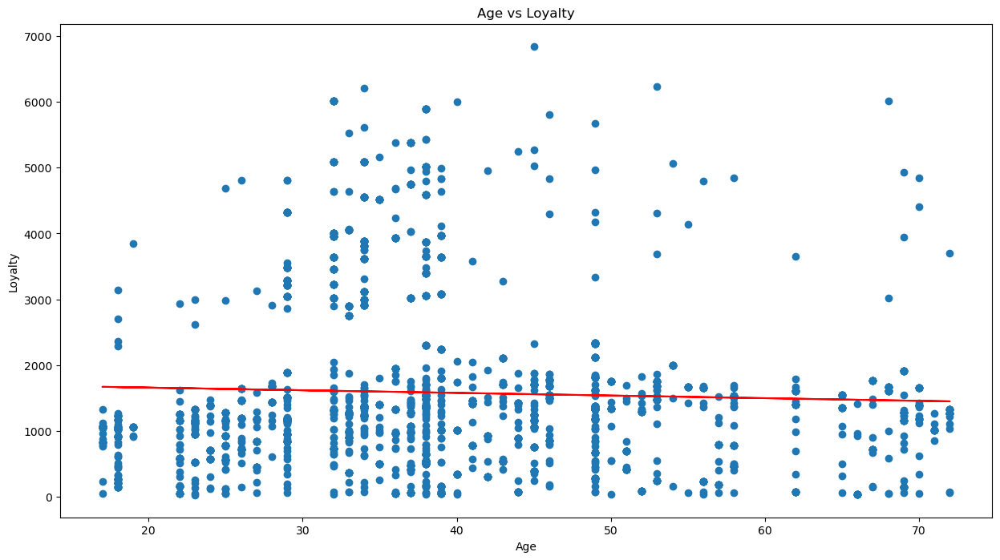

In [115]:
# Plot the graph with a regression line.
plt.scatter(x=turtle['age'],y=turtle['loyalty'])
plt.plot(x,y_pred,color='red')
plt.xlabel('Age')
plt.ylabel('Loyalty')
plt.title('Age vs Loyalty')

print('The correlation between age & loyalty is: ',turtle['age'].corr(turtle['loyalty']))
print('The R-Squared value for this model is: ',model5.rsquared)

> As seen above, there is no linear relationship between Age and Loyalty, so we can confirm Age is not a predictor of Loyalty Points.
>
> There is no need to evaluate this model as there is no linear relationship between age and loyalty.

# 

## Age vs Spend

Text(0.5, 1.0, 'relationship between age and spend')

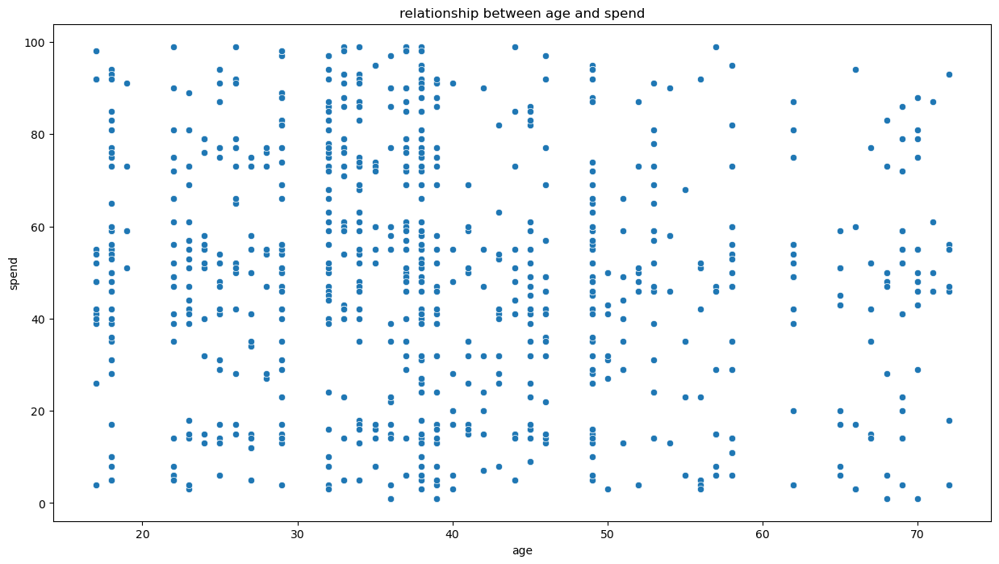

In [119]:
# determine if there is a linear relationship between age and spend
sns.scatterplot(data = turtle, x = 'age', y = 'spend')
plt.title('relationship between age and spend')

> There is no relationship between age and spend, so a linear regression model is not sufficient for this

## Age vs Pay

Text(0.5, 1.0, 'relationship between age and pay')

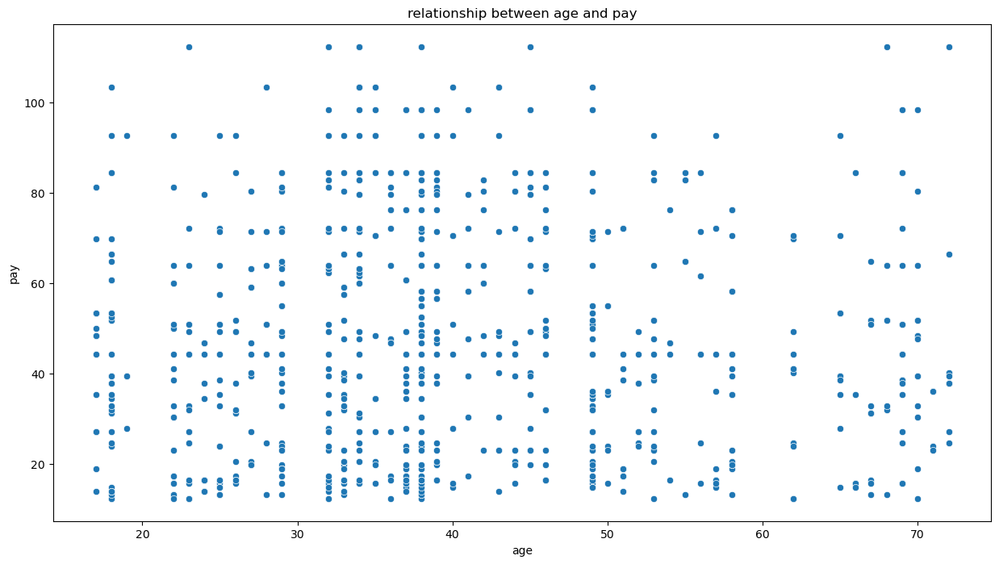

In [122]:
# determine if there is a linear relationship between age and spend
sns.scatterplot(data = turtle, x = 'age', y = 'pay')
plt.title('relationship between age and pay')

> There is no relationship between age and spend, so a linear regression model is not sufficient for this

## Pay vs Spend

Text(0.5, 1.0, 'relationship between spend and pay')

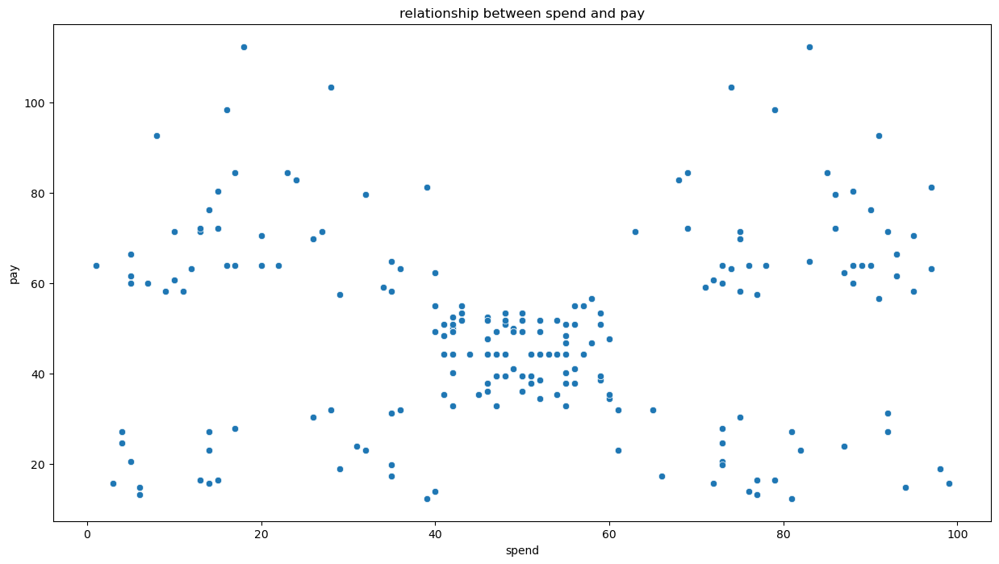

In [125]:
# determine if there is a linear relationship between pay and spend
sns.scatterplot(data = turtle, x = 'spend', y = 'pay')
plt.title('relationship between spend and pay')

> There is no linear relationship between pay and spend, so a regression will not be performed.
> 
> However there is evidence of clustering which will be explored later.

#

# Observations from Simple Linear Regression

> There is a significant linear relationship between Spend and Loyalty points. However loyalty points are accumulated based on the amount spent by a customer, so there is likely to be some sort of relationship between these 2 variables. In Model 1 we observed a R-Squared figure of 45% which is moderate, but the models validity was undermined by heteroscedasicity as confirmed by the Breusch-Pagan test. In Model 2 we took the natural log of the loyalty points variable to try 'even out' some of this heteroscedasicity. This had the benefit of increasing our R-Squared value to 51% but heteroscedasicity still exists in the data.
>
> There is also a significant linear relationship between Pay and Loyalty. In Model 3 we observed an R-Squared figure of 38% which is quite low and there was also evidence of heteroscedasicity which violates an assumption of this model. In Model 4 we compared Pay VS the natural log of the loyalty points variable to try 'even out' some of this heteroscedasicity, but our R-Squared figure dropped to 28%, although there was no evidence of heteroscedasicity as confirmed by the Breusch-Pagan test.
>
> There is no clear linear relationship between Age and Loyalty (Model 5), with our OLS model showing a R-Squared figure of 0.2%
>
> There is no linear relationship between Age and Spend , Age and Pay and Pay and Spend which we can explore in greater detail in a multiple regression model due to the absence of multicollinearity between these variables. This will be explored in the next step
>
> Pay vs Spend interestingly show signs of a clustering relationship, which we will also explore further later on.

#

# Multiple Linear regression

### Multiple Linear regression will be performed using Pay and Spend to predict Loyalty. We will also repeat the process using the natural Log Loyalty

In [133]:
# We will use the same data frame (turtle) in this multiple linear regression. Let's just confirm the metadata again
turtle.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   gender       2000 non-null   object 
 1   age          2000 non-null   int64  
 2   pay          2000 non-null   float64
 3   spend        2000 non-null   int64  
 4   loyalty      2000 non-null   int64  
 5   education    2000 non-null   object 
 6   product      2000 non-null   int64  
 7   review       2000 non-null   object 
 8   summary      2000 non-null   object 
 9   log_loyalty  2000 non-null   float64
dtypes: float64(2), int64(4), object(4)
memory usage: 156.4+ KB


## MODEL 6 - Spend & Pay VS Loyalty

In [135]:
# define independent variables as X
X = turtle[['spend','pay']]

# define dependent variable as y
y = turtle['loyalty']

### Assumption 1: Linearity
- This assumption states that there is a linear relationship between each predictor variable and the response variable
- Our predictor variables are 'spend' and 'pay' and our response variable is 'loyalty'

- Assumption 1 was satisfied - See above Model 1 showing linear relationship between spend & loyalty, and see Model 3 showing linear relationship between pay & loyalty.

In [137]:
# initialise the linear regression model
mlr = linear_model.LinearRegression()

# fit the regression model
mlr.fit(X,y)

LinearRegression()

In [138]:
# call the predictions for X (predict loyalty points based on spending and pay
mlr.predict(X)

array([ 4.57831319e-01,  1.38195101e+03, -1.05713790e+03, ...,
        4.44147048e+03,  2.16956070e+03,  1.71137682e+03])

### Key Metrics

In [140]:
# print the metrics from the linear regression model
print(f"R-Squared:  {mlr.score(X,y)}")
print(f"Intercept:  {mlr.intercept_}")
print(f"Coefficients:  {list(zip(X,mlr.coef_))}")

R-Squared:  0.8269134701989259
Intercept:  -1700.3050970144357
Coefficients:  [('spend', 32.89269468782097), ('pay', 33.97949882180282)]


### Observations
- Our R-squared value is 0.83, which means 83% of the variation in loyalty points can be explained by spend and pay
- Coefficient for spend is 32.9, which means holding 'pay' constant, a 1 unit increase in spend would result in a 32.9 unit increase in loyalty points.
 - Coefficient for pay is 33.9, which means holding 'spend' constant, a 1 unit increase in pay would result in a 33.9 unit increase in loyalty points.

## Train and test the MLR model

In [143]:
# split the data into training = 80% and testing = 20%
X_train, X_test, y_train, y_test = sklearn.model_selection.train_test_split(X,y,test_size = 0.2, random_state = 42)

In [144]:
# train the model using the statsmodel OLS library, fitting the model with the added constant
model = sm.OLS(y_train,sm.add_constant(X_train)).fit()

# set the predicted response vector
y_pred = model.predict(sm.add_constant(X_test))

# view the model summary
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                loyalty   R-squared:                       0.830
Model:                            OLS   Adj. R-squared:                  0.830
Method:                 Least Squares   F-statistic:                     3895.
Date:                Mon, 14 Apr 2025   Prob (F-statistic):               0.00
Time:                        11:22:32   Log-Likelihood:                -12307.
No. Observations:                1600   AIC:                         2.462e+04
Df Residuals:                    1597   BIC:                         2.464e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -1700.3237     39.588    -42.950      0.000   -1777.974   -1622.674
spend         32.6439      0.510     63.947      0.000      31.643      33.645
pay           34.3346      0.574     59.838      0.000      33.209      35.460
==============================================================================
Omnibus:                        2.977   Durbin-Watson:                   2.034
Prob(Omnibus):                  0.226   Jarque-Bera (JB):                2.923
Skew:                           0.075   Prob(JB):                        0.232
Kurtosis:                       3.147   Cond. No.                         220.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

## Observations
- We had 2000 total observations in the whole dataset, but set 80% to be the training subset which gives us 1600 observations in this OLS model. 
- R-squared = 0.830. So 83% variation in loyalty points can be explained by spend and pay
- P-value = 0.000. Comparing to a signficance level of 0.05, this result is statistically significant.
- std error for spending_score = 0.510
- std error for remenuration = 0.574
- Confidence intervals. Assuming a significance level of 0.05, we are 95% confident that the true value of our spend coefficient is between 31.643-33.645 AND our pay coefficient is between 33.209-35.460.

In [146]:
# Run a regression test.

# Initialise the Linear Regression model
mlr = LinearRegression()  

# Fit the model. We can only fit the model with the training data set.
mlr.fit(X_train, y_train)

LinearRegression()

In [147]:
# call the prediction for X in the test set
y_pred = mlr.predict(X_test)

# view the predictions
print(f"the prediction for the test set is: {y_pred}")

the prediction for the test set is: [ -725.11711735  2976.65149188  2644.50590347  1416.28990278
  1434.2479047   1535.45165243   709.53845826  1358.38381754
  1577.07452533  3212.92022784  1170.66219209  1588.48826342
  1589.70563198  2360.07003078  1201.63127443  1582.78139438
  1642.74224297   657.71921584  -106.10091912  -833.24510268
  1354.27429082  -188.12929636  1754.52233399  1256.34267501
  1422.83416662  1616.64263488  3855.98127081  1541.53849524
  1742.27120111  1956.16988192   128.11305348   859.2893165
  1075.54528717  1575.01976198  1484.84977857  1179.64119305
   979.28846095  1756.19712359  1517.4936505    979.28846095
  1217.15453924  1577.07452533  1440.79216854  4253.41460309
  4257.06670877  -454.98714089  1575.01976198  1434.2479047
  1474.65340904  1468.94654     1548.46273285   960.11309046
   796.89373078  -647.57824059  1640.30750585  1527.31004626
   311.72515222  3974.30562567  1548.46273285  3233.31296689
  1306.94454888  1517.4936505   1283.27967791  1434

In [148]:
# Print the R-squared value
print(mlr.score(X_test, y_test))

0.8144236432529975


> Our first multiple linear regression model using pay & spend explains 81% of the variance, suggesting that they are strong predictors of loyalty. As also confirmed earlier above they are not correlated to each other. But we will test for multicollinearity by measuring the VIF (Variance Inflation Factor)

### Assumption 2: No perfect multicollinearity
- This assumption states that none of the predictor variables are highly correlated with each other
-  This can be checked by calculating the Variance Inflation Factor (VIF) for each predictor variable. If the VIF values are all less than 5, this assumption is met

### Check for multicollinearity

In [152]:
# variance inflation factor

# add a constant
x_temp = sm.add_constant(X_train)

# create an empty data frame
vif = pd.DataFrame()

# calculate VIF factors
vif['VIF Factor'] = [variance_inflation_factor(x_temp.values,i) for i in range(x_temp.values.shape[1])]

# create the feature columns
vif['Features'] = x_temp.columns

# view the df
vif.round(2)

,VIF Factor,Features
0,8.91,const
1,1.00,spend
2,1.00,pay


>  VIF values equal to 1 indicate there is no multicollinearity. Therfore the assumption of no multicollinearity for an MLR model has been met.

### Assumption 3: Check for Homoscedasticity
- This assumption states that the residuals have constant variance at every point in the linear model. When this is not the case, the residuals are said to suffer from heteroscedasticity
-  Homoscedasticity can be checked by running a Breusch-Pagan Test

### Test for homoscedasticity with the Breusch-Pagan test

In [156]:
# Run the OLS model on the data.
f = 'y ~ X'

# fit the model 
test = ols(f, data = turtle).fit()

# Run the Breusch-Pagan test
bp_test = sms.het_breuschpagan(test.resid, test.model.exog)

# store the results of the Breusch-Pagan test in a dictionary
terms = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
result = dict(zip(terms, bp_test))

# view the bp test results
print(result)

# Interpret the results
alpha = 0.05  # Significance level

if result.get('LM Test p-value') < alpha:
    print("Reject the null hypothesis. There is evidence of heteroscedasticity.")
else:
    print("Fail to reject the null hypothesis. There is no evidence of heteroscedasticity.")

{'LM stat': 53.72656673046961, 'LM Test p-value': 2.1548858465060076e-12, 'F-stat': 27.56343274452159, 'F-test p-value': 1.554526362973394e-12}
Reject the null hypothesis. There is evidence of heteroscedasticity.


> As the LM Test p-value is less than our significance level (alpha=0.05), we reject the null hypothesis and assume there is evidence of  heteroscedasticity, which violoates assumption 3 of our model. This undermines the robustness of our model

### Assumption 4: Check for Normality of error terms/residuals
- This assumption implies that the residuals of the model are normally distributed.
- This can be checked by creating a histogram of the residuals or a Q-Q plot. If the residuals are normally distributed, this assumption is met.

### Calculate the residuals

In [160]:
# define the residuals
residuals = y_test - y_pred

Text(0.5, 1.0, 'histogram of residuals - model 6')

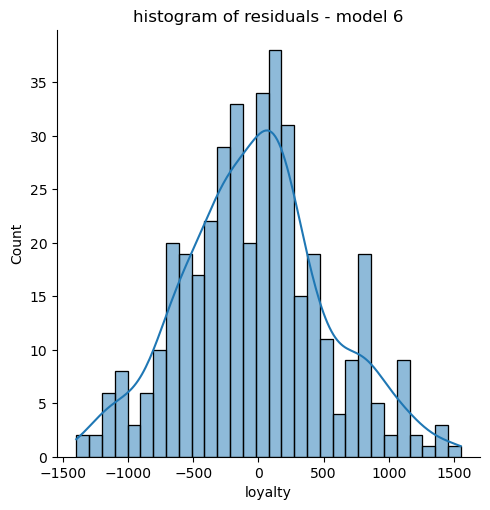

In [161]:
# plot the residuals using a histogram
sns.displot(residuals,bins=30,kde='True')
plt.title('histogram of residuals - model 6')

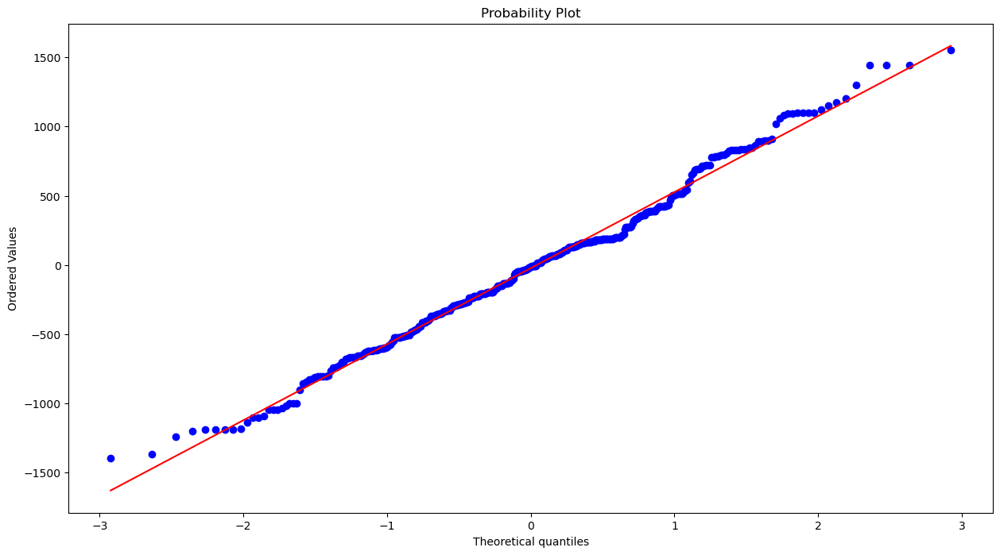

In [162]:
# plot the residuals using a qq plot
stats.probplot(residuals,dist='norm',plot=pylab)
pylab.show()

> Our histogram and qq plot show that the residuals are 'almost' normally distributed.
> 
> Thus we can conclude that assumption 4 has been met

### Assumption 5: No autocorrelation of residuals
- This assumption states that the residuals are independent of one another. In other words, the residual at one point does not depend on the residuals at other points
- This can be checked by creating a plot of the residuals against the time period
- As our data has no time series, this asssumption cannot be tested

### Assumption 6 : Mean of Residuals
- This assumption implies that the residuals (the differences between the observed and predicted values) have a mean of zero. In other words, the average error of the model is zero

In [166]:
# calculate the mean of residuals
residuals.mean()

-23.065547898552627

> In this case our residuals have a mean below 0, which means that our predicated values are too high. This coud possibly be explained by outliers in the dataset. However 23 units below 0 isn't a massive difference, so we can assume that this assumption has also been met.

## Error evaluation

In [169]:
# View the Mean Absolute Error, Mean Squared Error, Root Mean Squared Error
print('Mean Absolute Error (MAE):', metrics.mean_absolute_error(y_test,y_pred))
print('Mean Squared Error (MSE):', metrics.mean_squared_error(y_test,y_pred))
print('Root Mean Squared Error (RMSE):', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

Mean Absolute Error (MAE): 429.66362016909113
Mean Squared Error (MSE): 300944.0917834269
Root Mean Squared Error (RMSE): 548.5837144715716


> Interpreting the Root Mean Squared Error value of 548.6 tells us that, on average our predicted value for loyalty points is 'off' by 548.6 loyalty points compared to our actual values for loyalty points.
>
> Given that the 'Mean' of our loyalty points variable is 1578, being off by 548.6 points is quite high and again undermines the robustness of this model.                                                                

Text(0.5, 1.0, 'Multiple Linear Regression Model using pay and spend to predict loyalty')

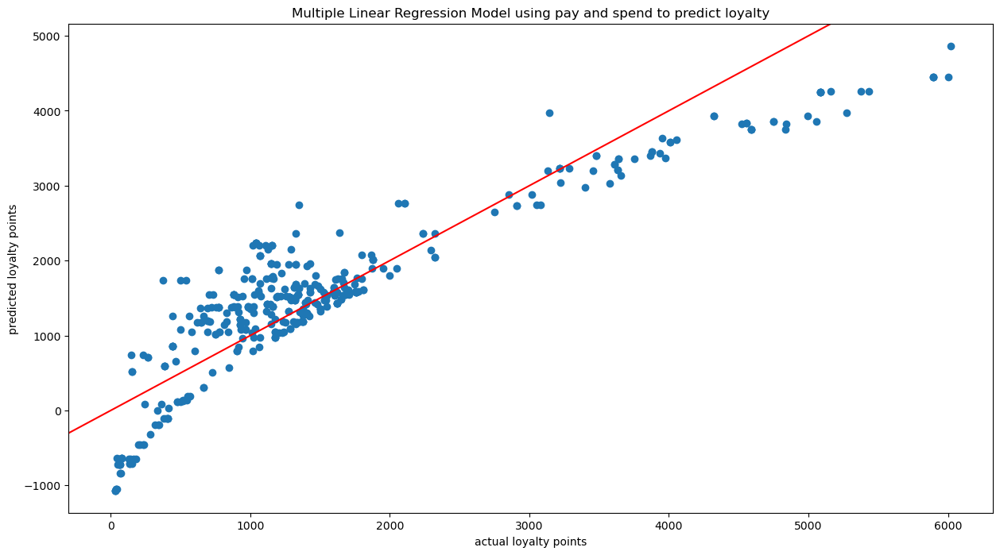

In [171]:
# visualise the predicted vs actual in a scatterplot
plt.scatter(x=y_test,y=y_pred)
plt.axline([0, 0], slope=1, color='red')
plt.xlabel('actual loyalty points')
plt.ylabel('predicted loyalty points')
plt.title('Multiple Linear Regression Model using pay and spend to predict loyalty')

> If the scatterplot forms a straight line then we know our predictions are highly accurate against the actual values, which in our case shows that there is a significant level of deviation from a straight line.

## Spend & Pay vs LOG Loyalty - MODEL 7

In [174]:
# define independent variables as X
X = turtle[['spend','pay']]

# define dependent variable as y
y = turtle['log_loyalty']

### Assumption 1: Linearity
- This assumption states that there is a linear relationship between each predictor variable and the response variable
- Our predictor variables are 'spend' and 'pay' and our response variable is ' LOG loyalty'

- Assumption 1 was satisfied - See above Model 2 showing linear relationship between spend & LOG loyalty, and see Model 4 showing linear relationship between pay & LOG loyalty.

In [176]:
# initialise the linear regression model
mlr = linear_model.LinearRegression()

# fit the regression model
mlr.fit(X,y)

LinearRegression()

In [177]:
# call the predictions for X (predict log loyalty points based on spending and pay
mlr.predict(X)

array([5.83785743, 7.0158427 , 4.93145226, ..., 9.17347463, 7.2040123 ,
       6.84555135])

### Key Metrics

In [179]:
# print the metrics from the linear regression model
print(f"R-Squared:  {mlr.score(X,y)}")
print(f"Intercept:  {mlr.intercept_}")
print(f"Coefficients:  {list(zip(X,mlr.coef_))}")

R-Squared:  0.7988505988825918
Intercept:  4.456693665767278
Coefficients:  [('spend', 0.028047268432936808), ('pay', 0.023359373384854536)]


### Observations
- Our R-squared value is 0.80, which means 80% of the variation in log loyalty points can be explained by spend and pay
- Coefficient for spend is 0.03, which means holding 'pay' constant, a 1 unit increase in spending score would result in a 0.03 unit increase in log loyalty.
 - Coefficient for pay is 0.02, which means holding 'spend' constant, a 1 unit increase in pay would result in a 0.02 unit increase in log loyalty.

## Train and test the MLR model

In [182]:
# split the data into training = 80% and testing = 20%
X_train, X_test, y_train, y_test = sklearn.model_selection.train_test_split(X,y,test_size = 0.2, random_state = 42)

In [183]:
# train the model using the statsmodel OLS library, fitting the model with the added constant
model = sm.OLS(y_train,sm.add_constant(X_train)).fit()

# set the predicted response vector
y_pred = model.predict(sm.add_constant(X_test))

# view the model summary
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            log_loyalty   R-squared:                       0.795
Model:                            OLS   Adj. R-squared:                  0.795
Method:                 Least Squares   F-statistic:                     3102.
Date:                Mon, 14 Apr 2025   Prob (F-statistic):               0.00
Time:                        11:22:40   Log-Likelihood:                -1048.6
No. Observations:                1600   AIC:                             2103.
Df Residuals:                    1597   BIC:                             2119.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          4.4423      0.035    127.649      0.000       4.374       4.511
spend          0.0283      0.000     63.072      0.000       0.027       0.029
pay            0.0233      0.001     46.206      0.000       0.022       0.024
==============================================================================
Omnibus:                      485.405   Durbin-Watson:                   2.017
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1548.844
Skew:                          -1.511   Prob(JB):                         0.00
Kurtosis:                       6.756   Cond. No.                         220.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

## Observations
- We had 2000 total observations in the whole dataset, but set 80% to be the training subset which gives us 1600 observations in this OLS model. 
- R-squared = 0.80. So 80% variation in LOG loyalty points can be explained by spend and pay
- P-value = 0.000. Comparing to a signficance level of 0.05, this result is statistically significant.
- std error for spend = 0.510
- std error for pay = 0.574
- Confidence intervals. Assuming a significance level of 0.05, we are 95% confident that the true value of our spend coefficient is between 0.027-0.029 AND our pay coefficient is between 0.022-0.024.

In [185]:
# Run a regression test.

# Initialise the Linear Regression model
mlr = LinearRegression()  

# Fit the model. We can only fit the model with the training data set.
mlr.fit(X_train, y_train)

LinearRegression()

In [186]:
# call the prediction for X in the test set
y_pred = mlr.predict(X_test)

# view the predictions
print(f"the prediction for the test set is: {y_pred}")

the prediction for the test set is: [5.12879945 8.08396964 7.82778697 6.81587889 6.85264873 6.9827952
 6.13950134 6.96706853 7.02948352 8.33652218 6.69830914 6.97578082
 6.939737   7.43807356 6.49196474 7.00263217 6.93272262 6.11047191
 5.7026079  5.06154814 6.80450836 5.57318745 6.89184249 6.71959815
 6.90635143 6.99489176 8.7668814  6.80257614 6.8282213  7.45887087
 5.87388036 6.25344097 6.3879436  6.94820344 6.91772197 6.71669406
 6.53768118 7.12649029 6.94602537 6.53768118 6.60082221 7.02948352
 6.94312127 9.07967087 8.97153944 5.37361158 6.94820344 6.85264873
 6.93538086 6.96223221 6.73968097 6.53695516 6.39543815 5.24902745
 7.00481024 7.08173418 5.98007958 8.81647382 6.73968097 8.30120439
 6.78467139 6.94602537 6.77475291 6.85264873 7.18842512 6.71161189
 8.2970941  6.13176093 7.17463066 7.17317861 6.7924118  8.80582931
 8.97153944 6.53768118 8.45191386 6.60082221 7.02948352 8.2970941
 6.86910143 5.7026079  6.6898427  6.58509553 6.63468795 6.73968097
 7.43807356 6.9827952  6.159

In [187]:
# Print the R-squared value
print(mlr.score(X_test, y_test))

0.8142573833960147


- When applied to the test set, the model built using the train set explains 81% of the variance. This suggests spend and pay are both strong predictors of loyalty, and they do not appear to be correlated with eachother

In [189]:
# Exponentiate predictions and actual values back to original loyalty scale
y_pred_original = np.exp(y_pred)
y_test_original = np.exp(y_test)

### Assumption 2: No perfect multicollinearity
- This assumption states that none of the predictor variables are highly correlated with each other
-  This can be checked by calculating the Variance Inflation Factor (VIF) for each predictor variable. If the VIF values are all less than 5, this assumption is met

### Check for multicollinearity

In [192]:
# variance inflation factor

# add a constant
x_temp = sm.add_constant(X_train)

# create an empty data frame
vif = pd.DataFrame()

# calculate VIF factors
vif['VIF Factor'] = [variance_inflation_factor(x_temp.values,i) for i in range(x_temp.values.shape[1])]

# create the feature columns
vif['Features'] = x_temp.columns

# view the df
vif.round(2)

,VIF Factor,Features
0,8.91,const
1,1.00,spend
2,1.00,pay


>  VIF values equal to 1 indicate there is no multicollinearity. Therfore the assumption of no multicollinearity for an MLR model has been met.

### Assumption 3: Check for Homoscedasticity
- This assumption states that the residuals have constant variance at every point in the linear model. When this is not the case, the residuals are said to suffer from heteroscedasticity
-  Homoscedasticity can be checked by running a Breusch-Pagan Test

### Test for Homoscedasticity with a Breusch-Pagan Test

In [196]:
# Run the OLS model on the data.
f = 'y ~ X'

# fit the model
test = ols(f, data = turtle).fit()

# Run the Breusch-Pagan test
bp_test = sms.het_breuschpagan(test.resid, test.model.exog)

# store the results of the Breusch-Pagan test in a dictionary
terms = ['LM stat', 'LM Test p-value', 'F-stat', 'F-test p-value']
result = dict(zip(terms, bp_test))

# view the bp test results
print(result)

# Interpret the results
alpha = 0.05  # Significance level

if result.get('LM Test p-value') < alpha:
    print("Reject the null hypothesis. There is evidence of heteroscedasticity.")
else:
    print("Fail to reject the null hypothesis. There is no evidence of heteroscedasticity.")

{'LM stat': 158.57636939286124, 'LM Test p-value': 3.677722072055153e-35, 'F-stat': 85.98700603541502, 'F-test p-value': 1.5049803293148506e-36}
Reject the null hypothesis. There is evidence of heteroscedasticity.


> As the LM Test p-value is less than our significance level (alpha=0.05), we reject the null hypothesis and assume there is evidence of  heteroscedasticity, which violoates assumption 3 of our model. This undermines the robustness of our model

### Assumption 4: Check for Normality of error terms/residuals
- This assumption implies that the residuals of the model are normally distributed.
- This can be checked by creating a histogram of the residuals or a Q-Q plot. If the residuals are normally distributed, this assumption is met.

### Calculate the residuals

In [200]:
# define the residuals
residuals = y_test_original - y_pred_original

Text(0.5, 1.0, 'histogram of residuals model 7')

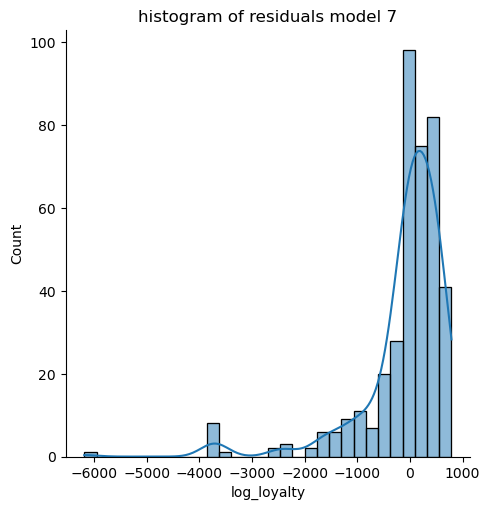

In [201]:
# plot the residuals using a histogram
sns.displot(residuals,bins=30,kde='True')
plt.title('histogram of residuals model 7')

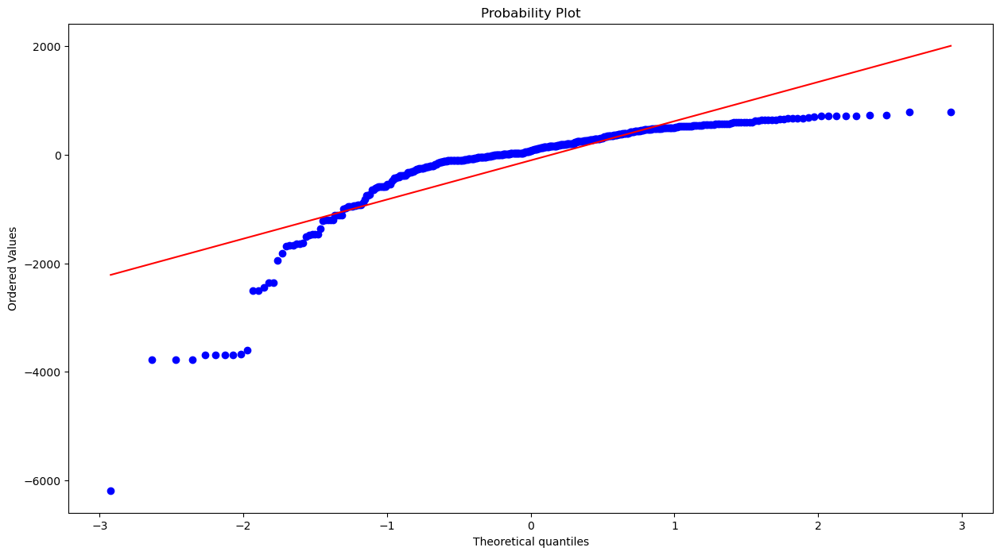

In [202]:
# plot the residuals using a qq plot
stats.probplot(residuals,dist='norm',plot=pylab)
pylab.show()

> Our histogram shows that there is significant left(negative) skewness. Our QQ plot also shows many deviations from the straight line and high levels of left skewness
> 
> Thus we can conclude that assumption 4 has been violated

### Assumption 5: No autocorrelation of residuals
- This assumption states that the residuals are independent of one another. In other words, the residual at one point does not depend on the residuals at other points
- This can be checked by creating a plot of the residuals against the time period
- As our data has no time series, this asssumption cannot be tested

### Assumption 6 : Mean of Residuals
- This assumption implies that the residuals (the differences between the observed and predicted values) have a mean of zero. In other words, the average error of the model is zero

In [206]:
# calculate the mean of residuals
residuals.mean()

-101.51488393155411

> In this case our residuals have a mean of -101, we can assume that assumption 6 has been violated. This models mean of residuals is also further away from 0 than our previous model, further undermining its validity

## Error Evaluation

In [209]:
# Calculate Error Metrics
mae_original = mean_absolute_error(y_test_original, y_pred_original)
mse_original = mean_squared_error(y_test_original, y_pred_original)
rmse_original = np.sqrt(mse_original)

print(f"MAE (Original Scale): {mae_original}")
print(f"MSE (Original Scale): {mse_original}")
print(f"RMSE (Original Scale): {rmse_original}")

MAE (Original Scale): 503.3920968586926
MSE (Original Scale): 746600.9140758795
RMSE (Original Scale): 864.0607120312088


> Interpreting the Root Mean Squared Error value of 864 tells us that, on average our predicted value for loyalty points is 'off' by 864 compared to our actual values for log loyalty points. This is worse than our previous model again showing that LOG transforming our dependent variable hasn't helped with increasing the models predictive power.

Text(0.5, 1.0, 'Actual vs. Predicted Loyalty Points')

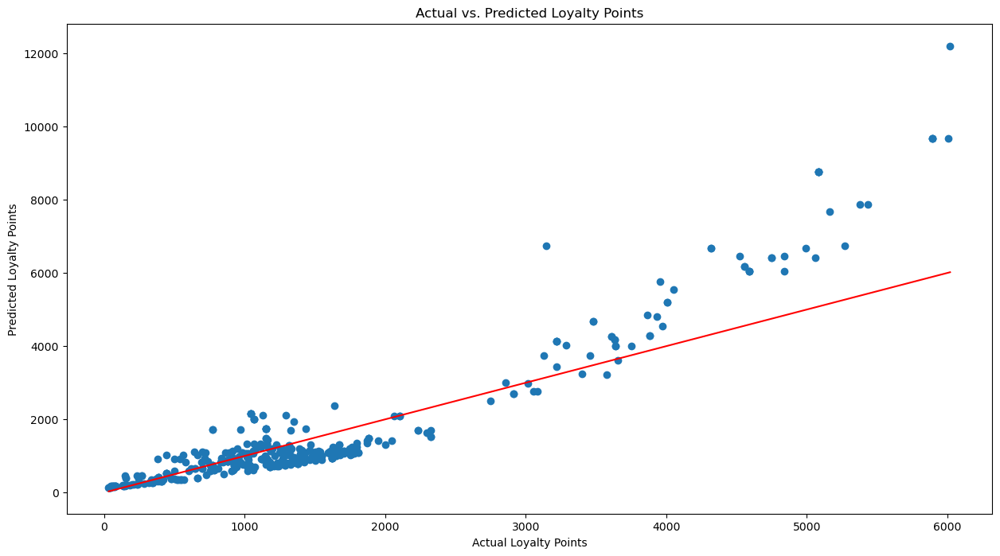

In [211]:
# Visualize Predicted vs. Actual
plt.scatter(y_test_original, y_pred_original)
plt.plot([min(y_test_original), max(y_test_original)], [min(y_test_original), max(y_test_original)], color='red')
plt.xlabel("Actual Loyalty Points")
plt.ylabel("Predicted Loyalty Points")
plt.title("Actual vs. Predicted Loyalty Points")

Text(0.5, 1.0, 'Residual Plot')

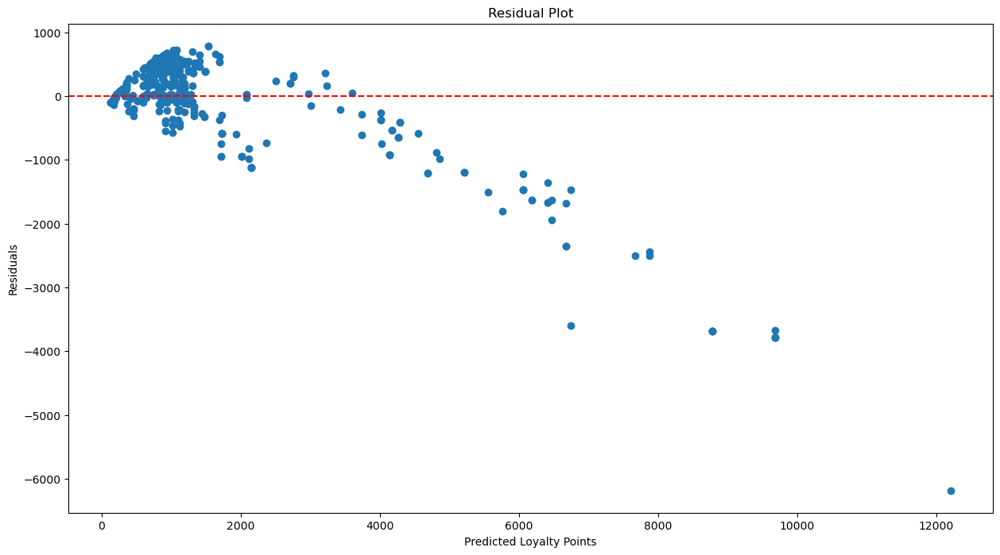

In [212]:
# Residual Plot
plt.scatter(y_pred_original, residuals)
plt.axhline(y=0, color='red', linestyle='--')  # Zero line
plt.xlabel("Predicted Loyalty Points")
plt.ylabel("Residuals")
plt.title("Residual Plot")

> The above graph shows that there is an issue of non linearity in the residuals, as they do not form a straight line

# Regression Analysis Summary
- Model 6 was the model with the highest R-Squared value (83%). This was built using a multiple linear regression model using spend and pay to predict loyalty points.
- However this model was undermined by heteroscedasticity in the data, as indicated by the Breusch-Pagan test. There was also a quite high Root Mean Squared Error (548.6). Putting this into context, our loyalty points have a mean of 1578, so being 'off' by 548.6 is quite high.
- We also confirmed that there was no multicollinearity and that the residuals are almost normally distributed, which helps confirm the robustness of this model.
- In an attempt to reduce heteroscedasticity, I created another model by transforming the dependent variable, 'loyalty' by taking the natural LOG. However when I ran a Breusch-Pagan test, there was still evidence of heteroscedasticity. This model also had a lower R-Squared (80%) compared to our previous model and a higher RMSE (864) compared to our previous model.
- This further supports that conclusion that transforming the dependent variable didn't help in this models predictive power and further investigation needs to take place.
- We can conclude that Model 6 is currently the best performing model.
- Presence of heteroscedasticity, high RMSE are issues that need to be addressed. Rather than adding more variables to the model, Turtle games should focus on increasing the accuracy of these variables, possibly by evaluating their data. Better data will lead to better models.- By identifying factors that lead to higher loyalty points, Turtle Games can create strategies to improve customer retention. They could offer special promotions or loyalty rewards thresholds to customers who are at risk of churning but have higher spending scores or incomes.	
- This model can be used for predictive analytics helping Turtle Games forecast future loyalty point accumulation based on expected changes in customer pay and spend


#

# Week 2 assignment: Exploring the structure using decision trees.

The team wants you to use decision trees to attempt to better understand the structure found in the data. You need to grow and prune a decision tree regressor and then visualise and interpret the output.
Make sure to comment on the potential usefulness in decision-making processes and your observations regarding the model.

## Instructions
1. Prepare the data for creating your decision tree. 
    1. Import the CSV file you have prepared in Week 1.
    2. Create a new DataFrame with the appropriate columns.
        1. Specify that loyalty points is the target variable (Y) and should be excluded from your input data.
        2. Specify X for the independent variables and y as the dependent variable. Therefore, df\[cols\] will be the independent variables and the column containing loyalty points the dependent variable.
        3. Explore the new DataFrame. 
2. Split the data set into a train and test sets for both X and y at a 70:30 ratio. As previously, random_state=42.
3. Create a decision tree regressor to explore the impact of other features on the loyalty points.
    1. Import the DecisionTreeRegressor class from the sklearn.tree library. 
    2. Create a variable (e.g. regressor) to store the DecisionTreeRegressor() class. (As previously, random_state=42.).
    3. Fit the regressor object to the data set with the fit() function.
    4. Remember to prune your tree using basic pruning strategies and compare the performance before and after applying the pruning strategy.
    5. Plot the final decision tree.
4. Fit a final model and interpret the output.
    1. Justify your selection of pruning strategy implemented and interpret the output.
    2. Evaluate the usefulness of the obtained result and interpret the tree and how it could be used to inform business decisions in the organisation.
5. Summarise (150–200 words) the most important business insights, anything you would like to explore further, and suggested future actions.
 
Back up your work to a safe location. This will allow you to revert to a previous state in the case of making a mistake in the code or deleting a section by mistake. (A simple way of doing this is to save or email a compressed version to yourself at frequent intervals.)


## 1. Load and prepare the data

In [218]:
# Create your new DataFrame as turtle2
turtle2 = pd.read_csv('turtle.csv')

In [219]:
# validate the data
validate_data(turtle2)

{'shape': (2000, 9),
 'null_values': gender       0
 age          0
 pay          0
 spend        0
 loyalty      0
 education    0
 product      0
 review       0
 summary      0
 dtype: int64,
 'duplicate_values': 0,
 'data_types': gender        object
 age            int64
 pay          float64
 spend          int64
 loyalty        int64
 education     object
 product        int64
 review        object
 summary       object
 dtype: object}

In [220]:
# drop unecessary columns
turtle2 = turtle2.drop(['review','summary'],axis=1)

In [221]:
# view the metadata
turtle2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   gender     2000 non-null   object 
 1   age        2000 non-null   int64  
 2   pay        2000 non-null   float64
 3   spend      2000 non-null   int64  
 4   loyalty    2000 non-null   int64  
 5   education  2000 non-null   object 
 6   product    2000 non-null   int64  
dtypes: float64(1), int64(4), object(2)
memory usage: 109.5+ KB


## Apply One Hot Encoding for 'gender' (gender has no inherent order)

In [223]:
# confirm unique values for gender column
turtle2['gender'].unique()

array(['Male', 'Female'], dtype=object)

In [224]:
# initialise onehotencoder object
ohe = OneHotEncoder(handle_unknown='ignore',sparse_output=False).set_output(transform='pandas')

In [225]:
# transform the OHE into a data frame with the city column
ohetransform = ohe.fit_transform(turtle2[['gender']])

In [226]:
# concatenate the 2 data frames and drop the 'gender' column as not needed
turtle3 = pd.concat([turtle2,ohetransform], axis=1).drop(columns=['gender'])

In [227]:
# drop the gender_Male column to avoid duplication of the gender data
turtle3 = turtle3.drop('gender_Male', axis=1)

## Apply Ordinal Encoder for 'education' (education has a hierachical order)

In [229]:
# confirm unique values for education
turtle3['education'].unique()

array(['graduate', 'PhD', 'diploma', 'postgraduate', 'Basic'],
      dtype=object)

In [230]:
# define hierachical order of education
edu_order = ['Basic','diploma','graduate','postgraduate','PhD']

In [231]:
# initialise ordinalencoder object
encoder = OrdinalEncoder(categories=[edu_order])

In [232]:
# transform the encoder into a data frame with the education column
encoder_transform = encoder.fit_transform(turtle2[['education']])

In [233]:
# update the education column to our transformed values
turtle3['education'] = encoder_transform

In [234]:
# sense check the df before running our decision tree model
turtle3

,age,pay,spend,loyalty,education,product,gender_Female
0,18,12.30,39,210,2.0,453,0.0
1,23,12.30,81,524,2.0,466,0.0
2,22,13.12,6,40,2.0,254,1.0
3,25,13.12,77,562,2.0,263,1.0
4,33,13.94,40,366,2.0,291,1.0
...,...,...,...,...,...,...,...
1995,37,84.46,69,4031,4.0,977,1.0
1996,43,92.66,8,539,4.0,979,1.0
1997,34,92.66,91,5614,2.0,1012,0.0
1998,34,98.40,16,1048,4.0,1031,0.0


In [235]:
# define dependent variable as y
y = turtle3['loyalty']

# define independent variable as X
X = turtle3.drop(['loyalty'],axis=1)

## 2. Create train and test data sets.

In [237]:
# Split the data into test and train data - testing(30%):training(70%)
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3,random_state=42)

In [238]:
# create a variable to initialise the the DecisionTreeRegressor (random_state=42)
regressor = DecisionTreeRegressor(random_state=42)

In [239]:
# Fit the training data into the regressor
regressor.fit(X_train,y_train)

DecisionTreeRegressor(random_state=42)

In [240]:
# make predictions on X_train
y_pred_train = regressor.predict(X_train)

In [241]:
# make predictions on X_test
y_pred = regressor.predict(X_test)

## Model evaluation

### Training

In [244]:
# R-Squared of training predictions
print('R-Squared (training):', r2_score(y_train, y_pred_train))

R-Squared (training): 1.0


In [245]:
# print MAE, MSE, RMSE errors and r-squared of training
print("Mean Absolute Error (MAE): ", metrics.mean_absolute_error(y_train, y_pred_train))
print("Mean Squared Error (MSE): ", metrics.mean_squared_error(y_train, y_pred_train))
print("Root Mean Squared Error (RMSE): ", math.sqrt(metrics.mean_squared_error(y_train, y_pred_train)))

Mean Absolute Error (MAE):  0.0
Mean Squared Error (MSE):  0.0
Root Mean Squared Error (RMSE):  0.0


### Testing

In [247]:
# R-Squared of testing predictions
print('R-Squared (testing):', r2_score(y_test, y_pred))

R-Squared (testing): 0.9940269190226108


In [248]:
# print MAE, MSE, RMSE errors and r-squared of testing
print("Mean Absolute Error (MAE): ", metrics.mean_absolute_error(y_test, y_pred))
print("Mean Squared Error (MSE): ", metrics.mean_squared_error(y_test, y_pred))
print("Root Mean Squared Error (RMSE): ", math.sqrt(metrics.mean_squared_error(y_test, y_pred)))

Mean Absolute Error (MAE):  36.61833333333333
Mean Squared Error (MSE):  9675.178333333333
Root Mean Squared Error (RMSE):  98.36248437963192


> Our training R-Squared was 1, but our testing R-Squared dropped to 99%. This suggests that there may be over fitting
>
> Our training RMSE was 0, but our testing RMSE is 98. This also suggests are model is overfitting and does not generalise well on unseen data.
>
> We will attempt to prune the tree by manipulating the max_depth value for 3 iterations (3,4,5), aswell identifying feature importances to further refine our model.

### Feature Importances

In [251]:
# Feature Importances
importances = regressor.feature_importances_

# Create a data structure to store the importances.
regressor_importances = pd.Series(importances, index=X.columns)
regressor_importances.sort_values(ascending=False,inplace=True)

# view output
regressor_importances

pay              0.496995
spend            0.484160
age              0.016754
education        0.001327
product          0.000590
gender_Female    0.000174
dtype: float64

> Based on the above table showing the feature importances, 'pay' and 'spend' are the most important predictors in this decision tree model. Age, Education,gender_Female and product are not adding any value to the model as their values are extremely low


## Plot the tree

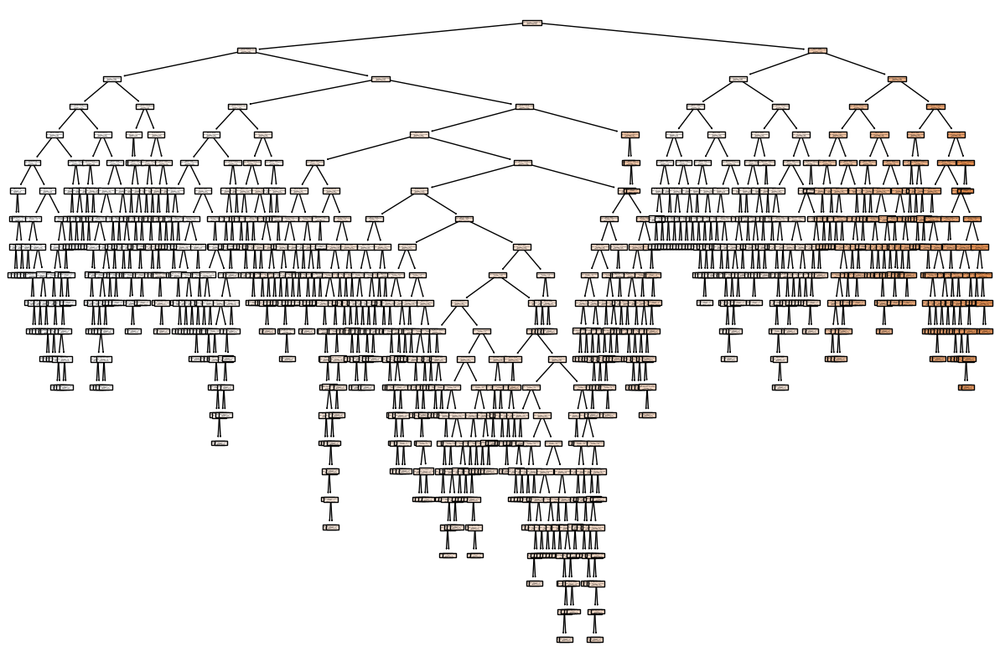

In [254]:
# set figure size
plt.figure(figsize=(15, 10))

# plot tree
plot_tree(regressor, filled=True, feature_names=X.columns)
plt.show()

> Our initial decision tree has many splits indicating a high chance of overfitting. As seen in the above feature_importances table, only 'pay' and 'spend' seem to be contributing to the most to the models predictions, so we will only use these as our main predictors as this will help prevent overfitting.

# Pruning

### Feature selection

In [258]:
# drop unimportant features (product, gender_Female,'age','education') from X_train
X_train_refined = X_train.drop(['product','gender_Female','age','education'],axis=1)

In [259]:
# drop unimportant features (product, gender_Female,'age','education') from X_test
X_test_refined = X_test.drop(['product','gender_Female','age','education'],axis=1)

### Prune the Tree - max_depth = 3

In [261]:
# initialise the decision tree regressor using max_depth=3 and random_state=42
regressor_v2 = DecisionTreeRegressor(random_state=42,max_depth=3)

In [262]:
# fit the model
regressor_v2.fit(X_train_refined,y_train)

DecisionTreeRegressor(max_depth=3, random_state=42)

In [263]:
# make predictions on X_train_refined
y_pred_train= regressor_v2.predict(X_train_refined)

In [264]:
# make predictions on X_test_refined
y_pred= regressor_v2.predict(X_test_refined)

## Model evaluation

### Training

In [267]:
# R-Squared of training predictions
print('R-Squared (training):', r2_score(y_train, y_pred_train))

R-Squared (training): 0.9103965014695461


In [268]:
# print MAE, MSE, RMSE errors and r-squared of training
print("Mean Absolute Error (MAE): ", metrics.mean_absolute_error(y_train, y_pred_train))
print("Mean Squared Error (MSE): ", metrics.mean_squared_error(y_train, y_pred_train))
print("Root Mean Squared Error (RMSE): ", math.sqrt(metrics.mean_squared_error(y_train, y_pred_train)))

Mean Absolute Error (MAE):  277.9036600428747
Mean Squared Error (MSE):  148463.69952137195
Root Mean Squared Error (RMSE):  385.3098746741017


### Testing

In [270]:
# R-Squared of testing predictions
print('R-Squared (testing):', r2_score(y_test, y_pred))

R-Squared (testing): 0.9148271803581075


In [271]:
# print MAE, MSE, RMSE errors and r-squared
print("Mean Absolute Error (MAE): ", metrics.mean_absolute_error(y_test, y_pred))
print("Mean Squared Error (MSE): ", metrics.mean_squared_error(y_test, y_pred))
print("Root Mean Squared Error (RMSE): ", math.sqrt(metrics.mean_squared_error(y_test, y_pred)))

Mean Absolute Error (MAE):  267.1299251233641
Mean Squared Error (MSE):  137962.67325147352
Root Mean Squared Error (RMSE):  371.4332689077185


> Our training R-Squared is 91% and our testing R-Squared is also 91%, which indicates a low chance of overfitting, as there is no decrease in the R-Squared value from training to testing. However it does underfit slightly. 
>
> Our RMSE is fairly similar for both training and testing (slightly lower on testing which is good) indicating that our model is doing well on unseen data.

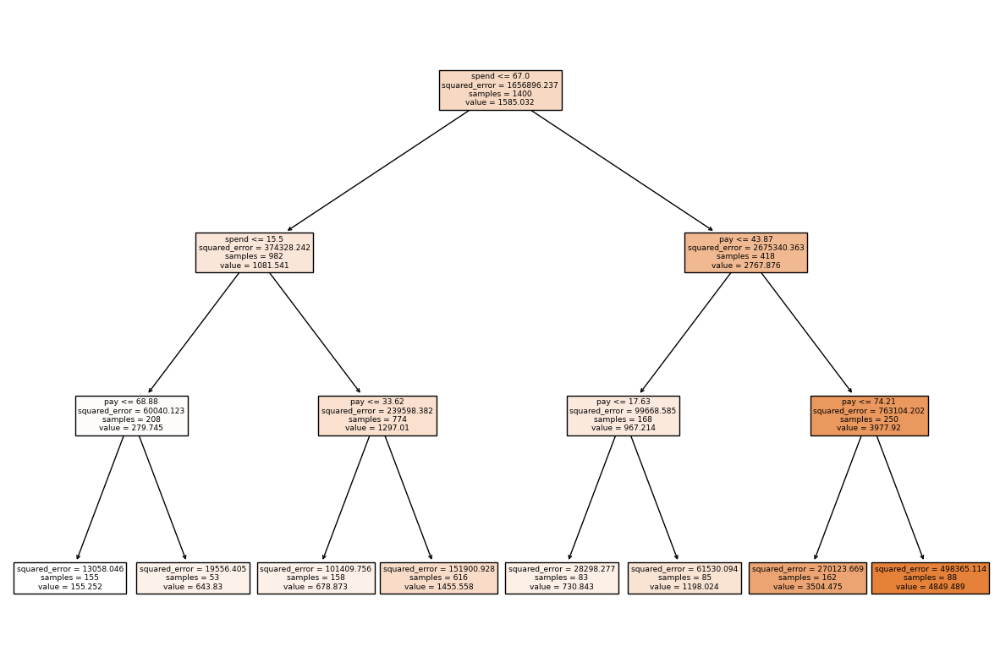

In [273]:
# plot the decision tree with max_depth=3

# set figure size
plt.figure(figsize=(15, 10))

# plot tree
plot_tree(regressor_v2, filled=True, feature_names=X_train_refined.columns)
plt.show()

> The above decision tree shows pay and spend at predicting loyalty using a max_depth of 3

### Prune the Tree - max_depth = 4

In [276]:
# initialise the decision tree regressor using max_depth=4 and random_state=42
regressor_v3 = DecisionTreeRegressor(random_state=42,max_depth=4)

In [277]:
# fit the model
regressor_v3.fit(X_train_refined,y_train)

DecisionTreeRegressor(max_depth=4, random_state=42)

In [278]:
# make predictions on X_test_refined
y_pred= regressor_v3.predict(X_test_refined)

In [279]:
# make predictions on X_train_refined
y_pred_train= regressor_v3.predict(X_train_refined)

## Model evaluation

### Training

In [282]:
# R-Squared of training predictions
print('R-Squared (training):', r2_score(y_train, y_pred_train))

R-Squared (training): 0.9460890153610675


In [283]:
# print MAE, MSE, RMSE errors and r-squared of training
print("Mean Absolute Error (MAE): ", metrics.mean_absolute_error(y_train, y_pred_train))
print("Mean Squared Error (MSE): ", metrics.mean_squared_error(y_train, y_pred_train))
print("Root Mean Squared Error (RMSE): ", math.sqrt(metrics.mean_squared_error(y_train, y_pred_train)))

Mean Absolute Error (MAE):  211.21851310350354
Mean Squared Error (MSE):  89324.90757172268
Root Mean Squared Error (RMSE):  298.87272804945366


### Testing

In [285]:
# R-Squared of testing predictions
print('R-Squared (testing):', r2_score(y_test, y_pred))

R-Squared (testing): 0.9433469740538758


In [286]:
print("Mean Absolute Error (MAE): ", metrics.mean_absolute_error(y_test, y_pred))
print("Mean Squared Error (MSE): ", metrics.mean_squared_error(y_test, y_pred))
print("Root Mean Squared Error (RMSE): ", math.sqrt(metrics.mean_squared_error(y_test, y_pred)))

Mean Absolute Error (MAE):  215.35861879797181
Mean Squared Error (MSE):  91766.39848457077
Root Mean Squared Error (RMSE):  302.929692312541


> Our training R-Squared is 94% which is roughly the same as our testing R-Squared, which is a good thing and indicates little over fitting
>
> Our RMSE for training is 298 which is lower than the RMSE for training when we used max_depth=3, but we see an increase in RMSE for testing to 302 in this model, whereas we saw a drop in RMSE for our testing using max_depth=3. So this means there is 'little' overfitting occuring in this model. Overall this a fairly balanced model, but we'll see how max_depth=5 performs.

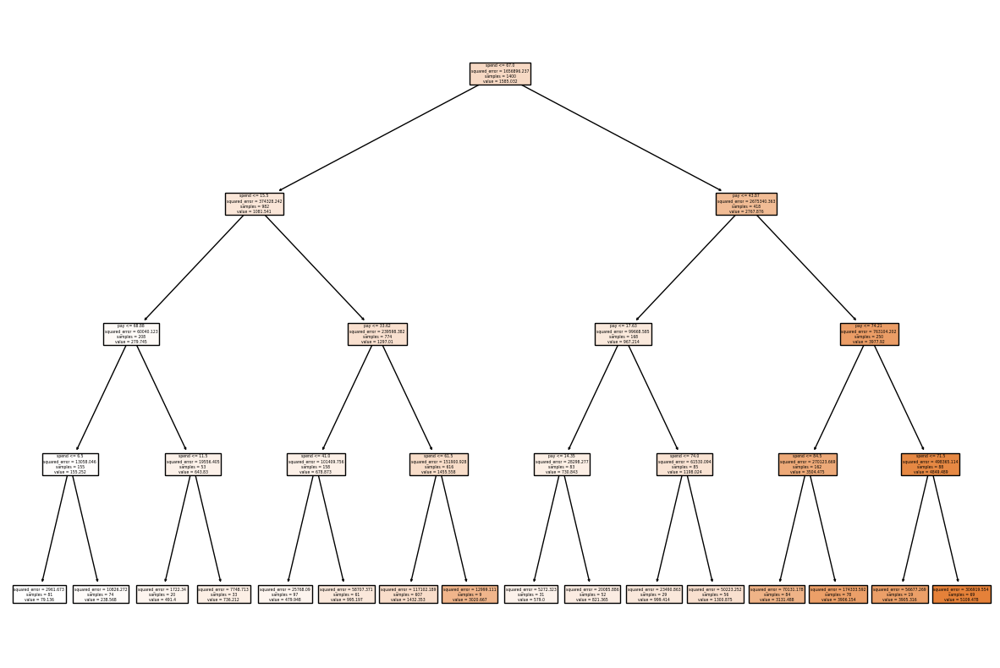

In [288]:
# plot the decision tree with max_depth=4

# set figure size
plt.figure(figsize=(15, 10))

# plot tree
plot_tree(regressor_v3, filled=True, feature_names=X_train_refined.columns)
plt.show()

> The above decision tree shows pay and spend at predicting loyalty using a max_depth of 4.

### Prune the Tree - max_depth = 5

In [291]:
# initialise the decision tree regressor using max_depth=5 and random_state=42
regressor_v4 = DecisionTreeRegressor(random_state=42,max_depth=5)

In [292]:
# fit the model
regressor_v4.fit(X_train_refined,y_train)

DecisionTreeRegressor(max_depth=5, random_state=42)

In [293]:
# make predictions on X_train_refined
y_pred_train= regressor_v4.predict(X_train_refined)

In [294]:
# make predictions on X_test_refined
y_pred= regressor_v4.predict(X_test_refined)

## Model evaluation

### Training

In [297]:
# R-Squared of training predictions
print('R-Squared (training):', r2_score(y_train, y_pred_train))

R-Squared (training): 0.9606024368863062


In [298]:
# print MAE, MSE, RMSE errors and r-squared of training
print("Mean Absolute Error (MAE): ", metrics.mean_absolute_error(y_train, y_pred_train))
print("Mean Squared Error (MSE): ", metrics.mean_squared_error(y_train, y_pred_train))
print("Root Mean Squared Error (RMSE): ", math.sqrt(metrics.mean_squared_error(y_train, y_pred_train)))

Mean Absolute Error (MAE):  178.37553606900033
Mean Squared Error (MSE):  65277.67406311448
Root Mean Squared Error (RMSE):  255.49495897789154


### Testing

In [300]:
# R-Squared of testing predictions
print('R-Squared (testing):', r2_score(y_test, y_pred))

R-Squared (testing): 0.9575428442918131


In [301]:
print("Mean Absolute Error (MAE): ", metrics.mean_absolute_error(y_test, y_pred))
print("Mean Squared Error (MSE): ", metrics.mean_squared_error(y_test, y_pred))
print("Root Mean Squared Error (RMSE): ", math.sqrt(metrics.mean_squared_error(y_test, y_pred)))

Mean Absolute Error (MAE):  181.7427836615545
Mean Squared Error (MSE):  68771.97120845919
Root Mean Squared Error (RMSE):  262.24410614627584


> Our training R-Squared is 96% which is almost equivalent of our testing R-Squared which is a good thing. Its also higher than our max_depth=3 and max_depth=4 so its a better fit.
>
> Testing RMSE is the lowest among pruned models also indicating that is is a good model.

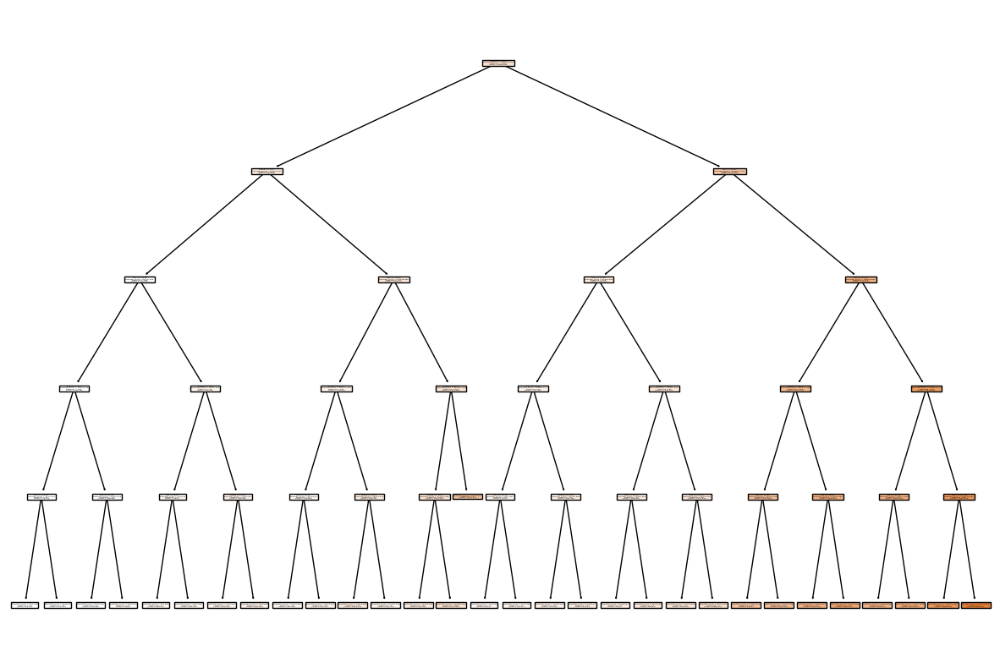

In [303]:
# plot the decision tree with max_depth=5

# set figure size
plt.figure(figsize=(15, 10))

# plot tree
plot_tree(regressor_v4, filled=True, feature_names=X_train_refined.columns)
plt.show()

> The above decision tree shows pay and spend at predicting loyalty using a max_depth of 5.

## 3. Fit and plot final model.

> let's plot the results of our training & testing R-Squared and RMSE errors for all of our models and evaluate which one is the best
>
> RMSE is the better metric to use for decision trees compared to MAE and MSE

In [307]:
# store the results of the decision tree in a data frame
model_eval = pd.DataFrame({'max_depth':['none',3,4,5],
                          'train_r2':[1.00,0.91,0.95,0.96],
                          'test_r2':[0.99,0.91,0.94,0.96],
                          'train_rmse':[0.00,385.31,298.87,255.49],
                          'test_rmse':[98.36,371.43,302.93,262.24]})

# view the data frame
model_eval

,max_depth,train_r2,test_r2,train_rmse,test_rmse
0,none,1.00,0.99,0.00,98.36
1,3,0.91,0.91,385.31,371.43
2,4,0.95,0.94,298.87,302.93
3,5,0.96,0.96,255.49,262.24


> Max Depth = 5 is the best model as it achieves the best trade-off between accuracy and generalization while keeping test RMSE low.
>
> Max Depth = 5 is the best choice. Test R² is high (0.96), close to train R² (0.96).Test RMSE (262.24) is the lowest among pruned models. Not overfitting (train vs. test R² is similar).

> Max Depth = None (fully grown tree) is poor. Train R² = 1.00 (perfect fit) which means its most likely overfitting.Test RMSE (98.36) is much lower than others, but train RMSE = 0.00, which is unrealistic.

> Max Depth = 3 underfits slightly (lower R² and higher RMSE).

> Max Depth = 4 is also a good option, but Depth 5 performs slightly better.

- Based on the above we can conclude that our pruned decision tree with max_depth=5 is the best model. Let's fit and plot the final decision tree

In [310]:
# initialise the decision tree regressor using max_depth=5 and random_state=42
regressor_best = DecisionTreeRegressor(random_state=42,max_depth=5)

In [311]:
# fit the model
regressor_best.fit(X_train_refined,y_train)

DecisionTreeRegressor(max_depth=5, random_state=42)

In [312]:
# plot the final (best) decision tree with max_depth=5

# set figure size
plt.figure(figsize=(20, 14),dpi=1000)

# plot tree
plot_tree(regressor_best, filled=True, feature_names=X_train_refined.columns,fontsize=9,precision=2)
plt.show()

> Our finalised decision tree with max_depth=5

> A decision tree regression model was developed to predict customer loyalty points for Turtle Games using spend and pay as predictor variables. The model, constrained to a maximum depth of five, revealed that spend is the most influential predictor of loyalty, as it appeared at the root of the tree. Specifically, customers with a spend of 67 or less were separated from those with higher spend, indicating that lower-spending customers tend to exhibit different loyalty behaviors than high spenders. This segmentation underscores the importance of spending habits in loyalty dynamics.in sch cases.


> Within the group of lower spenders (spend ≤ 67), a further split at spend ≤ 15.5 identified a particularly disengaged group. These very low spenders were then divided based on pay. Those with higher pay (pay ≤ 68.88) but low spending levels may represent a missed opportunity—customers who can afford to spend but are not currently engaged with Turtle Games’ offerings. Conversely, the segment with both low pay and low spend (pay ≤ 33.62) likely reflects more budget-conscious consumers who require value-driven propositions to drive loyalty.
On the other side of the tree, among higher spenders (spend > 67), pay again played a differentiating role. A split at pay ≤ 43.87 highlighted differences between lower-pay and higher-pay high spenders. The segment with low pay but high spending (pay ≤ 17.63) may be highly engaged but financially limited—these customers show strong loyalty but could be sensitive to pricing. Those with both high pay and high spending (pay ≤ 74.21) represent the most valuable customer group, combining purchasing power with strong engagemen.


> From a business perspective, the model provides several key insights. Firstly, spending behavior is the most reliable indicator of loyalty, supporting its use in segmentation and targeted marketing strategies. Secondly, pay plays a supporting role, helping to refine customer understanding within spending categories. Notably, the presence of high-pay but low-spending customers presents a significant growth opportunity; these individuals could be re-engaged through premium marketing campaigns or personalized outreach. Meanwhile, high-spending, low-pay customers, while loyal, may require more affordable loyalty incentives or flexible pricing options.

> Based on these insights, several strategic recommendations are proposed for Turtle Games. Implementing a tiered loyalty program can help cater to different customer groups—for instance, offering exclusive rewards to high-pay, high-spending customers, while designing value-based incentives for price-sensitive but loyal segments. Additionally, targeted campaigns should be deployed to convert high-pay, low-spending customers by showcasing the unique value of Turtle Games products and emphasizing aspirational or exclusive experiences. Finally, careful attention should be given to pricing and promotional structures to ensure that loyal but budget-constrained customers are not overlooked.

> Although we have used the decision tree algorithm to help us predict loyalty points, they aren't necessarily the best algorithm to use as they are still prone to overfitting. Using ensemble methods like random forests can help reduce overfitting and increase testing accuracy. Also, there is difficulty in capturing linear relationships: Despite being able to capture non-linear relationships, decision trees struggle with capturing linear relationships between features and the target variable. Other algorithms like linear regression may perform better in such cases.

# 

# Week 3 assignment: Clustering with *k*-means using Python

The marketing department also wants to better understand the usefulness of renumeration and spending scores but do not know where to begin. You are tasked to identify groups within the customer base that can be used to target specific market segments. Use *k*-means clustering to identify the optimal number of clusters and then apply and plot the data using the created segments.

## Instructions
1. Prepare the data for clustering. 
    1. Import the CSV file you have prepared in Week 1.
    2. Create a new DataFrame (e.g. `df3`) containing the `renumeration` and `spending_score` columns.
    3. Explore the new DataFrame. 
2. Plot the renumeration versus spending score.
    1. Create a scatterplot.
    2. Create a pairplot.
3. Use the Silhouette and Elbow methods to determine the optimal number of clusters for *k*-means clustering.
    1. Plot both methods and explain how you determine the number of clusters to use.
    2. Add titles and legends to the plot.
4. Evaluate the usefulness of at least three values for *k* based on insights from the Elbow and Silhoutte methods.
    1. Plot the predicted *k*-means.
    2. Explain which value might give you the best clustering.
5. Fit a final model using your selected value for *k*.
    1. Justify your selection and comment on the respective cluster sizes of your final solution.
    2. Check the number of observations per predicted class.
6. Plot the clusters and interpret the model.

## 1. Load and explore the data

In [322]:
# Create your new DataFrame as turtle3
turtle3 = pd.read_csv('turtle.csv')

In [323]:
# Drop unnecessary columns.
turtle3 = turtle3.drop(['gender','age','loyalty','education','product','review','summary'],axis=1)

# View DataFrame.
turtle3

,pay,spend
0,12.30,39
1,12.30,81
2,13.12,6
3,13.12,77
4,13.94,40
...,...,...
1995,84.46,69
1996,92.66,8
1997,92.66,91
1998,98.40,16


In [324]:
# validate the data
validate_data(turtle3)

{'shape': (2000, 2),
 'null_values': pay      0
 spend    0
 dtype: int64,
 'duplicate_values': 1804,
 'data_types': pay      float64
 spend      int64
 dtype: object}

In [325]:
# view summary stats
turtle3.describe()

,pay,spend
count,2000.000000,2000.000000
mean,48.079060,50.000000
std,23.123984,26.094702
min,12.300000,1.000000
25%,30.340000,32.000000
50%,47.150000,50.000000
75%,63.960000,73.000000
max,112.340000,99.000000


## 2. Plot

Text(0.5, 1.0, 'relationship between pay and spend')

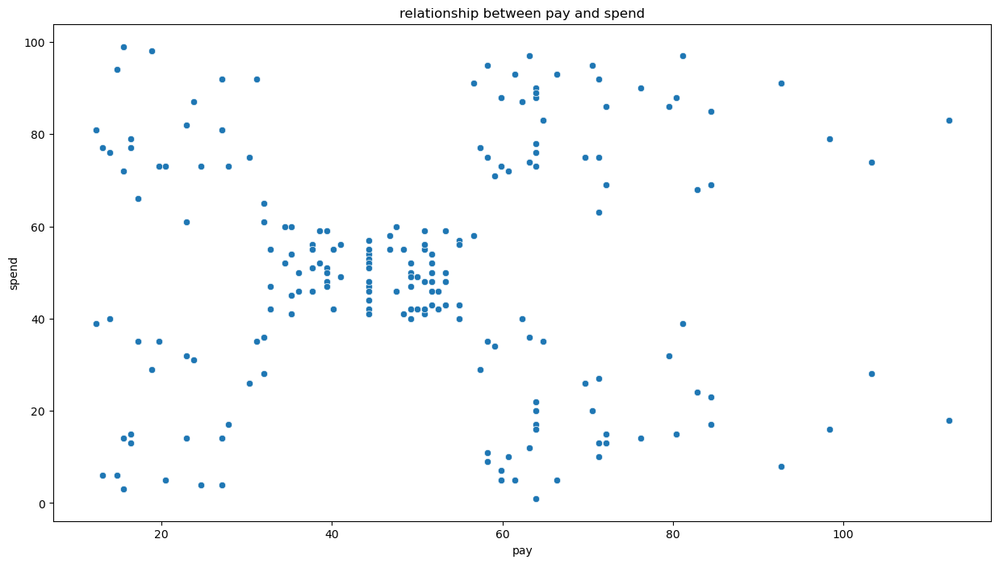

In [327]:
# Create a scatterplot with Seaborn.
sns.scatterplot(data=turtle3,x='pay',y='spend')
plt.title('relationship between pay and spend')

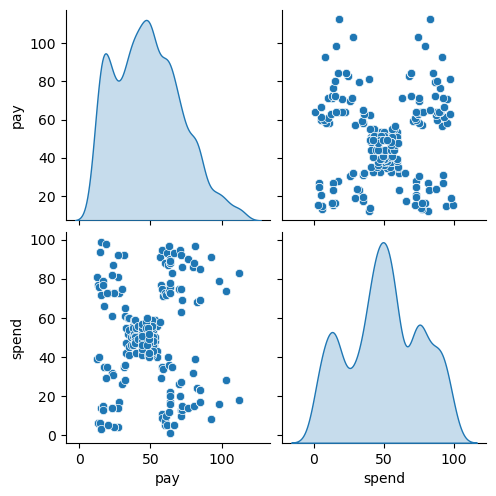

In [328]:
# Create a pairplot with Seaborn.
sns.pairplot(data=turtle3,diag_kind='kde')

> As seen in the above graphs, we can clearly see that there are distinct groups (clusters) where the dots are close together. This indicates that there are clusters in the data which we will explore using a K Means clustering algorithm. As an inital guess it looks like there are 5 seperate clusters, but we will test for a range of clusters.

## 3. Elbow and silhoutte methods

Text(0.5, 1.0, 'elbow method')

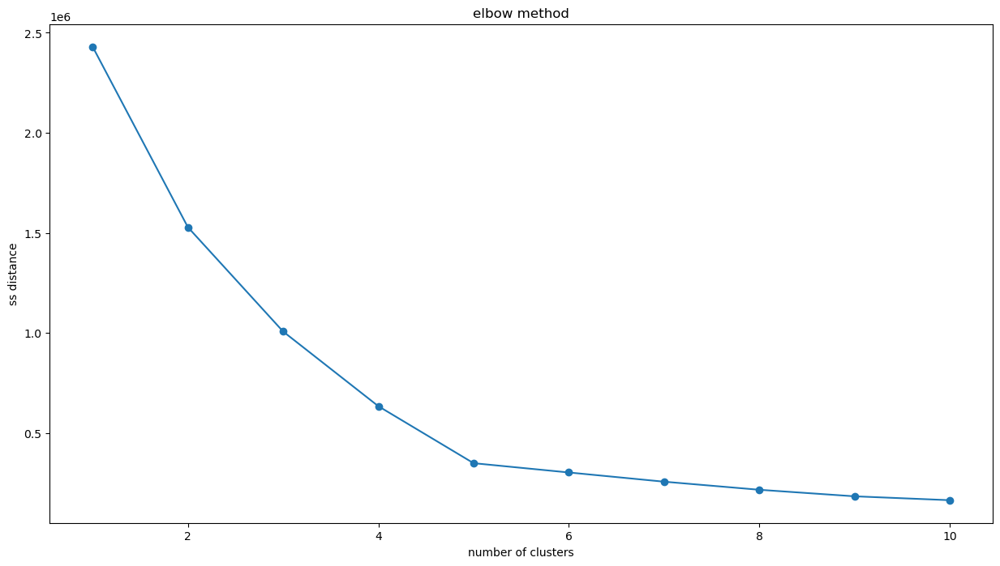

In [331]:
# Determine the number of clusters: Elbow method.

# store the squared distances in an empty list
ss= []

# select a range from 1 to 10 clusters and apply the k-means algorithm to each cluster
for i in range(1,11):
    kmeans = KMeans(n_clusters=i,init='k-means++',max_iter=500,n_init=10,random_state=42)
    kmeans.fit(turtle3)
    ss.append(kmeans.inertia_)

# plot graph
plt.plot(range(1,11),ss,marker='o')

# Insert labels and title.
plt.xlabel('number of clusters')
plt.ylabel('ss distance')
plt.title('elbow method')

> The Elbow Method plot suggests that 5 is the most appropriate k value to use - this is where there is a slight kink in the above graph. The scatterplots shown above also strongly suggest that there are five distinct groups of data points.

Text(0.5, 1.0, 'silhouette method')

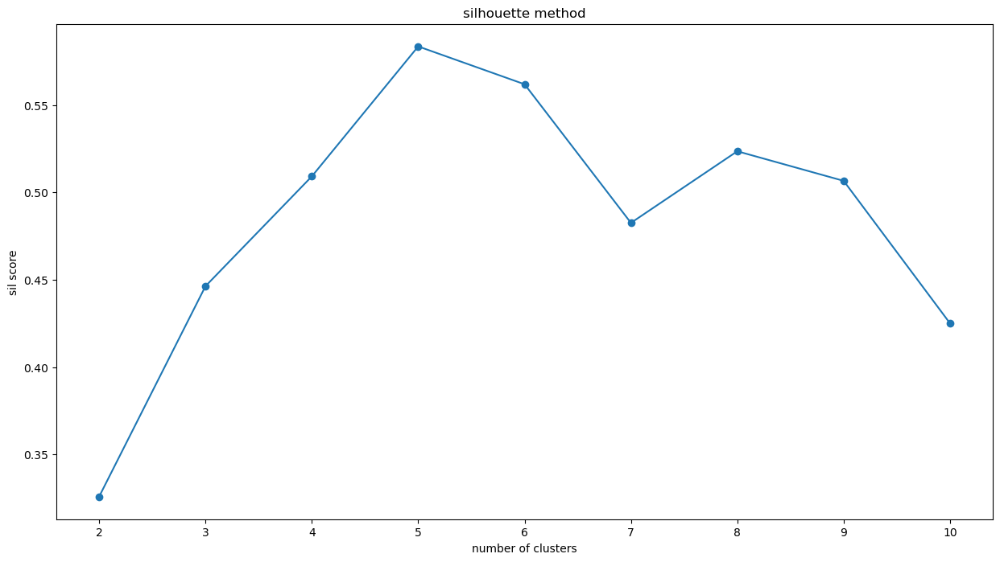

In [333]:
# Determine the number of clusters: Silhouette method.

# create an empty list to store the silhouette score
sil = []

# assign an abritrary value for the max number of clusters
kmax = 10

# select a range from 2 to 11 clusters and apply the k-means algorithm to each cluster and store the Silhouette score
for k in range(2, kmax+1):
    kmeans_s = KMeans(n_clusters=k).fit(turtle3)
    labels = kmeans_s.labels_
    sil.append(silhouette_score(turtle3,labels,metric='euclidean'))

# Plot the silhouette method.
plt.plot(range(2, kmax+1),sil,marker='o')

# Insert labels and title.
plt.xlabel('number of clusters')
plt.ylabel('sil score')
plt.title('silhouette method')

> The silhouette method strongly suggests that 5 is the correct number of cluster as there is an obvious peak in the line plot at k=5. This is supported by the Elbow Method findings, and the scatterplots shown above.

## 4. Evaluate k-means model at different values of *k* - We will try K=3, K=4, K=5

# K=3

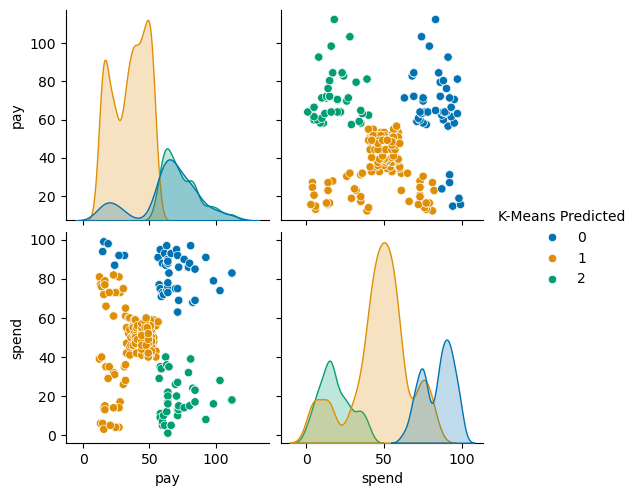

In [337]:
# using 3 clusters >>>>> k=3

# Initialize and fit the K-Means model and specify the parameters
kmeans = KMeans(n_clusters = 3, max_iter = 15000,init='k-means++',random_state=42).fit(turtle3)

# Get cluster labels for each data point
clusters = kmeans.labels_

# Add the cluster labels as a new column in the DataFrame
turtle3['K-Means Predicted'] = clusters

# Plot the predicted.
sns.pairplot(turtle3,hue='K-Means Predicted',diag_kind= 'kde',palette='colorblind')

> As we can observe in the top right graph (spend vs pay), there are some data points in cluster 0 (blue) which are closer to cluster 1 (orange) but have been assigned as cluster 0. This doesn't look like the best fit and this might mean that we need to test a higher value of K 

# K=4

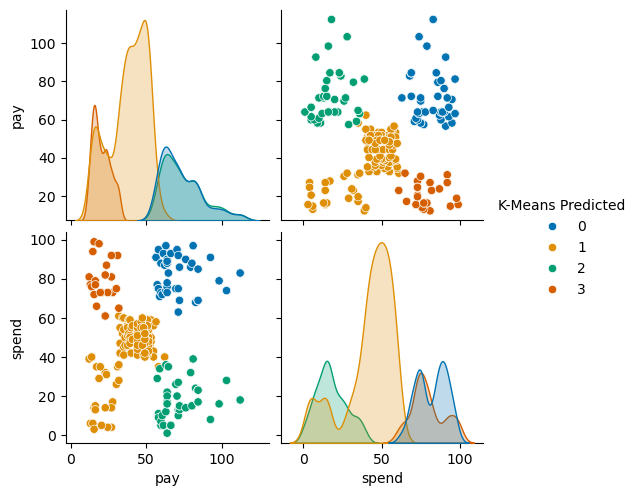

In [340]:
# using 4 clusters >>>>> k=4

# Initialize and fit the K-Means model and specify the parameters
kmeans = KMeans(n_clusters = 4, max_iter = 15000,init='k-means++',random_state=42).fit(turtle3)

# Get cluster labels for each data point
clusters = kmeans.labels_

# Add the cluster labels as a new column in the DataFrame
turtle3['K-Means Predicted'] = clusters

# Plot the predicted.
sns.pairplot(turtle3,hue='K-Means Predicted',diag_kind= 'kde',palette='colorblind')

> As we can observe in the top right graph (spend vs pay), there is some overlapping of cluster 1 (orange) and cluster 2 (green). This might indicate our chosen value for K isn't the best fit and this might mean that we need to test a higher value of K

# K=5

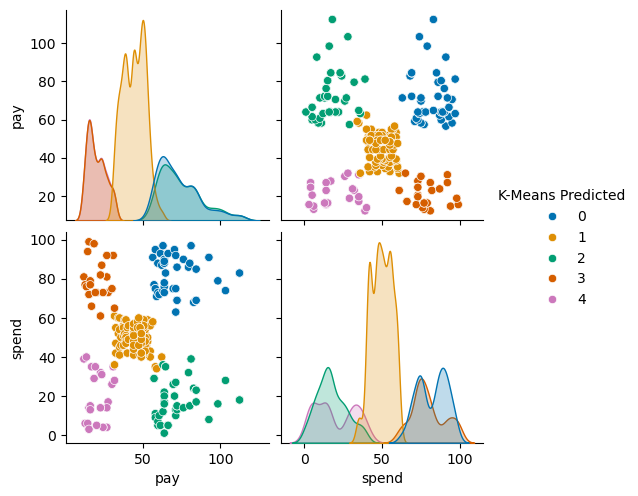

In [343]:
# using 5 clusters >>>>> k=5

# Initialize and fit the K-Means model and specify the parameters
kmeans = KMeans(n_clusters = 5, max_iter = 15000,init='k-means++',random_state=42).fit(turtle3)

# Get cluster labels for each data point
clusters = kmeans.labels_

# Add the cluster labels as a new column in the DataFrame
turtle3['K-Means Predicted'] = clusters

# Plot the predicted.
sns.pairplot(turtle3,hue='K-Means Predicted',diag_kind= 'kde',palette='colorblind')

> As we can observe in the top right graph, the overlapping of clusters has disappeared when we used 4 clusters, and the clusters aren't incorrectly assigned as we observed when we used 3 clusters. 5 clusters looks like the best choice, as also confirmed by our elbow/silhouette methods.

## 5. Fit final model and justify your choice

- The best model based on the scatterplots, Elbow Method and Silhouette Method is one using five clusters (k=5)

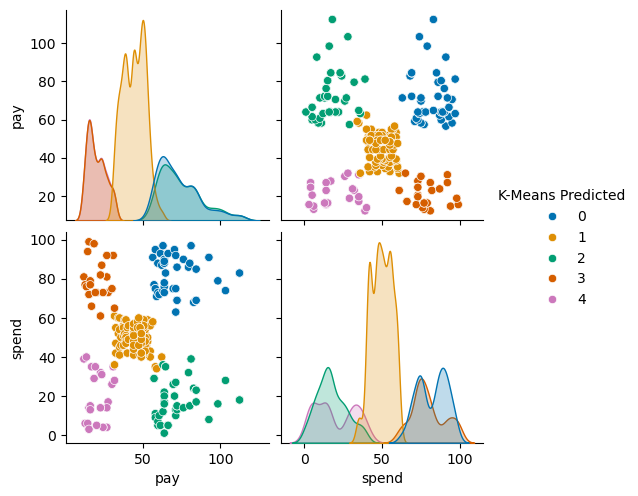

In [347]:
# Apply the final model >>>>> K=5

# Initialize and fit the K-Means model and specify the parameters using K=5
kmeans = KMeans(n_clusters = 5, max_iter = 15000,init='k-means++',random_state=42).fit(turtle3)

# Get cluster labels for each data point
clusters = kmeans.labels_

# Add the cluster labels as a new column in the DataFrame
turtle3['K-Means Predicted'] = clusters

# Plot the predicted.
sns.pairplot(turtle3,hue='K-Means Predicted',diag_kind= 'kde',palette='colorblind')

In [348]:
# Check the number of observations per predicted class.
turtle3['K-Means Predicted'].value_counts()

K-Means Predicted
1    774
0    356
2    330
4    271
3    269
Name: count, dtype: int64

## 6. Plot and interpret the clusters

In [350]:
# View the DataFrame.
turtle3

,pay,spend,K-Means Predicted
0,12.30,39,4
1,12.30,81,3
2,13.12,6,4
3,13.12,77,3
4,13.94,40,4
...,...,...,...
1995,84.46,69,0
1996,92.66,8,2
1997,92.66,91,0
1998,98.40,16,2


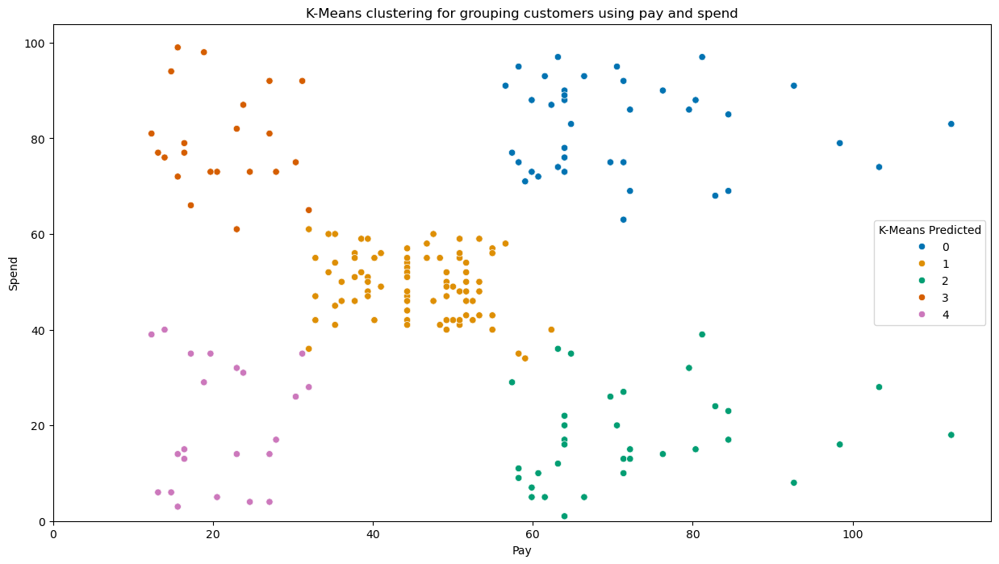

In [351]:
# Visualising the clusters.

# Set plot size.
plt.figure(figsize=(15, 8))

# Create a scatterplot.
sns.scatterplot(x='pay' ,y ='spend',data=turtle3,hue='K-Means Predicted',palette='colorblind')
plt.xlim(0)
plt.ylim(0)
plt.xlabel('Pay', fontsize=10)
plt.ylabel('Spend', fontsize=10)
plt.title('K-Means clustering for grouping customers using pay and spend',fontsize=12)
plt.legend(loc='center right',title='K-Means Predicted')

## 7. Discuss: Insights and observations

- The data points in our original scatter graph clearly form 5 distinct groups of clusters with little to no overlapping. Furthermore, both the Elbow and Silhouette methods suggest 5 is the optimal number of clusters to use as the value of K.

- We tested 3 different clusters (k=3,k=4,k=5), For K=3, we observed that the algorithm incorrectly classified some clusters and with K=4 we observed some overlapping. With K=5, the issues about incorrect classification and overlapping was diminished, and our methods for choosing K led us to believe that K=5 was the best which in fact it was.
  
- This analysis suggests that customers could be grouped according to these clusters, based on their income and spending score. We could also use this information for further analysis such as sentiment analysis of their reviews using natural language processing, and analysing their spending habits to allow for tailored marketing strategies.

## Evaluate the segments

> ### Cluster 0 (Blue) - High Income, High Spending Score - "Luxury Enthusiasts" (18% of customers)

- Customers in this group have high remuneration (~ 60k€-105k€) and high spending scores (~ 60-100).

- Likely represents high-value customers who have significant purchasing power and spend a lot.

- Marketing Strategy: VIP customer service, premium loyalty programs, exclusive offers.

> ### Cluster 1 (Orange) - Medium to Low Income, Medium Spending Score - "Value Seekers" (39% of customers)

- This cluster has remuneration ranging from ~30k€-60k€ and spending scores between ~40-60.

- Represents the general consumer group, spending moderately.

- Marketing Strategy: Regular promotions, discounts, and personalized offers to encourage loyalty.

> ### Cluster 2 (Green) - High Income, Low Spending Score - "Practical Professionals" (17% of customers)

- Customers here have high remuneration (~ 60k€-105k€) but low spending scores (~ 0-40).

- These customers can afford to spend but choose not to.

- Marketing Strategy: Investigate barriers to spending (e.g., preferences, brand perception), offer tailored promotions.

> ### Cluster 3 (Red) - Low Income, High Spending Score - "Aspirational Shoppers" (13% of customers)

- Customers in this group have low remuneration (~ 10k€-30k€) but high spending scores (~ 60-100).

- They may prioritize discretionary spending despite a lower income.

- Marketing Strategy: Payment plans, installment options, or budget-friendly product lines.

> ### Cluster 4 (Purple) - Low Income, Low Spending Score - "Budget-Conscious Consumers" (14% of customers)

- Customers in this group have low remuneration (~ 10k€-30k€) and low spending scores (~ 5-40).

- They are budget-conscious and spend very little.

- Marketing Strategy: Cost-effective deals, discounts, and affordability-focused promotions.

> ## Key Takeaways

- Cluster 0 (high earners & high spenders) are the most valuable customers.

- Cluster 1 (moderate earners & moderate spenders) are the average customer, need to keep these happy to ensure sustainable business growth

- Cluster 2 (high earners & low spenders) represents an opportunity to increase spending.

- Clusters 3 & 4 (low earners) are price-sensitive and need budget-friendly marketing. 

# 

# Week 4 assignment: NLP using Python
Customer reviews were downloaded from the website of Turtle Games. This data will be used to steer the marketing department on how to approach future campaigns. Therefore, the marketing department asked you to identify the 15 most common words used in online product reviews. They also want to have a list of the top 20 positive and negative reviews received from the website. Therefore, you need to apply NLP on the data set.

## Instructions
1. Load and explore the data. 
    1. Sense-check the DataFrame.
    2. You only need to retain the `review` and `summary` columns.
    3. Determine if there are any missing values.
2. Prepare the data for NLP
    1. Change to lower case and join the elements in each of the columns respectively (`review` and `summary`).
    2. Replace punctuation in each of the columns respectively (`review` and `summary`).
    3. Drop duplicates in both columns (`review` and `summary`).
3. Tokenise and create wordclouds for the respective columns (separately).
    1. Create a copy of the DataFrame.
    2. Apply tokenisation on both columns.
    3. Create and plot a wordcloud image.
4. Frequency distribution and polarity.
    1. Create frequency distribution.
    2. Remove alphanumeric characters and stopwords.
    3. Create wordcloud without stopwords.
    4. Identify 15 most common words and polarity.
5. Review polarity and sentiment.
    1. Plot histograms of polarity (use 15 bins) for both columns.
    2. Review the sentiment scores for the respective columns.
6. Identify and print the top 20 positive and negative reviews and summaries respectively.
7. Include your insights and observations.

## 1. Load and explore the data

In [357]:
# Create your new DataFrame as turtle4
turtle4 = pd.read_csv('turtle.csv')

In [358]:
# validate the data
validate_data(turtle4)

{'shape': (2000, 9),
 'null_values': gender       0
 age          0
 pay          0
 spend        0
 loyalty      0
 education    0
 product      0
 review       0
 summary      0
 dtype: int64,
 'duplicate_values': 0,
 'data_types': gender        object
 age            int64
 pay          float64
 spend          int64
 loyalty        int64
 education     object
 product        int64
 review        object
 summary       object
 dtype: object}

In [359]:
# only retain necessary columns (review & summary) for NLP sentiment analysis
turtle4 = turtle4[['review','summary']]

In [360]:
# view the df
turtle4

,review,summary
0,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,As my review of GF9's previous screens these w...,Money trap
...,...,...
1995,The perfect word game for mixed ages (with Mom...,The perfect word game for mixed ages (with Mom
1996,Great game. Did not think I would like it whe...,Super fun
1997,Great game for all.........\nKeeps the mind ni...,Great Game
1998,fun game!,Four Stars


In [361]:
# Determine if there are any missing values - (there are 0 missing values)
turtle4.isna().sum()

review     0
summary    0
dtype: int64

### Duplicate handling

In [363]:
# view the number of duplicates
turtle4.duplicated().sum()

18

In [364]:
# how much of the dataset is duplicates?
# output is number of duplicates divided by total number of rows
(turtle4.duplicated().sum()/turtle4.shape[0]) * 100

0.8999999999999999

> as only 18 out of our 2000 rows contain duplicates which is extremely small (0.89%), keeping them in or removing is unlikely to cause any significant changes to the skewness of the sentimnent. It is also possible they were written by different people. Based on this the decision has been made NOT to remove duplicates.

## 2. Prepare the data for NLP
### 2a) Change to lower case and join the elements in each of the columns respectively (review and summary)

In [367]:
# Review: Change all to lower case and join with a space.
turtle4['review'] = turtle4['review'].apply(lambda x: " ".join(x.lower() for x in x.split()))

# sense check output
turtle4['review']

0       when it comes to a dm's screen, the space on t...
1       an open letter to galeforce9*: your unpainted ...
2       nice art, nice printing. why two panels are fi...
3       amazing buy! bought it as a gift for our new d...
4       as my review of gf9's previous screens these w...
                              ...                        
1995    the perfect word game for mixed ages (with mom...
1996    great game. did not think i would like it when...
1997    great game for all......... keeps the mind nim...
1998                                            fun game!
1999    this game is fun. a lot like scrabble without ...
Name: review, Length: 2000, dtype: object

In [368]:
# Summary: Change all to lower case and join with a space.
turtle4['summary'] = turtle4['summary'].apply(lambda x: " ".join(x.lower() for x in x.split()))

# sense check output
turtle4['summary']

0       the fact that 50% of this space is wasted on a...
1       another worthless dungeon master's screen from...
2                         pretty, but also pretty useless
3                                              five stars
4                                              money trap
                              ...                        
1995       the perfect word game for mixed ages (with mom
1996                                            super fun
1997                                           great game
1998                                           four stars
1999                                       love this game
Name: summary, Length: 2000, dtype: object

### 2b) Replace punctuation in each of the columns respectively (review and summary)

In [370]:
# Replace all the punctuations in review column using 'remove_punctuation' user defined function
turtle4['review_cleaned'] = turtle4['review'].apply(remove_punctuation)

# View output.
turtle4['review_cleaned']

0       when it comes to a dms screen the space on the...
1       an open letter to galeforce9 your unpainted mi...
2       nice art nice printing why two panels are fill...
3       amazing buy bought it as a gift for our new dm...
4       as my review of gf9s previous screens these we...
                              ...                        
1995    the perfect word game for mixed ages with mom ...
1996    great game did not think i would like it when ...
1997             great game for all keeps the mind nimble
1998                                             fun game
1999    this game is fun a lot like scrabble without a...
Name: review_cleaned, Length: 2000, dtype: object

In [371]:
# Replace all the punctuations in summary column using 'remove_punctuation' user defined function
turtle4['summary_cleaned'] = turtle4['summary'].apply(remove_punctuation)

# View output.
turtle4['summary_cleaned']

0       the fact that 50 of this space is wasted on ar...
1       another worthless dungeon masters screen from ...
2                          pretty but also pretty useless
3                                              five stars
4                                              money trap
                              ...                        
1995        the perfect word game for mixed ages with mom
1996                                            super fun
1997                                           great game
1998                                           four stars
1999                                       love this game
Name: summary_cleaned, Length: 2000, dtype: object

## 3. Tokenise and create wordclouds

In [373]:
# Tokenise the words in the review_cleaned column
turtle4['review_tokens'] = turtle4['review_cleaned'].apply(word_tokenize)

# Preview data.
turtle4['review_tokens']

0       [when, it, comes, to, a, dms, screen, the, spa...
1       [an, open, letter, to, galeforce9, your, unpai...
2       [nice, art, nice, printing, why, two, panels, ...
3       [amazing, buy, bought, it, as, a, gift, for, o...
4       [as, my, review, of, gf9s, previous, screens, ...
                              ...                        
1995    [the, perfect, word, game, for, mixed, ages, w...
1996    [great, game, did, not, think, i, would, like,...
1997    [great, game, for, all, keeps, the, mind, nimble]
1998                                          [fun, game]
1999    [this, game, is, fun, a, lot, like, scrabble, ...
Name: review_tokens, Length: 2000, dtype: object

In [374]:
# Tokenise the words in the summary_cleaned column
turtle4['summary_tokens'] = turtle4['summary_cleaned'].apply(word_tokenize)

# Preview data.
turtle4['summary_tokens']

0       [the, fact, that, 50, of, this, space, is, was...
1       [another, worthless, dungeon, masters, screen,...
2                    [pretty, but, also, pretty, useless]
3                                           [five, stars]
4                                           [money, trap]
                              ...                        
1995    [the, perfect, word, game, for, mixed, ages, w...
1996                                         [super, fun]
1997                                        [great, game]
1998                                        [four, stars]
1999                                   [love, this, game]
Name: summary_tokens, Length: 2000, dtype: object

In [375]:
# view the data frame 
# it should have the review,summary,review_cleaned,summary_cleaned,review_token,summary_tokens columns
turtle4

,review,summary,review_cleaned,summary_cleaned,review_tokens,summary_tokens
0,"when it comes to a dm's screen, the space on t...",the fact that 50% of this space is wasted on a...,when it comes to a dms screen the space on the...,the fact that 50 of this space is wasted on ar...,"[when, it, comes, to, a, dms, screen, the, spa...","[the, fact, that, 50, of, this, space, is, was..."
1,an open letter to galeforce9*: your unpainted ...,another worthless dungeon master's screen from...,an open letter to galeforce9 your unpainted mi...,another worthless dungeon masters screen from ...,"[an, open, letter, to, galeforce9, your, unpai...","[another, worthless, dungeon, masters, screen,..."
2,"nice art, nice printing. why two panels are fi...","pretty, but also pretty useless",nice art nice printing why two panels are fill...,pretty but also pretty useless,"[nice, art, nice, printing, why, two, panels, ...","[pretty, but, also, pretty, useless]"
3,amazing buy! bought it as a gift for our new d...,five stars,amazing buy bought it as a gift for our new dm...,five stars,"[amazing, buy, bought, it, as, a, gift, for, o...","[five, stars]"
4,as my review of gf9's previous screens these w...,money trap,as my review of gf9s previous screens these we...,money trap,"[as, my, review, of, gf9s, previous, screens, ...","[money, trap]"
...,...,...,...,...,...,...
1995,the perfect word game for mixed ages (with mom...,the perfect word game for mixed ages (with mom,the perfect word game for mixed ages with mom ...,the perfect word game for mixed ages with mom,"[the, perfect, word, game, for, mixed, ages, w...","[the, perfect, word, game, for, mixed, ages, w..."
1996,great game. did not think i would like it when...,super fun,great game did not think i would like it when ...,super fun,"[great, game, did, not, think, i, would, like,...","[super, fun]"
1997,great game for all......... keeps the mind nim...,great game,great game for all keeps the mind nimble,great game,"[great, game, for, all, keeps, the, mind, nimble]","[great, game]"
1998,fun game!,four stars,fun game,four stars,"[fun, game]","[four, stars]"


## Wordcloud

### Reviews

In [378]:
# Review: Create a word cloud.

# Define an empty list of tokens to store the review tokens
all_review_tokens = []

for i in range(turtle4.shape[0]):
    # Add each token to the list.
    all_review_tokens = all_review_tokens + turtle4['review_tokens'][i]

In [379]:
# Filter out tokens that are neither alphabets nor numbers - review tokens
all_review_tokens = [word for word in all_review_tokens if word.isalnum()]

In [380]:
# confirm the length of the review tokens list
print('REVIEW TOKENS LENGTH is',len(all_review_tokens))

REVIEW TOKENS LENGTH is 112194


In [381]:
# Define an empty string variable to convert the list into a string
review_tokens_string = ''

for token in all_review_tokens:
    # Add each filtered token word to the string.
    review_tokens_string = review_tokens_string + token + ' '

In [382]:
# Set the colour palette.
sns.set(color_codes=True)

# Create a WordCloud object.
word_cloud = WordCloud(width = 1600, height = 900, 
                background_color ='white',
                colormap = 'plasma', 
                stopwords = 'none',
                min_font_size = 10).generate(review_tokens_string) 

Text(0.5, 1.0, 'Wordcloud of customer reviews')

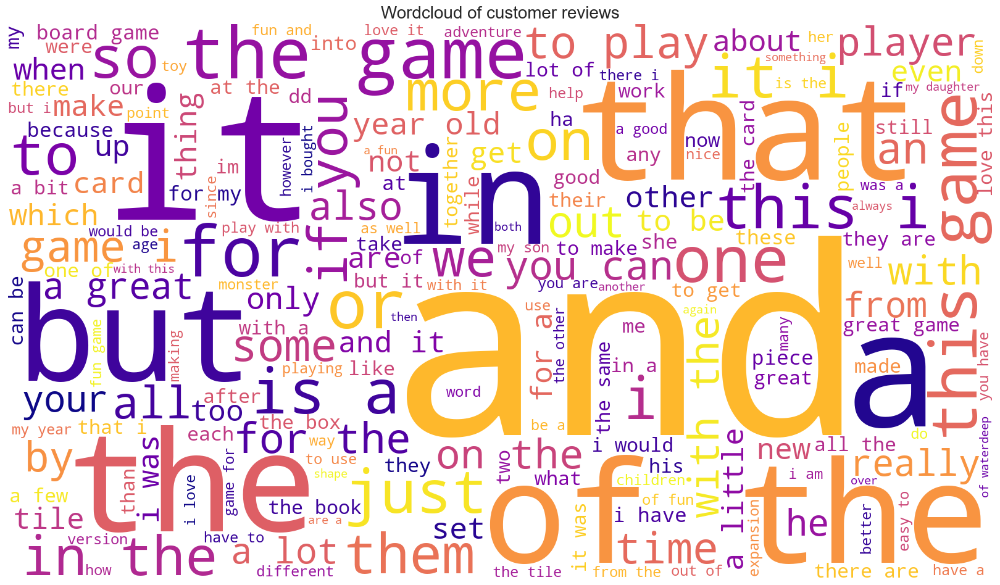

In [383]:
# Plot the WordCloud image.                    
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(word_cloud) 
plt.axis('off') 
plt.tight_layout(pad = 0)
plt.title('Wordcloud of customer reviews',fontsize=20)

### Summary

In [385]:
# Summary: Create a word cloud.

# Define an empty list of tokens to store the summary tokens
all_summary_tokens = []

for i in range(turtle4.shape[0]):
    # Add each token to the list.
    all_summary_tokens = all_summary_tokens + turtle4['summary_tokens'][i]

In [386]:
# Filter out tokens that are neither alphabets nor numbers - sumamary tokens
all_summary_tokens = [word for word in all_summary_tokens if word.isalnum()]

In [387]:
# confirm the length of the summary tokens list
print('SUMMARY TOKENS LENGTH is',len(all_summary_tokens))

SUMMARY TOKENS LENGTH is 9359


In [388]:
# Define an empty string variable to convert the list into a string
summary_tokens_string = ''

for token in all_summary_tokens:
    # Add each filtered token word to the string.
   summary_tokens_string = summary_tokens_string + token + ' '

In [389]:
# Set the colour palette.
sns.set(color_codes=True)

# Create a WordCloud object.
word_cloud = WordCloud(width = 1600, height = 900, 
                background_color ='white',
                colormap = 'plasma', 
                stopwords = 'none',
                min_font_size = 10).generate(summary_tokens_string)

Text(0.5, 1.0, 'Wordcloud of customer summary')

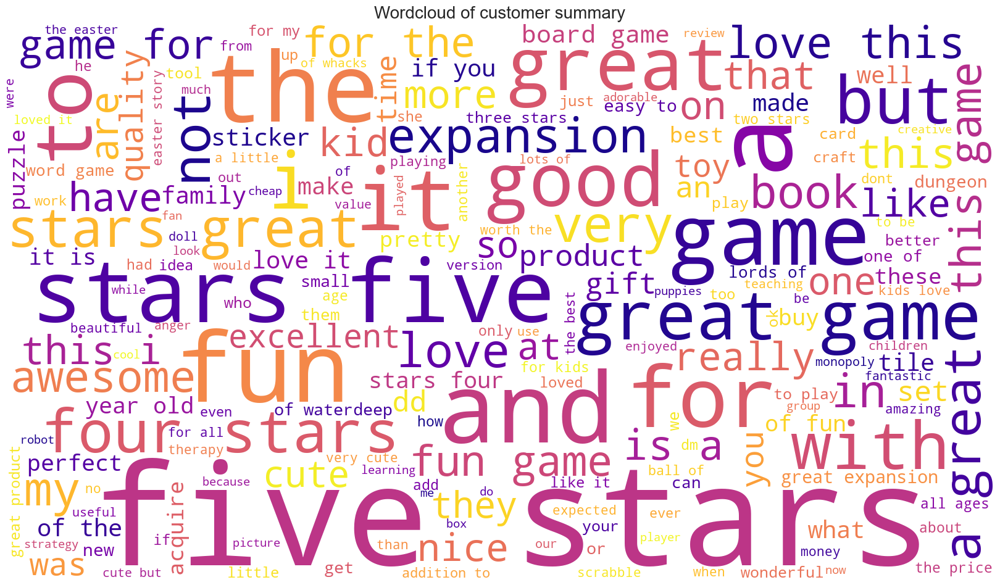

In [390]:
# Plot the WordCloud image.                    
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(word_cloud) 
plt.axis('off') 
plt.tight_layout(pad = 0)
plt.title('Wordcloud of customer summary',fontsize=20)

## 4. Frequency distribution and polarity
### 4a) Create frequency distribution

In [392]:
# Determine the frequency distribution - review
fdist_review = FreqDist(all_review_tokens)

# Preview data.
fdist_review

FreqDist({'the': 5452, 'and': 3234, 'to': 3164, 'a': 3161, 'of': 2488, 'i': 2091, 'it': 2090, 'is': 1782, 'this': 1776, 'game': 1685, ...})

In [393]:
# Determine the frequency distribution - summary
fdist_summary = FreqDist(all_summary_tokens)

# Preview data.
fdist_summary

FreqDist({'stars': 466, 'five': 381, 'game': 319, 'great': 295, 'the': 261, 'a': 240, 'for': 232, 'fun': 218, 'to': 192, 'and': 168, ...})

### 4b) Remove stopwords

In [395]:
# Create a set of English stopwords.
english_stopwords = set(stopwords.words('english'))

In [396]:
# Create a filtered list of all_review_tokens without stopwords.
review_no_sw = [x for x in all_review_tokens if x.lower() not in english_stopwords]

In [397]:
# Determine the frequency distribution AFTER REMOVING STOPWORDS - review
fdist_review_no_sw = FreqDist(review_no_sw)

# Preview data.
fdist_review_no_sw

FreqDist({'game': 1685, 'great': 596, 'fun': 553, 'one': 530, 'play': 502, 'like': 414, 'love': 331, 'really': 319, 'get': 319, 'cards': 301, ...})

In [398]:
# Create a filtered list of all_summary_tokens without stopwords.
summary_no_sw = [x for x in all_summary_tokens if x.lower() not in english_stopwords]

In [399]:
# Determine the frequency distribution AFTER REMOVING STOPWORDS - summary
fdist_summary_no_sw = FreqDist(summary_no_sw)

# Preview data.
fdist_summary_no_sw

FreqDist({'stars': 466, 'five': 381, 'game': 319, 'great': 295, 'fun': 218, 'love': 93, 'good': 92, 'four': 58, 'like': 54, 'expansion': 52, ...})

### 4c) Create wordcloud without stopwords

### Review


In [402]:
# Convert list of tokens into a string variable.
# Define an empty string variable.
review_tokens_string = ''

for token in review_no_sw:
    # Add each filtered token word to the string.
    review_tokens_string = review_tokens_string + token + ' '

In [403]:
# Set the colour palette.
sns.set(color_codes=True)

# Create a WordCloud object.
word_cloud = WordCloud(width = 1600, height = 900, 
                background_color ='white',
                colormap = 'plasma', 
                stopwords = 'none',
                min_font_size = 10).generate(review_tokens_string)

Text(0.5, 1.0, 'Wordcloud of customer reviews without stopwords')

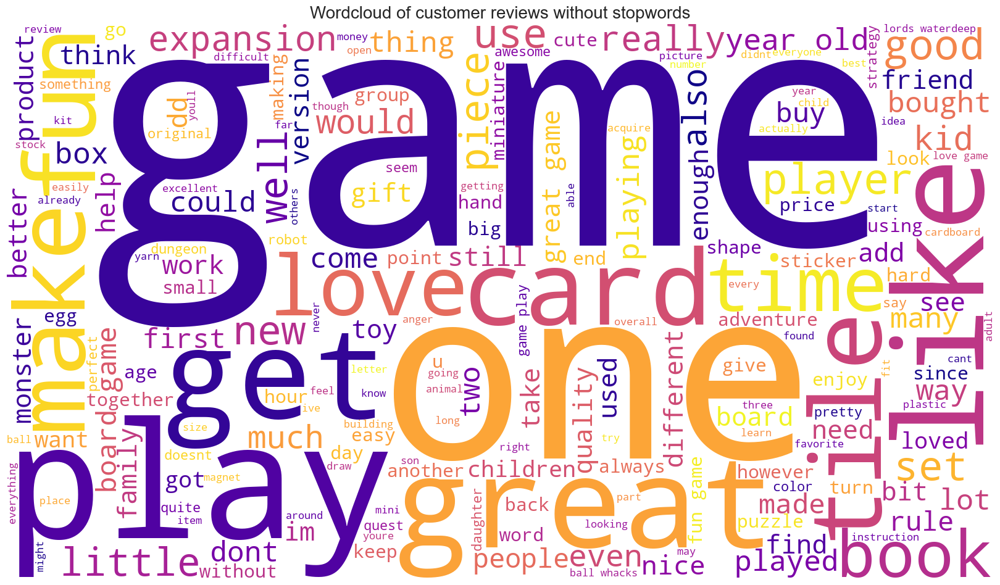

In [404]:
# Plot the WordCloud image.                    
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(word_cloud) 
plt.axis('off') 
plt.tight_layout(pad = 0)
plt.title('Wordcloud of customer reviews without stopwords',fontsize=20)

### Summary

In [406]:
# Convert list of tokens into a string variable.
# Define an empty string variable.
summary_tokens_string = ''

for token in summary_no_sw:
    # Add each filtered token word to the string.
    summary_tokens_string = summary_tokens_string + token + ' '

In [407]:
# Set the colour palette.
sns.set(color_codes=True)

# Create a WordCloud object.
word_cloud = WordCloud(width = 1600, height = 900, 
                background_color ='white',
                colormap = 'plasma', 
                stopwords = 'none',
                min_font_size = 10).generate(summary_tokens_string)

Text(0.5, 1.0, 'Wordcloud of customer summary without stopwords')

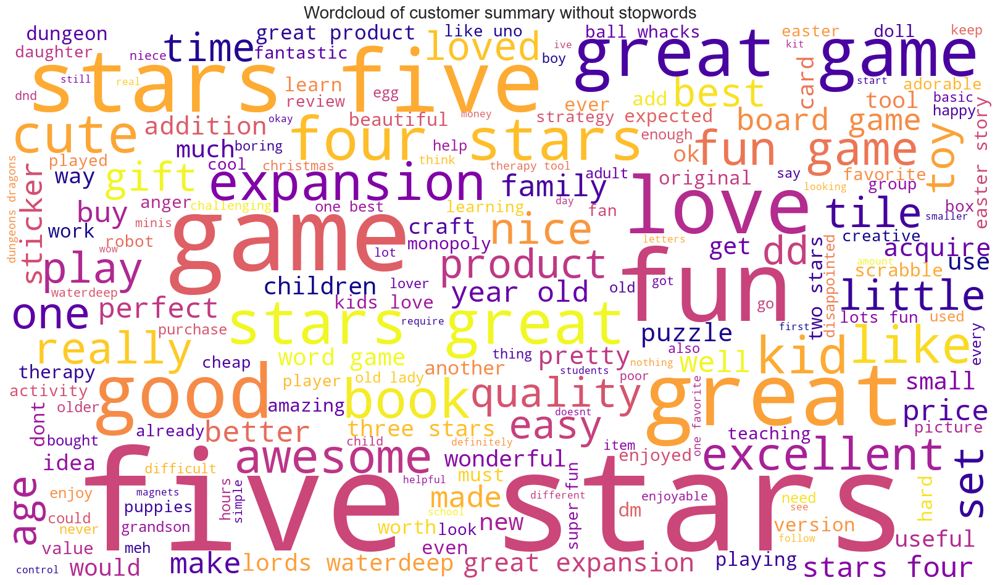

In [408]:
# Plot the WordCloud image.                    
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(word_cloud) 
plt.axis('off') 
plt.tight_layout(pad = 0)
plt.title('Wordcloud of customer summary without stopwords',fontsize=20)

### 4d) Identify 15 most common words

### Review


In [411]:
# Generate a DataFrame from Counter.
counts_review = pd.DataFrame(Counter(review_no_sw).most_common(15),
                      columns=['Word', 'Frequency']).set_index('Word')

# Preview data.
counts_review

,Frequency
Word,
game,1685
great,596
fun,553
one,530
play,502
like,414
love,331
really,319
get,319


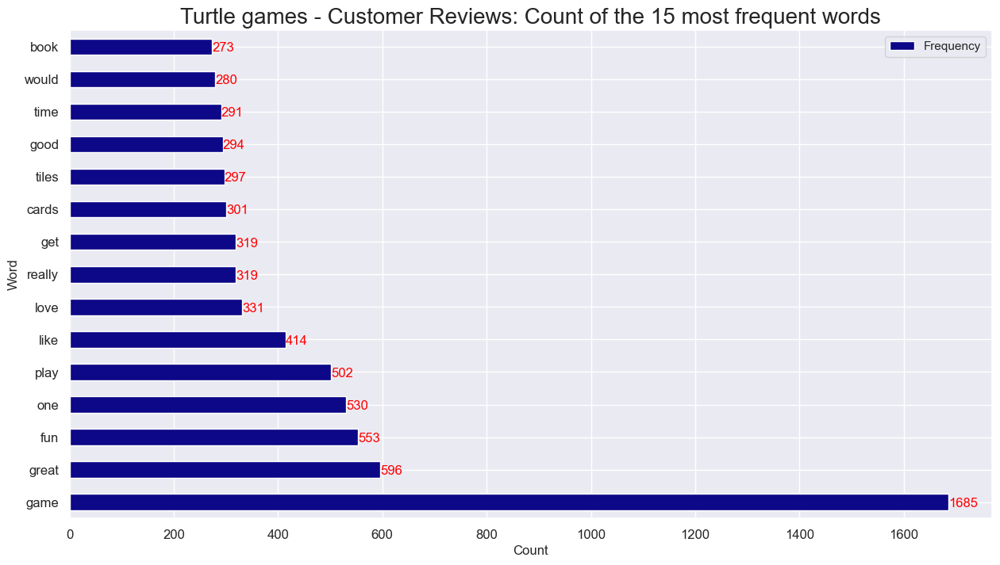

In [412]:
# visualise the 15 most common words - review

# Set the plot type.
ax = counts_review.plot(kind='barh', figsize=(15, 8), fontsize=12,colormap ='plasma')

# Set the labels.
ax.set_xlabel('Count', fontsize=12)
ax.set_ylabel('Word', fontsize=12)
ax.set_title("Turtle games - Customer Reviews: Count of the 15 most frequent words",fontsize=20)

# Draw the bar labels.
for i in ax.patches:
    ax.text(i.get_width()+.41, i.get_y()+.1, str(round((i.get_width()), 2)),fontsize=12, color='red')

> Many reviews mention the word 'game', potentially meaning there is a lot of opinions about the games sold by this company. There is high frequency of the words 'fun' and 'great' indicating there may be a general positive sentiment, but we will explore this later

### summary

In [415]:
# Determine the 15 most common words - summary

# Generate a DataFrame from Counter.
counts_summary = pd.DataFrame(Counter(summary_no_sw).most_common(15),
                      columns=['Word', 'Frequency']).set_index('Word')

# Preview data.
counts_summary

,Frequency
Word,
stars,466
five,381
game,319
great,295
fun,218
love,93
good,92
four,58
like,54


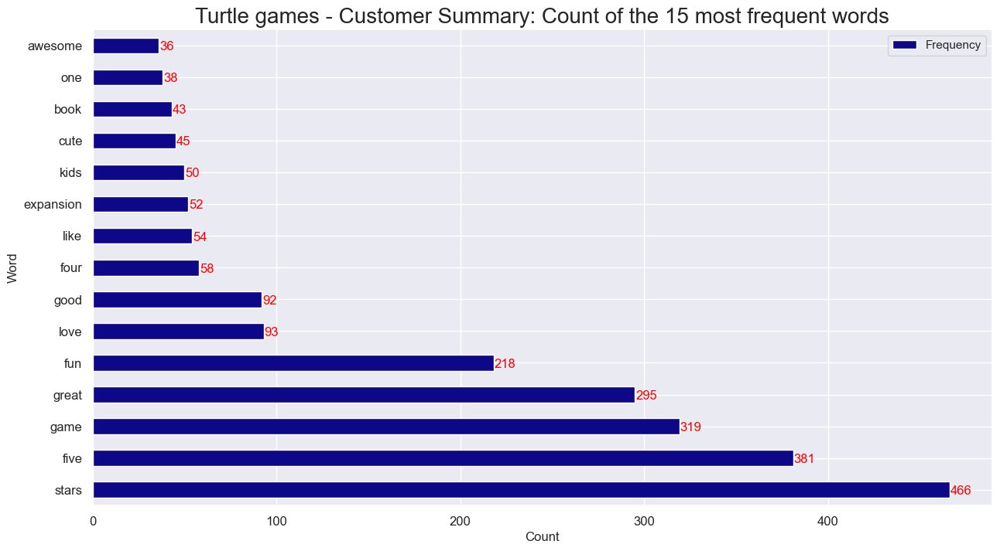

In [416]:
# visualise the 15 most common words - summary
# Set the plot type.
ax = counts_summary.plot(kind='barh', figsize=(15, 8), fontsize=12,colormap ='plasma')

# Set the labels.
ax.set_xlabel('Count', fontsize=12)
ax.set_ylabel('Word', fontsize=12)
ax.set_title("Turtle games - Customer Summary: Count of the 15 most frequent words",fontsize=20)

# Draw the bar labels.
for i in ax.patches:
    ax.text(i.get_width()+.41, i.get_y()+.1, str(round((i.get_width()), 2)),fontsize=12, color='red')

> 'stars' is the highest frequency word, and looking at the second highest frequency word 'five' I assume these 2 words are paired together (i.e five stars) potentially indicating that that many customers are saying the products sold by this company are 'five stars' which is a positive thing

## 5. TextBlob Sentiment Analysis

### Polarity scores - range [-1.0, 1.0]

In [420]:
# Determine polarity of review using 'generate_polarity' user defined function
turtle4['review_polarity'] = turtle4['review_cleaned'].apply(generate_polarity)

# Determine polarity of summary using 'generate_polarity' user defined function
turtle4['summary_polarity'] = turtle4['summary_cleaned'].apply(generate_polarity)

In [421]:
# view top 5 rows to confirm function was applied
turtle4.head()

,review,summary,review_cleaned,summary_cleaned,review_tokens,summary_tokens,review_polarity,summary_polarity
0,"when it comes to a dm's screen, the space on t...",the fact that 50% of this space is wasted on a...,when it comes to a dms screen the space on the...,the fact that 50 of this space is wasted on ar...,"[when, it, comes, to, a, dms, screen, the, spa...","[the, fact, that, 50, of, this, space, is, was...",-0.036111,0.15
1,an open letter to galeforce9*: your unpainted ...,another worthless dungeon master's screen from...,an open letter to galeforce9 your unpainted mi...,another worthless dungeon masters screen from ...,"[an, open, letter, to, galeforce9, your, unpai...","[another, worthless, dungeon, masters, screen,...",0.035952,-0.80
2,"nice art, nice printing. why two panels are fi...","pretty, but also pretty useless",nice art nice printing why two panels are fill...,pretty but also pretty useless,"[nice, art, nice, printing, why, two, panels, ...","[pretty, but, also, pretty, useless]",0.116640,0.00
3,amazing buy! bought it as a gift for our new d...,five stars,amazing buy bought it as a gift for our new dm...,five stars,"[amazing, buy, bought, it, as, a, gift, for, o...","[five, stars]",0.578788,0.00
4,as my review of gf9's previous screens these w...,money trap,as my review of gf9s previous screens these we...,money trap,"[as, my, review, of, gf9s, previous, screens, ...","[money, trap]",-0.316667,0.00


Text(0.5, 1.0, 'Histogram of Polarity score - REVIEW')

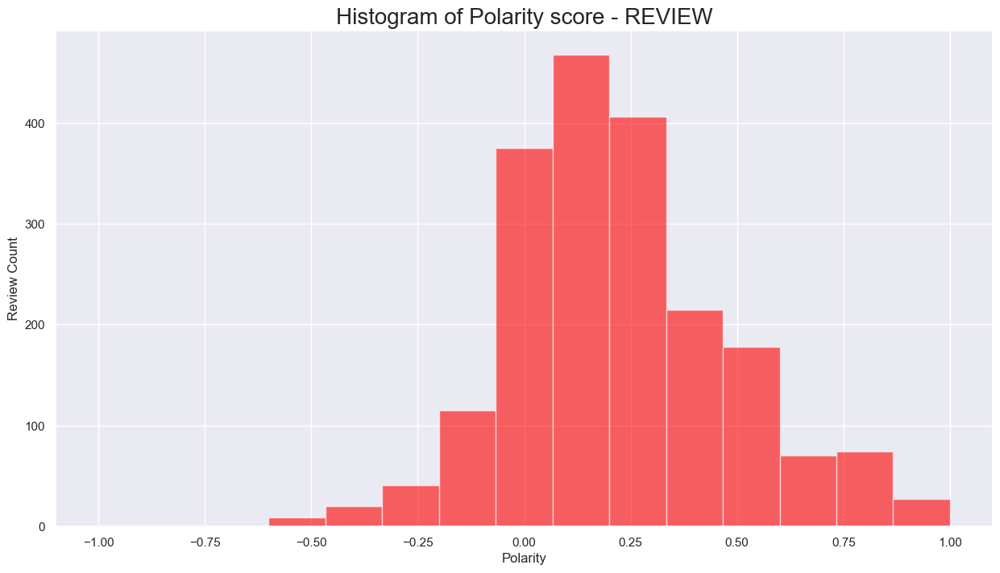

In [422]:
# Review: Create a histogram plot of polarity scores

# define the number of bins
num_bins = 15

# Set the plot area.
plt.figure(figsize=(15,8))

# Define the bars.
n, bins, patches = plt.hist(turtle4['review_polarity'], num_bins, facecolor='red', alpha=0.6)

# Set the labels.
plt.xlabel('Polarity', fontsize=12)
plt.ylabel('Review Count', fontsize=12)
plt.title('Histogram of Polarity score - REVIEW', fontsize=20)

> the above histogram shows a high proportion of reviews are positive indicated by polarity score>0

Text(0.5, 1.0, 'Histogram of Polarity score - SUMMARY')

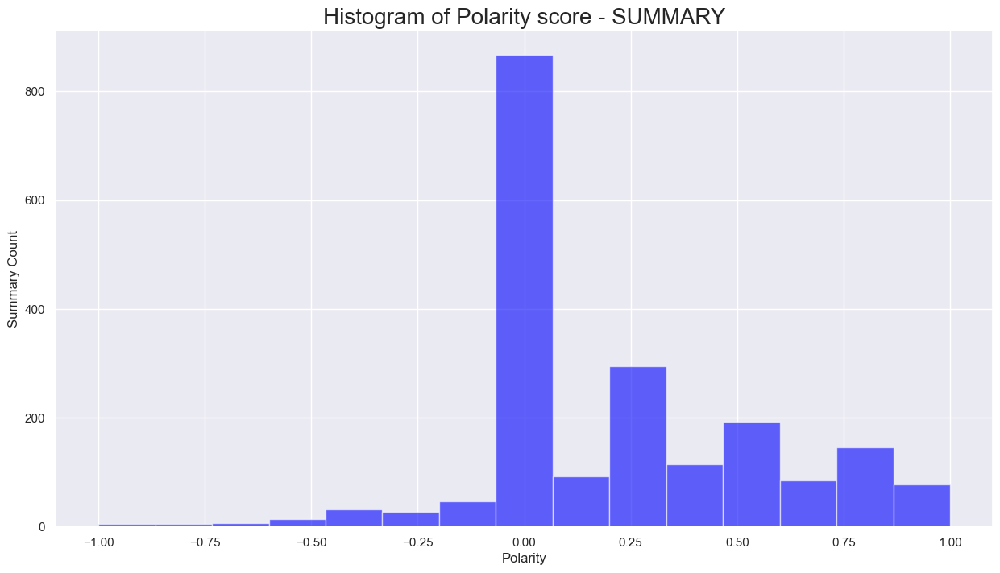

In [424]:
# Summary: Create a histogram plot of polarity scores

# define the number of bins
num_bins = 15

# Set the plot area.
plt.figure(figsize=(15,8))

# Define the bars.
n, bins, patches = plt.hist(turtle4['summary_polarity'], num_bins, facecolor='blue', alpha=0.6)

# Set the labels.
plt.xlabel('Polarity', fontsize=12)
plt.ylabel('Summary Count', fontsize=12)
plt.title('Histogram of Polarity score - SUMMARY', fontsize=20)

> the above histogram shows a high proportion of summaries are positive indicated by polarity score>0

### Subjectivity score - range [0.0, 1.0]

In [427]:
# Determine subjectivty score of review_cleaned using 'generate_subjectivity' user defined function
turtle4['review_subjectivity'] = turtle4['review_cleaned'].apply(generate_subjectivity)

# Determine subjectivty score of summary_cleaned using 'generate_subjectivity' user defined function
turtle4['summary_subjectivity'] = turtle4['summary_cleaned'].apply(generate_subjectivity)

In [428]:
# view top 5 rows to confirm function was applied
turtle4.head()

,review,summary,review_cleaned,summary_cleaned,review_tokens,summary_tokens,review_polarity,summary_polarity,review_subjectivity,summary_subjectivity
0,"when it comes to a dm's screen, the space on t...",the fact that 50% of this space is wasted on a...,when it comes to a dms screen the space on the...,the fact that 50 of this space is wasted on ar...,"[when, it, comes, to, a, dms, screen, the, spa...","[the, fact, that, 50, of, this, space, is, was...",-0.036111,0.15,0.486111,0.500000
1,an open letter to galeforce9*: your unpainted ...,another worthless dungeon master's screen from...,an open letter to galeforce9 your unpainted mi...,another worthless dungeon masters screen from ...,"[an, open, letter, to, galeforce9, your, unpai...","[another, worthless, dungeon, masters, screen,...",0.035952,-0.80,0.442976,0.900000
2,"nice art, nice printing. why two panels are fi...","pretty, but also pretty useless",nice art nice printing why two panels are fill...,pretty but also pretty useless,"[nice, art, nice, printing, why, two, panels, ...","[pretty, but, also, pretty, useless]",0.116640,0.00,0.430435,0.733333
3,amazing buy! bought it as a gift for our new d...,five stars,amazing buy bought it as a gift for our new dm...,five stars,"[amazing, buy, bought, it, as, a, gift, for, o...","[five, stars]",0.578788,0.00,0.784848,0.000000
4,as my review of gf9's previous screens these w...,money trap,as my review of gf9s previous screens these we...,money trap,"[as, my, review, of, gf9s, previous, screens, ...","[money, trap]",-0.316667,0.00,0.316667,0.000000


Text(0.5, 1.0, 'Histogram of Subjectivity score - REVIEW')

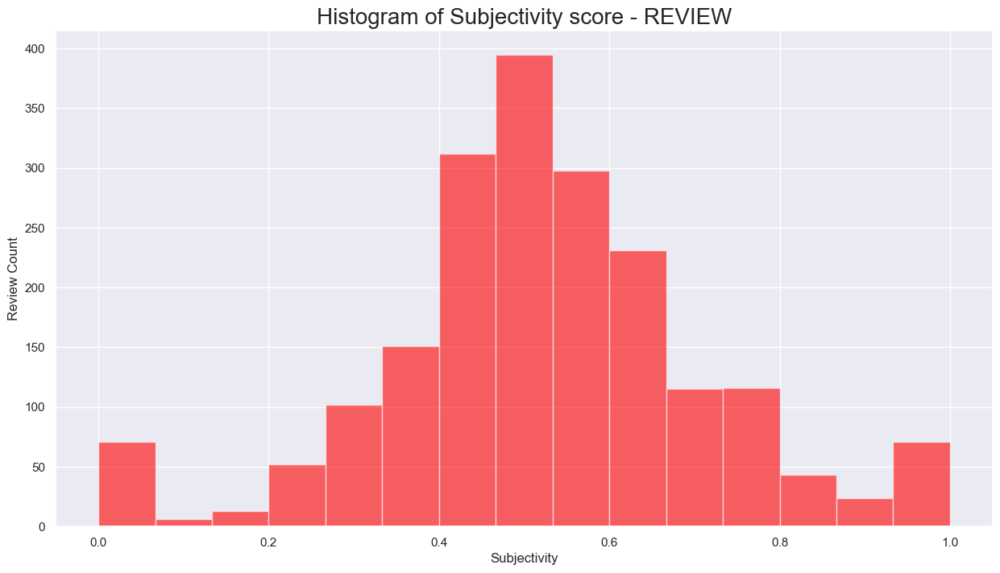

In [429]:
# Review: Create a histogram plot of subjectivity scores

# define the number of bins
num_bins = 15

# Set the plot area.
plt.figure(figsize=(15,8))

# Define the bars.
n, bins, patches = plt.hist(turtle4['review_subjectivity'], num_bins, facecolor='red', alpha=0.6)

# Set the labels.
plt.xlabel('Subjectivity', fontsize=12)
plt.ylabel('Review Count', fontsize=12)
plt.title('Histogram of Subjectivity score - REVIEW', fontsize=20)

> the above histogram shows a high proportion of reviews are a neutral level of subjectivity, meaning the text is neither highly objective nor highly subjective

Text(0.5, 1.0, 'Histogram of Subjectivity score - SUMMARY')

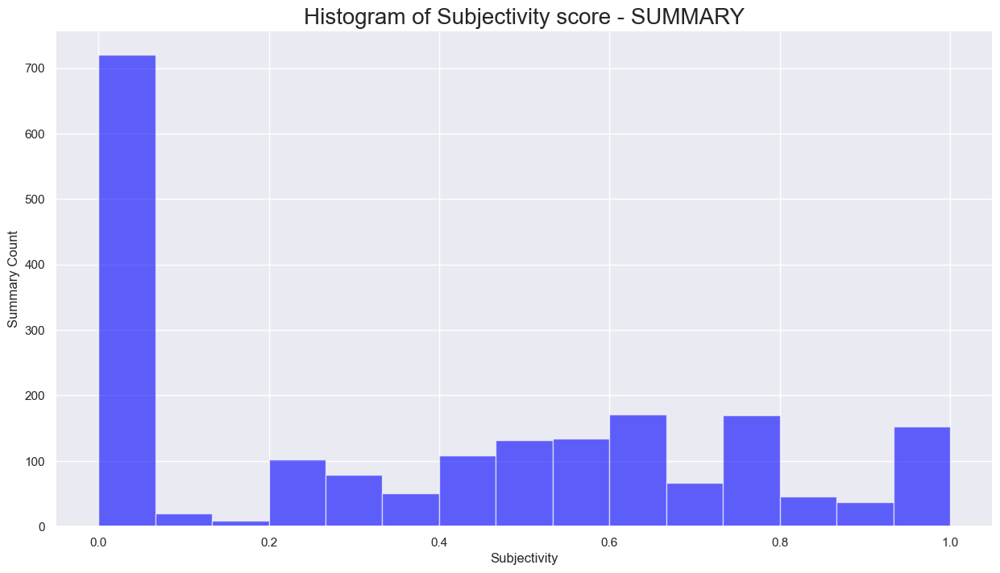

In [431]:
# Summary: Create a histogram plot of subjectivity scores

# define the number of bins
num_bins = 15

# Set the plot area.
plt.figure(figsize=(15,8))

# Define the bars.
n, bins, patches = plt.hist(turtle4['summary_subjectivity'], num_bins, facecolor='blue', alpha=0.6)

# Set the labels.
plt.xlabel('Subjectivity', fontsize=12)
plt.ylabel('Summary Count', fontsize=12)
plt.title('Histogram of Subjectivity score - SUMMARY',fontsize=20)

> the above histogram shows that a high level of summaries are very objective and contains little to no personal opinion shown by the the high proportion of subjectivity scores equalling to 0

## 6. Identify top 20 positive and negative reviews and summaries respectively

In [434]:
# Top 20 negative reviews.

# Create a DataFrame.
negative_sentiment_review = turtle4.nsmallest(20, 'review_polarity')

# Eliminate unnecessary columns/ keep necessary columns
negative_sentiment_review = negative_sentiment_review[['review_cleaned','review_polarity']]

# View output.
negative_sentiment_review.style.set_properties(subset=['review_cleaned'], **{'width': '1200px'})

,review_cleaned,review_polarity
208,booo unles you are patient know how to measure i didnt have the patience neither did my daughter boring unless you are a craft person which i am not,-1.000000
182,incomplete kit very disappointing,-0.780000
1804,im sorry i just find this product to be boring and to be frank juvenile,-0.583333
364,one of my staff will be using this game soon so i dont know how well it works as yet but after looking at the cards i believe it will be helpful in getting a conversation started regarding anger and what to do to control it,-0.550000
117,i bought this as a christmas gift for my grandson its a sticker book so how can i go wrong with this gift,-0.500000
227,this was a gift for my daughter i found it difficult to use,-0.500000
230,i found the directions difficult,-0.500000
290,instructions are complicated to follow,-0.500000
301,difficult,-0.500000
1524,expensive for what you get,-0.500000


> As shown by the top 20 negative reviews above, we can see see there is a lot of mention about difficulty and disappointment. The last 4 rows also seem to be positive based on the text, but TextBlob has incorrectly classified them as negative

In [436]:
# Top 20 negative summaries.

# Create a DataFrame.
negative_sentiment_summary = turtle4.nsmallest(20, 'summary_polarity')

# Eliminate unnecessary columns/ keep necessary columns
negative_sentiment_summary = negative_sentiment_summary[['summary_cleaned','summary_polarity']]

# View output.
negative_sentiment_summary.style.set_properties(subset=['summary_cleaned'], **{'width': '1200px'})

,summary_cleaned,summary_polarity
21,the worst value ive ever seen,-1.000000
208,boring unless you are a craft person which i am,-1.000000
829,boring,-1.000000
1166,before this i hated running any rpg campaign dealing with towns because it,-0.900000
1,another worthless dungeon masters screen from galeforce9,-0.800000
144,disappointed,-0.750000
631,disappointed,-0.750000
793,disappointed,-0.750000
1620,disappointed,-0.750000
363,promotes anger instead of teaching calming methods,-0.700000


> as shown by the top 20 negative summaries above, we can see that there is a very high level of disappointment and the polarity scores are reflective of what the sentiment is

In [438]:
# Top 20 positive reviews.

# Create a DataFrame.
postive_sentiment_review = turtle4.nlargest(20, 'review_polarity')

# Eliminate unnecessary columns/ keep necessary columns
postive_sentiment_review = postive_sentiment_review[['review_cleaned','review_polarity']]

# View output.
postive_sentiment_review.style.set_properties(subset=['review_cleaned'], **{'width': '1200px'})

,review_cleaned,review_polarity
7,came in perfect condition,1.000000
165,awesome book,1.000000
194,awesome gift,1.000000
496,excellent activity for teaching selfmanagement skills,1.000000
524,perfect just what i ordered,1.000000
591,wonderful product,1.000000
609,delightful product,1.000000
621,wonderful for my grandson to learn the resurrection story,1.000000
790,perfect,1.000000
933,awesome,1.000000


> As shown by the top 20 positive reviews above, many customers are mentioning the word 'awesome' and the polarity scores seem to reflect the sentiment of the text correctly

In [440]:
# Top 20 positive summaries.

# Create a DataFrame.
postive_sentiment_summary= turtle4.nlargest(20, 'summary_polarity')

# Eliminate unnecessary columns/ keep necessary columns
postive_sentiment_summary = postive_sentiment_summary[['summary_cleaned','summary_polarity']]

# View output.
postive_sentiment_summary.style.set_properties(subset=['summary_cleaned'], **{'width': '1200px'})

,summary_cleaned,summary_polarity
6,best gm screen ever,1.000000
28,wonderful designs,1.000000
32,perfect,1.000000
80,theyre the perfect size to keep in the car or a diaper,1.000000
134,perfect for preschooler,1.000000
140,awesome sticker activity for the price,1.000000
161,awesome book,1.000000
163,he was very happy with his gift,1.000000
187,awesome,1.000000
210,awesome and welldesigned for 9 year olds,1.000000


> As shown by the top 20 positive summaries, many customers are mentioning 'excellent', although the last comment has been scored incorrectly as it seems more negative than positive

### classifying TextBlob sentiment

In [443]:
# Create a TextBlob sentiment category for easy interpretation - REVIEW
# we can use our user defined function (classify_sentiment_textblob) to do this
turtle4['review_sentiment_tb'] = turtle4['review_polarity'].apply(classify_sentiment_textblob)

In [444]:
# Create a TextBlob sentiment category for easy interpretation - SUMMARY
# we can use our user defined function (classify_sentiment_textblob) to do this
turtle4['summary_sentiment_tb'] = turtle4['summary_polarity'].apply(classify_sentiment_textblob)

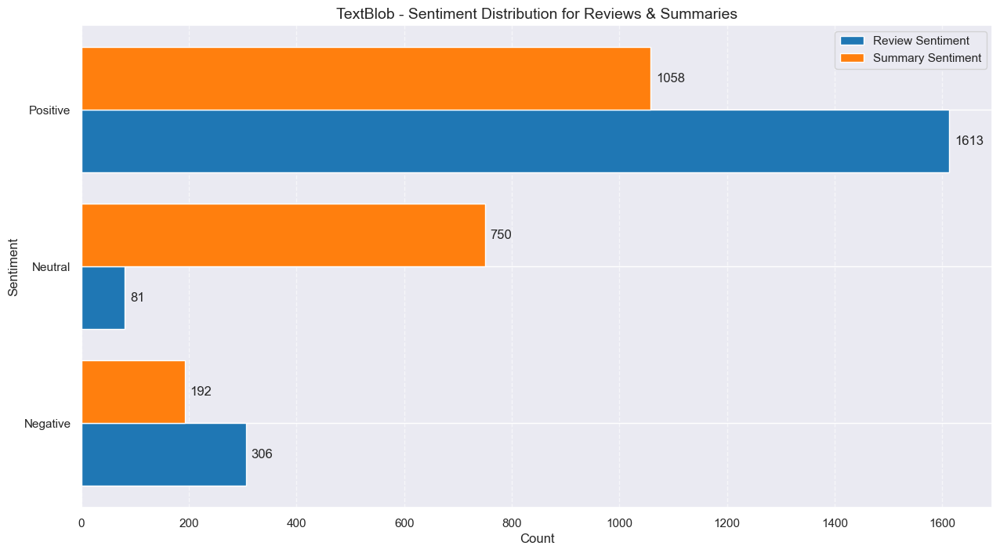

In [445]:
# Count occurrences of each sentiment
review_sentiment_counts = turtle4['review_sentiment_tb'].value_counts()
summary_sentiment_counts = turtle4['summary_sentiment_tb'].value_counts()

# Combine counts into a new DataFrame for easier plotting
sentiment_counts_tb = pd.DataFrame({'Review Sentiment': review_sentiment_counts, 'Summary Sentiment': summary_sentiment_counts})

# Create positions for bars
sentiment_categories = sentiment_counts_tb.index  # ['Negative', 'Neutral', 'Positive']
y_pos = np.arange(len(sentiment_categories))

# Convert DataFrame values to NumPy arrays
review_values = sentiment_counts_tb["Review Sentiment"].values
summary_values = sentiment_counts_tb["Summary Sentiment"].values

# Create figure
plt.figure(figsize=(15, 8))

# Define bar width
bar_width = 0.4  

# Plot horizontal bars for Review and Summary sentiments
plt.barh(y_pos - bar_width/2, review_values, height=bar_width, color='#1f77b4', label='Review Sentiment')
plt.barh(y_pos + bar_width/2, summary_values, height=bar_width, color='#ff7f0e', label='Summary Sentiment')

# Add value labels to bars
for i in range(len(sentiment_categories)):
    plt.text(review_values[i] + 10, y_pos[i] - bar_width/2, str(review_values[i]), va='center', fontsize=12)
    plt.text(summary_values[i] + 10, y_pos[i] + bar_width/2, str(summary_values[i]), va='center', fontsize=12)

# Labels and title
plt.xlabel("Count", fontsize=12)
plt.ylabel("Sentiment", fontsize=12)
plt.yticks(y_pos, sentiment_categories)  # Set y-axis labels to sentiment categories
plt.title("TextBlob - Sentiment Distribution for Reviews & Summaries", fontsize=14)
plt.legend()
plt.grid(axis='x', linestyle='--', alpha=0.6)

> TextBlob generally classifies most of the reviews and summaries as positive. Interestingly there is a huge gap between reviews and summaries being classified as neutral.

# Vader Sentiment Analysis

In [448]:
# create a new data frame for the required columns (review & summary) as turtle5
turtle5 = turtle[['review','summary']]

In [449]:
# check the metadata to confirm data was loaded
turtle5.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   review   2000 non-null   object
 1   summary  2000 non-null   object
dtypes: object(2)
memory usage: 31.4+ KB


In [450]:
# Initialise the SentimentIntensityAnalyser() class
analyzer = SentimentIntensityAnalyzer()

In [451]:
# Calculate compound, positive, neutral and negative scores - REVIEW
# we can use our user defined function (get_sentiment_scores) to do this
turtle5[['review_neg', 'review_neu', 'review_pos', 'review_compound']] = turtle5['review'].apply(get_sentiment_scores)

In [452]:
# sense check function was applied correctly by checking metadata
turtle5.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   review           2000 non-null   object 
 1   summary          2000 non-null   object 
 2   review_neg       2000 non-null   float64
 3   review_neu       2000 non-null   float64
 4   review_pos       2000 non-null   float64
 5   review_compound  2000 non-null   float64
dtypes: float64(4), object(2)
memory usage: 93.9+ KB


In [453]:
# Calculate compound, positive, neutral and negative scores - SUMMARY
# we can use our user defined function (get_sentiment_scores) to do this
turtle5[['summary_neg', 'summary_neu', 'summary_pos', 'summary_compound']] = turtle5['summary'].apply(get_sentiment_scores)

In [454]:
# sense check function was applied correctly by checking metadata
turtle5.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   review            2000 non-null   object 
 1   summary           2000 non-null   object 
 2   review_neg        2000 non-null   float64
 3   review_neu        2000 non-null   float64
 4   review_pos        2000 non-null   float64
 5   review_compound   2000 non-null   float64
 6   summary_neg       2000 non-null   float64
 7   summary_neu       2000 non-null   float64
 8   summary_pos       2000 non-null   float64
 9   summary_compound  2000 non-null   float64
dtypes: float64(8), object(2)
memory usage: 156.4+ KB


### classifying Vader sentiment

In [456]:
# Create a sentiment category for easy interpretation - REVIEW
# we can use our user defined function (classify_sentiment_vader) to do this
turtle5['review_sentiment_vader'] = turtle5['review_compound'].apply(classify_sentiment_vader)

In [457]:
# sense check function was applied correctly by vieweing the df
turtle5.head()

,review,summary,review_neg,review_neu,review_pos,review_compound,summary_neg,summary_neu,summary_pos,summary_compound,review_sentiment_vader
0,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...,0.109,0.856,0.035,-0.7406,0.138,0.735,0.126,-0.0711,Negative
1,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...,0.092,0.703,0.205,0.9433,0.326,0.674,0.000,-0.4404,Positive
2,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless",0.122,0.723,0.155,0.6939,0.306,0.165,0.529,0.4019,Positive
3,Amazing buy! Bought it as a gift for our new d...,Five Stars,0.000,0.477,0.523,0.8997,0.000,1.000,0.000,0.0000,Positive
4,As my review of GF9's previous screens these w...,Money trap,0.203,0.797,0.000,-0.6808,0.697,0.303,0.000,-0.3182,Negative


In [458]:
# Create a sentiment category for easy interpretation - SUMMARY
# we can use our user defined function (classify_sentiment_vader) to do this
turtle5['summary_sentiment_vader'] = turtle5['summary_compound'].apply(classify_sentiment_vader)

In [459]:
# sense check function was applies correctly by viewing the df
turtle5.head()

,review,summary,review_neg,review_neu,review_pos,review_compound,summary_neg,summary_neu,summary_pos,summary_compound,review_sentiment_vader,summary_sentiment_vader
0,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...,0.109,0.856,0.035,-0.7406,0.138,0.735,0.126,-0.0711,Negative,Negative
1,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...,0.092,0.703,0.205,0.9433,0.326,0.674,0.000,-0.4404,Positive,Negative
2,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless",0.122,0.723,0.155,0.6939,0.306,0.165,0.529,0.4019,Positive,Positive
3,Amazing buy! Bought it as a gift for our new d...,Five Stars,0.000,0.477,0.523,0.8997,0.000,1.000,0.000,0.0000,Positive,Neutral
4,As my review of GF9's previous screens these w...,Money trap,0.203,0.797,0.000,-0.6808,0.697,0.303,0.000,-0.3182,Negative,Negative


Text(0.5, 1.0, 'Histogram of Vader Compound Score - REVIEW')

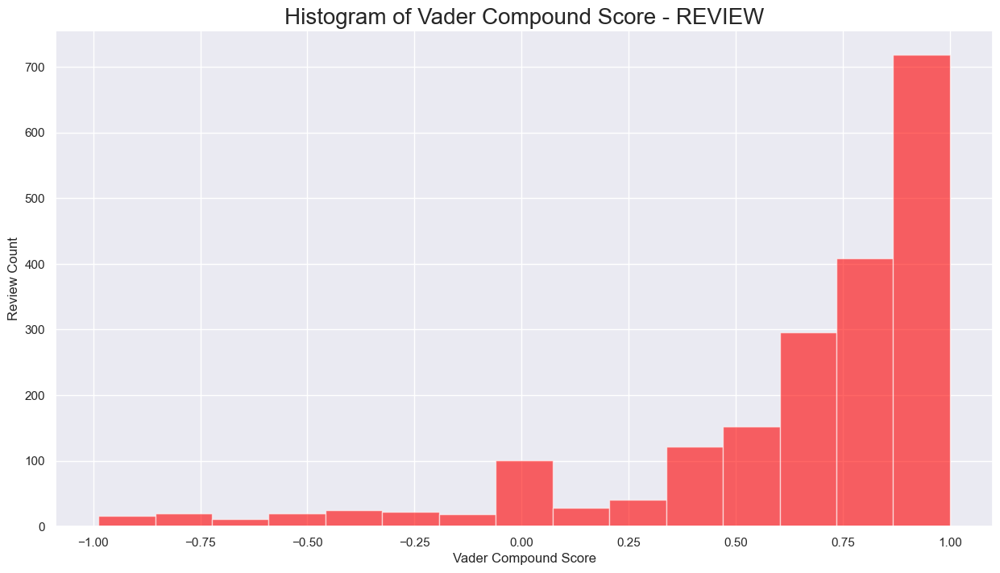

In [460]:
# Review: Create a histogram plot of compound scores (review_compound)

# define the number of bins
num_bins = 15

# Set the plot area.
plt.figure(figsize=(15,8))

# Define the bars.
n, bins, patches = plt.hist(turtle5['review_compound'], num_bins, facecolor='red', alpha=0.6)

# Set the labels.
plt.xlabel('Vader Compound Score', fontsize=12)
plt.ylabel('Review Count', fontsize=12)
plt.title('Histogram of Vader Compound Score - REVIEW', fontsize=20)

> The above histogram shows mainly high proportions of reviews with positive sentiment

Text(0.5, 1.0, 'Histogram of Vader Compound Score - SUMMARY')

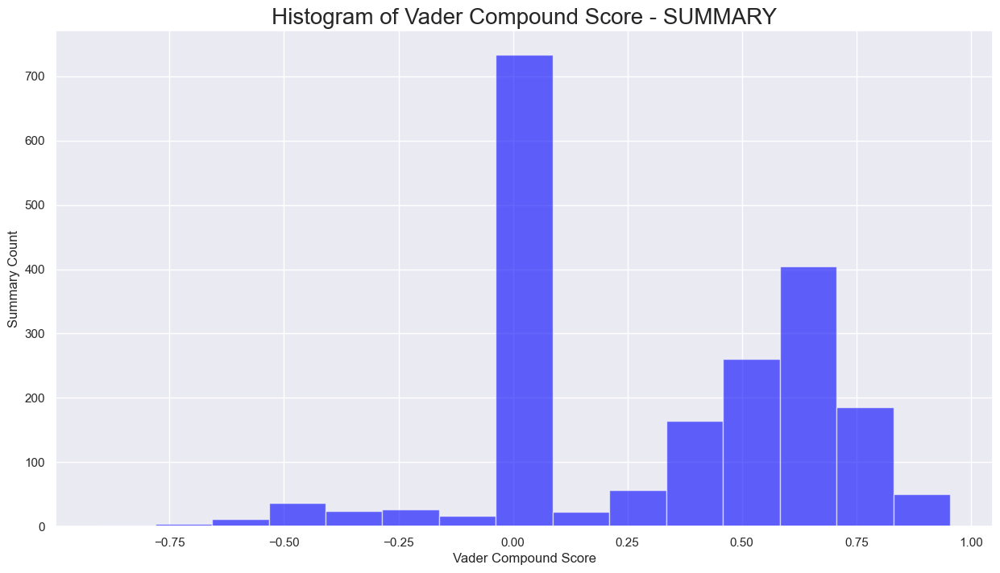

In [462]:
# Summary: Create a histogram plot of compound scores (summary_compound)

# define the number of bins
num_bins = 15

# Set the plot area.
plt.figure(figsize=(15,8))

# Define the bars.
n, bins, patches = plt.hist(turtle5['summary_compound'], num_bins, facecolor='blue', alpha=0.6)

# Set the labels.
plt.xlabel('Vader Compound Score', fontsize=12)
plt.ylabel('Summary Count', fontsize=12)
plt.title('Histogram of Vader Compound Score - SUMMARY', fontsize=20)

> The above histogram shows mainly high proportions of summaries with neutral sentiment shown by a high counts of compound scores equalling to 0

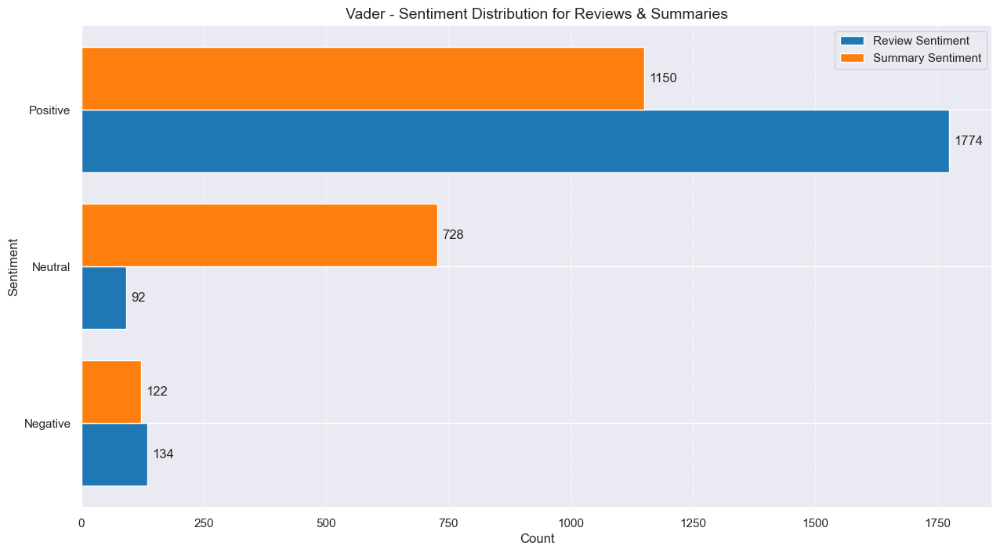

In [464]:
# Count occurrences of each sentiment
review_sentiment_counts = turtle5['review_sentiment_vader'].value_counts()
summary_sentiment_counts = turtle5['summary_sentiment_vader'].value_counts()

# Combine counts into a new DataFrame for easier plotting
sentiment_counts_vader = pd.DataFrame({'Review Sentiment': review_sentiment_counts, 'Summary Sentiment': summary_sentiment_counts})

# Create positions for bars
sentiment_categories = sentiment_counts_vader.index  # ['Negative', 'Neutral', 'Positive']
y_pos = np.arange(len(sentiment_categories))

# Convert DataFrame values to NumPy arrays
review_values = sentiment_counts_vader["Review Sentiment"].values
summary_values = sentiment_counts_vader["Summary Sentiment"].values

# Create figure
plt.figure(figsize=(15, 8))

# Define bar width
bar_width = 0.4  

# Plot horizontal bars for Review and Summary sentiments
plt.barh(y_pos - bar_width/2, review_values, height=bar_width, color='#1f77b4', label='Review Sentiment')
plt.barh(y_pos + bar_width/2, summary_values, height=bar_width, color='#ff7f0e', label='Summary Sentiment')

# Add value labels to bars
for i in range(len(sentiment_categories)):
    plt.text(review_values[i] + 10, y_pos[i] - bar_width/2, str(review_values[i]), va='center', fontsize=12)
    plt.text(summary_values[i] + 10, y_pos[i] + bar_width/2, str(summary_values[i]), va='center', fontsize=12)

# Labels and title
plt.xlabel("Count", fontsize=12)
plt.ylabel("Sentiment", fontsize=12)
plt.yticks(y_pos, sentiment_categories)  # Set y-axis labels to sentiment categories
plt.title("Vader - Sentiment Distribution for Reviews & Summaries", fontsize=14)
plt.legend()
plt.grid(axis='x', linestyle='--', alpha=0.6)

> The vader sentiment distribution shows reviews and summaries mainly received positive sentiment. Vader has classified reviews & summaries with similar negative counts, but there is a much more wider gap between reviews & summaries with neutral sentiment.

In [466]:
# top 20 negative reviews on compound score

# Create a DataFrame.
negative_review = turtle5.nsmallest(20, 'review_compound')

# Eliminate unnecessary columns/ keep necessary columns
negative_review = negative_review[['review','review_compound']]

# View output.
negative_review.style.set_properties(subset=['review'], **{'width': '1200px'})

In [467]:
# top 20 negative summary on compound score

# Create a DataFrame.
negative_summary = turtle5.nsmallest(20, 'summary_compound')

# Eliminate unnecessary columns/ keep necessary columns
negative_summary = negative_summary[['summary','summary_compound']]

# View output.
negative_summary.style.set_properties(subset=['summary'], **{'width': '1200px'})

,summary,summary_compound
882,"A crappy cardboard ghost of the original. Hard to believe they did this, but they did. Shame on Hasbro. Disgusting.",-0.905200
1565,"The TARDIS, The Doctor, River Song, Amy, Rory Fight Every Enemy - In Cards!",-0.750000
947,No 20 sided die,-0.726900
328,Defective- poor QC,-0.718400
1003,Then you will find this board game to be dumb and boring,-0.680800
1166,before this I hated running any RPG campaign dealing with towns because it ...,-0.636900
426,but it gets repetitive and the students start to get bored after about half a round,-0.631000
847,Worst quality adult board game I've even seen,-0.624900
173,Horrible! Nothing more to say Would give zero stars ...,-0.584800
364,Anger Control game,-0.571900


In [468]:
# top 20 positive reviews on compound score

# Create a DataFrame.
positive_review = turtle5.nlargest(20, 'review_compound')

# Eliminate unnecessary columns/ keep necessary columns
positive_review = positive_review[['review','review_compound']]

# View output.
positive_review.style.set_properties(subset=['review'], **{'width': '1200px'})

In [469]:
# top 20 positive summary on compound score

# Create a DataFrame.
positive_summary = turtle5.nlargest(20, 'summary_compound')

# Eliminate unnecessary columns/ keep necessary columns
positive_summary = positive_summary[['summary','summary_compound']]

# View output.
positive_summary.style.set_properties(subset=['summary'], **{'width': '1200px'})

,summary,summary_compound
1201,Wow! What a great set of tiles for such a great price. A great starter set.,0.954500
1699,"Great for playing, great for creative workshops too!",0.921500
1121,Wrath of Ashardalon: great investment for an avid RPG fan who enjoys tabletop as well as CRPGs,0.918600
1955,"Easy to learn, great fun to play!",0.918400
703,"Great quality, very cute and perfect for my toddler",0.907300
491,but the kids really like it and helps start good discussion,0.898800
1845,"Fun, friendly, beautiful game!",0.893200
1029,"Great game, great value.",0.891000
1189,Great game. Value for the price is great also,0.891000
973,I wish all those who buy better luck. Fairly easy to understand and plenty of ...,0.888500


## Evaluate TextBlob vs Vader

Text(0.5, 1.0, 'TextBlob Sentiment Analysis - Relationship between review & summary polarity scores')

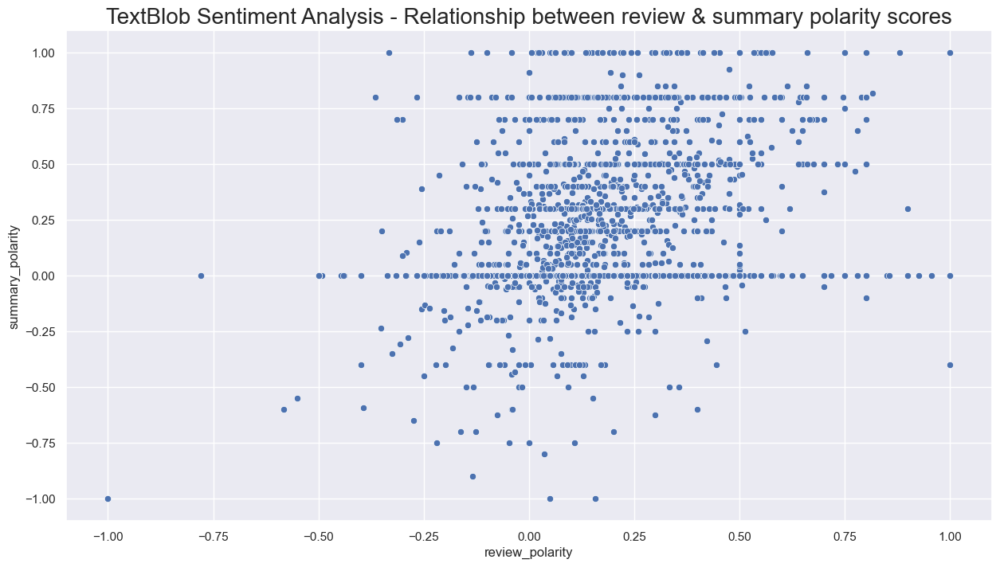

In [471]:
# relationship between review and summary polarity scores - textblob
sns.scatterplot(data=turtle4,x='review_polarity',y='summary_polarity')
plt.title('TextBlob Sentiment Analysis - Relationship between review & summary polarity scores',fontsize=20)

> Sentiment analysis using TextBlob, allows us to plot the above scatter graph showing polarity scores for 'review' against 'summary'. We can see that there is a slight positive correlation between 'review' and 'summary', with a majority of the points concentrated around the positive polarity area. This in itself is a good thing for Tutrtle games.
>
> However we do see that is classifies many reviews as positive, but their summary as neutral, as well as some reviews and positive but summary as negative.

Text(0.5, 1.0, 'Vader Sentiment Analysis - Relationship between review & summary compound scores')

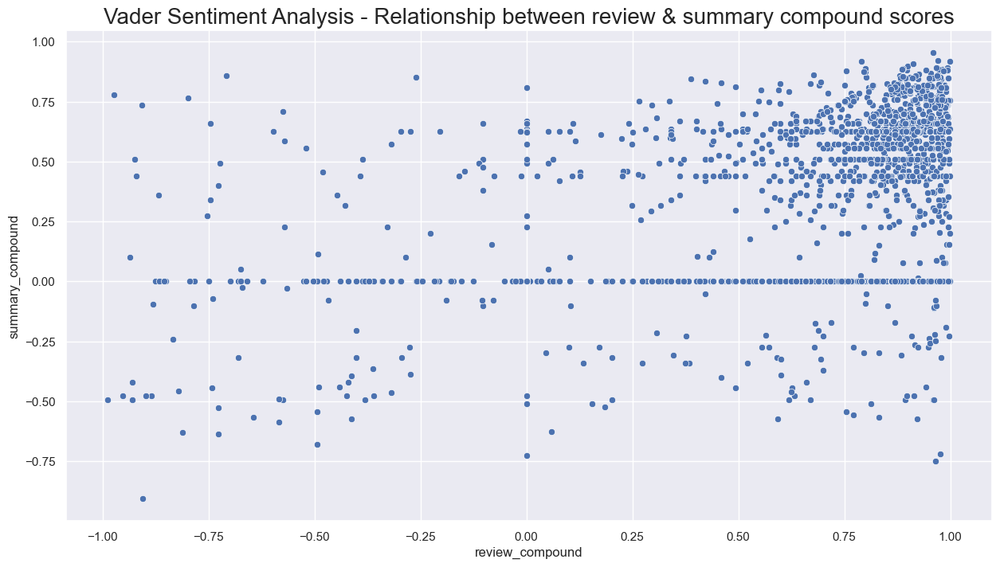

In [473]:
# relationship between review and summary compound scores - vader
sns.scatterplot(data=turtle5,x='review_compound',y='summary_compound')
plt.title('Vader Sentiment Analysis - Relationship between review & summary compound scores',fontsize=20)

> Sentiment analysis using Vader, allows us to plot the above scatter graph showing compound scores for 'review' against 'summary'. We can see that there is no correlation between 'review' and 'summary', where we would expect them to be.
>
> As we can see, there is a high concentration of data points on the top right which indicates that there are many reviews and summaries being classified as a positive sentiment
>
> There are also a large number of data points whos review is classified as positive, but their summary compound scores are 0, therefore they will be classified as neutral, indicating a miss match between these 2 variables using the Vader sentiment algorithm.

In [475]:
# Create Review Sentiment Comparison DataFrame
review_sentiment_comparison = pd.DataFrame({
    'TextBlob': sentiment_counts_tb['Review Sentiment'],
    'Vader': sentiment_counts_vader['Review Sentiment']})

review_sentiment_comparison

,TextBlob,Vader
Negative,306,134
Neutral,81,92
Positive,1613,1774


In [476]:
# Create Summary Sentiment Comparison DataFrame
summary_sentiment_comparison = pd.DataFrame({
    'TextBlob': sentiment_counts_tb['Summary Sentiment'],
    'Vader': sentiment_counts_vader['Summary Sentiment']})

summary_sentiment_comparison

,TextBlob,Vader
Negative,192,122
Neutral,750,728
Positive,1058,1150


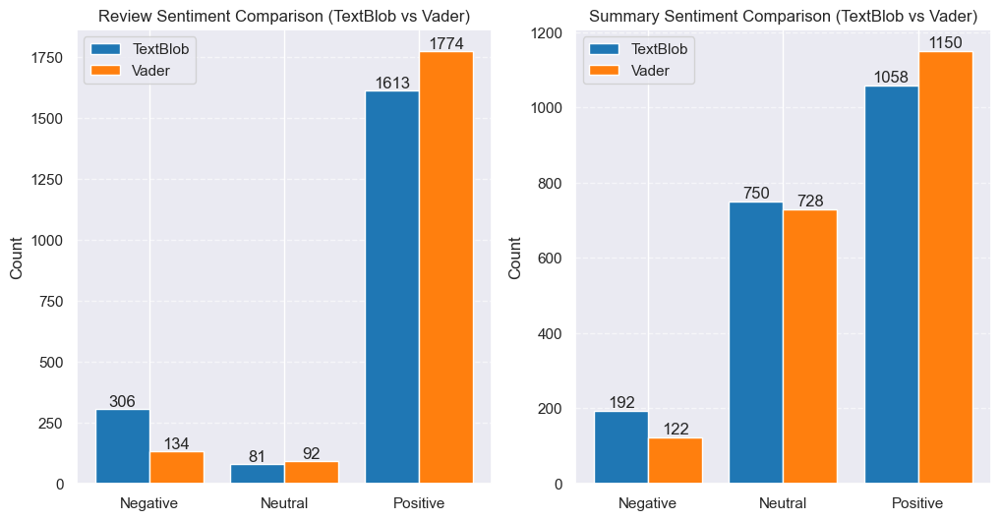

In [477]:
# View comparisons visually

# Define bar width
bar_width = 0.4  

# Create positions for bars
categories = review_sentiment_comparison.index  # ['Negative', 'Neutral', 'Positive']
x_pos = np.arange(len(categories))

# Create figure
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Function to add value labels on bars
def add_labels(ax, bars):
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2, height + 10, str(int(height)), ha='center', fontsize=12)

# Plot Review Sentiment Comparison
bars1 = axes[0].bar(x_pos - bar_width/2, review_sentiment_comparison['TextBlob'], width=bar_width, color='#1f77b4', label='TextBlob')
bars2 = axes[0].bar(x_pos + bar_width/2, review_sentiment_comparison['Vader'], width=bar_width, color='#ff7f0e', label='Vader')
axes[0].set_xticks(x_pos)
axes[0].set_xticklabels(categories)
axes[0].set_ylabel("Count")
axes[0].set_title("Review Sentiment Comparison (TextBlob vs Vader)")
axes[0].legend()
axes[0].grid(axis='y', linestyle='--', alpha=0.6)

# Add value labels
add_labels(axes[0], bars1)
add_labels(axes[0], bars2)

# Plot Summary Sentiment Comparison
bars3 = axes[1].bar(x_pos - bar_width/2, summary_sentiment_comparison['TextBlob'], width=bar_width, color='#1f77b4', label='TextBlob')
bars4 = axes[1].bar(x_pos + bar_width/2, summary_sentiment_comparison['Vader'], width=bar_width, color='#ff7f0e', label='Vader')
axes[1].set_xticks(x_pos)
axes[1].set_xticklabels(categories)
axes[1].set_ylabel("Count")
axes[1].set_title("Summary Sentiment Comparison (TextBlob vs Vader)")
axes[1].legend()
axes[1].grid(axis='y', linestyle='--', alpha=0.6)

# Add value labels
add_labels(axes[1], bars3)
add_labels(axes[1], bars4)

> Review Sentiment Comparison Analysis
- TextBlob and Vader scores roughly similar proportions for neutral and positive reviews, but there is a much more wider gap for negative reviews. TextBlob is much more dominant in scoring negative reviews

> Summary Sentiment Comparison Analysis
- TextBlob and Vader scores roughly similar proportions for neutral and positive summaries, but there is a much more wider gap for negative summaries. TextBlob is much more dominant in scoring negative summaries.

- Both NLP algorithms work in different ways, with Vader accommodating five heuristics that would not be picked up by TextBlob, including punctuation and capitalisation.

### Evaluate top 5 rows of the 'review' column and manually evaluate how Textblob compares to Vader

In [480]:
# let's evaluate the top 5 rows of the reviews column and look at the textblob sentiment
turtle4[['review','review_sentiment_tb']].head(5).style.set_properties(subset=['review'], **{'width': '1200px'})

,review,review_sentiment_tb
0,"when it comes to a dm's screen, the space on the screen itself is at an absolute premium. the fact that 50% of this space is wasted on art (and not terribly informative or needed art as well) makes it completely useless. the only reason that i gave it 2 stars and not 1 was that, technically speaking, it can at least still stand up to block your notes and dice rolls. other than that, it drops the ball completely.",Negative
1,"an open letter to galeforce9*: your unpainted miniatures are very not bad. your spell cards are great. your board games are ""meh"". your dm screens, however, are freaking terrible. i'm still waiting for a single screen that isn't polluted with pointless artwork where useful, reference-able tables should be. once again, you've created a single use screen that is only useful when running the ""storm king's thunder"" adventure. even despite the fact that it's geared to that adventure path, it's usefulness negligible, at best. i massive swath of the inner panel is wasted on artwork and a bloated overland map, which could have been easily reduced to a single panel in size. and the few table you have are nigh-useless themselves. in short, stop making crap dm screens.",Positive
2,"nice art, nice printing. why two panels are filled with a general forgotten realms map is beyond me. most of one of them is all blue ocean. such a waste. i don't understand why they can't make these dm screens more useful for these ""kinds of adventures"" rather than solely the specific adventure. you're supposed to be able to transpose this adventure to other lands outside the forgotten realms. so even just a list of new monsters or npcs would at least be useful than the map. even more would just be stuff related to running the game but broad-use stuff related to giants. same thing with curse of strahd. why not make it useful for raven loft, undead or horror campaigns in general... instead a huge amount of screen space is solely mapping out castle ravenloft, which is only useful during a small fraction of the time even for the curse of strahd adventure, let alone various other ravenloft adventuring. they really kill the extended use of these screens by not thinking about their potential use, both for the adventure in question, as well as use in a broader sense. the rage of demons screen is far more useful for broad under dark adventuring - covering a lot of rules for the various conditions you may suffer... and the map is only one panel. this storm giants one is decent for a few tables it includes - but really misses the mark. maybe they should ask a few dms what they would use?",Positive
3,amazing buy! bought it as a gift for our new dm and it's perfect!,Positive
4,"as my review of gf9's previous screens these were completely unnecessary and nearly useless. skip them, this is the definition of a waste of money.",Negative


- The first comment, seems to be quite negative. TextBlob is correct here. 
- The second comment seems to be mainly negative. TextBlob has failed here.
- The third comment seems to have some positive words (nice), but the person is mainly complaining and I would classify it as negative. TextBlob has failed here.
- The fourth comment is very positive. TextBlob is correct here.
- The fifth comment is definitley negative. TextBlob is correct here.

- Based on our 5 samples, TextBlob has a success rate of 3/5 (60%)

In [482]:
# let's evaluate the top 5 rows of the reviews column and look at the Vader sentiment
turtle5[['review','review_sentiment_vader']].head(5).style.set_properties(subset=['review'], **{'width': '1200px'})

,review,review_sentiment_vader
0,"When it comes to a DM's screen, the space on the screen itself is at an absolute premium. The fact that 50% of this space is wasted on art (and not terribly informative or needed art as well) makes it completely useless. The only reason that I gave it 2 stars and not 1 was that, technically speaking, it can at least still stand up to block your notes and dice rolls. Other than that, it drops the ball completely.",Negative
1,"An Open Letter to GaleForce9*: Your unpainted miniatures are very not bad. Your spell cards are great. Your board games are ""meh"". Your DM screens, however, are freaking terrible. I'm still waiting for a single screen that isn't polluted with pointless artwork where useful, reference-able tables should be. Once again, you've created a single use screen that is only useful when running the ""Storm King's Thunder"" adventure. Even despite the fact that it's geared to that adventure path, it's usefulness negligible, at best. I massive swath of the inner panel is wasted on artwork and a bloated overland map, which could have been easily reduced to a single panel in size. And the few table you have are nigh-useless themselves. In short, stop making crap DM screens.",Positive
2,"Nice art, nice printing. Why two panels are filled with a general Forgotten Realms map is beyond me. Most of one of them is all blue ocean. Such a waste. I don't understand why they can't make these DM Screens more useful for these ""kinds of adventures"" rather than solely the specific adventure. You're supposed to be able to transpose this adventure to other lands outside the Forgotten Realms. So even just a list of new monsters or NPCs would at least be useful than the map. Even more would just be stuff related to running the game but broad-use stuff related to giants. Same thing with Curse of Strahd. Why not make it useful for raven loft, undead or horror campaigns in general... instead a huge amount of screen space is solely mapping out Castle Ravenloft, which is only useful during a small fraction of the time even for the Curse of Strahd adventure, let alone various other Ravenloft adventuring. They really kill the extended use of these screens by not thinking about their potential use, both for the adventure in question, as well as use in a broader sense. The Rage of Demons screen is far more useful for broad under dark adventuring - covering a lot of rules for the various conditions you may suffer... and the map is only one panel. This Storm Giants one is decent for a few tables it includes - but really misses the mark. Maybe they should ask a few DMs what they would use?",Positive
3,Amazing buy! Bought it as a gift for our new dm and it's perfect!,Positive
4,"As my review of GF9's previous screens these were completely unnecessary and nearly useless. Skip them, this is the definition of a waste of money.",Negative


- The first comment, seems to be quite negative. Vader is correct here.
- The second comment seems to be mainly negative. Vader has failed here.
- The third comment seems to have some positive words (nice), but the person is mainly complaining and I would classify it as negative. Vader has failed here.
- The fourth comment is very positive. Vader is correct here.
- The fifth comment is definitley negative. Vader is correct here.

- Based on our 5 samples, Vader has a success rate of 3/5 (60%)

> Based on our 5 samples of the review column, both TextBlob and Vader seem to have similar success rates as classifying sentiment This is quite low, and as this is only based on 5 samples it is not representative of the total population.

### Evaluate top 5 rows of the 'summary' column and manually evaluate how Textblob compares to Vader

In [486]:
# let's evaluate the top 5 rows of the summary column and look at the textblob sentiment
turtle4[['summary','summary_sentiment_tb']].head(5).style.set_properties(subset=['summary'], **{'text-align':'left'})

,summary,summary_sentiment_tb
0,the fact that 50% of this space is wasted on art (and not terribly informative or needed art ...,Positive
1,another worthless dungeon master's screen from galeforce9,Negative
2,"pretty, but also pretty useless",Neutral
3,five stars,Neutral
4,money trap,Neutral


- The first comment, seems to be quite negative. TextBlob has failed here. 
- The second comment seems to be mainly negative. TextBlob is correct here
- The third comment seems to have both positive and negative sentiment, so I would say its neutral. TextBlob is correct here.
- The fourth comment is definitley positive. TextBlob has failed here.
- The fifth comment is definitley negative. TextBlob has failed here.

- Based on our 5 samples, TextBlob has a success rate of 2/5 (40%)

In [488]:
# let's evaluate the top 5 rows of the summary column and look at the vader sentiment
turtle5[['summary','summary_sentiment_vader']].head(5).style.set_properties(subset=['summary'], **{'text-align':'left'})

,summary,summary_sentiment_vader
0,The fact that 50% of this space is wasted on art (and not terribly informative or needed art ...,Negative
1,Another worthless Dungeon Master's screen from GaleForce9,Negative
2,"pretty, but also pretty useless",Positive
3,Five Stars,Neutral
4,Money trap,Negative


- The first comment seems to be negative. Vader is correct here. 
- The second comment seems to be negative. Vader is correct here.
- The third comment seems to have both positive and negative sentiment, so I would say its neutral. Vader has failed here.
- The fourth comment seems to be positive. Vader has failed here.
- The fifth comment seems to be negative. So Vader is correct here.

- Based on our 5 samples, TextBlob has a success rate of 3/5 (60%)

> Based on our 5 samples of the summary column, Vader has a higher success rate at classifying sentiment. Although this is quite low, and as this is only based on 5 samples it is not representative of the total population. But simply comparing TextBlob Vs Vader for sentiment of the 'summary' column, Vader performs better.

### Wordcloud for positive reviews

- We will look at reviews, not summary, as review length is greater than summary length so more words will be included
- Our definition of 'positive' is based on the Vader algorithm, where it classifies the compound score as positive

In [493]:
# determine the review tokens for the positive vader sentiments
positive_text = pd.concat([turtle4['review_tokens'],turtle5['review_sentiment_vader']],axis=1)
positive_text = positive_text[positive_text['review_sentiment_vader'] == 'Positive']
positive_text = positive_text.reset_index(drop=True)

In [494]:
# Put all the review tokens into one list.
# Define an empty list of tokens.
all_review_tokens = []

for i in range(positive_text.shape[0]):
    # Add each token to the list.
    all_review_tokens = all_review_tokens + positive_text['review_tokens'][i]

In [495]:
# Filter out tokens that are neither alphabets nor numbers.
all_review_tokens = [word for word in all_review_tokens if word.isalnum()]

In [496]:
# Convert list of tokens into a string variable.
# Define an empty string variable.
review_tokens_string = ''

for value in all_review_tokens:
    # Add each filtered token word to the string.
    review_tokens_string = review_tokens_string + value + ' '

In [497]:
# Review: Create a word cloud.
wordcloud = WordCloud(width = 1600, height = 900, 
                background_color ='white', 
                colormap='Reds_r',
                min_font_size = 10).generate(review_tokens_string)

Text(0.5, 1.0, 'Positive review wordcloud')

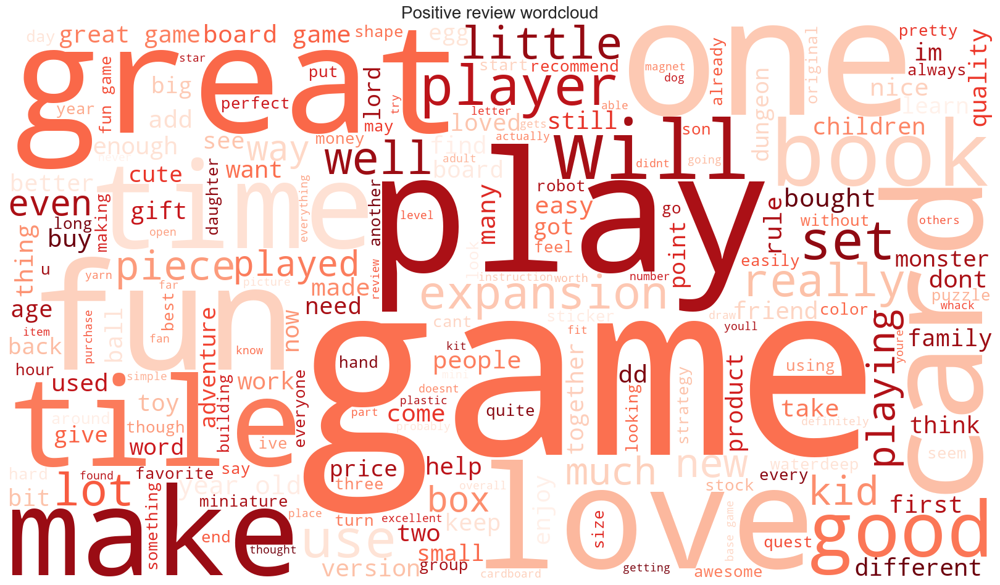

In [498]:
# Plot the WordCloud image for positive reviews.                        
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis('off') 
plt.tight_layout(pad = 0)
plt.title('Positive review wordcloud',fontsize=20)

> 'fun' and 'great' stick out as common positive words in this wordcloud 

### Wordcloud for negative reviews

- Our definition of 'negative' is based on the Vader algorithm, where it classifies the compound score as negative

In [502]:
# determine the review tokens for the negative vader sentiments
negative_text = pd.concat([turtle4['review_tokens'],turtle5['review_sentiment_vader']],axis=1)
negative_text = negative_text[negative_text['review_sentiment_vader'] == 'Negative']
negative_text = negative_text.reset_index(drop=True)

In [503]:
# Put all the review tokens into one list.
# Define an empty list of tokens.
all_review_tokens = []

for i in range(negative_text.shape[0]):
    # Add each token to the list.
    all_review_tokens = all_review_tokens + negative_text['review_tokens'][i]

In [504]:
# Filter out tokens that are neither alphabets nor numbers.
all_review_tokens = [word for word in all_review_tokens if word.isalnum()]

In [505]:
# Convert list of tokens into a string variable.
# Define an empty string variable.
review_tokens_string = ''

for value in all_review_tokens:
    # Add each filtered token word to the string.
    review_tokens_string = review_tokens_string + value + ' '

In [506]:
# Review: Create a word cloud.
wordcloud = WordCloud(width = 1600, height = 900, 
                background_color ='white', 
                colormap='Reds_r',
                min_font_size = 10).generate(review_tokens_string)

Text(0.5, 1.0, 'Negative review wordcloud')

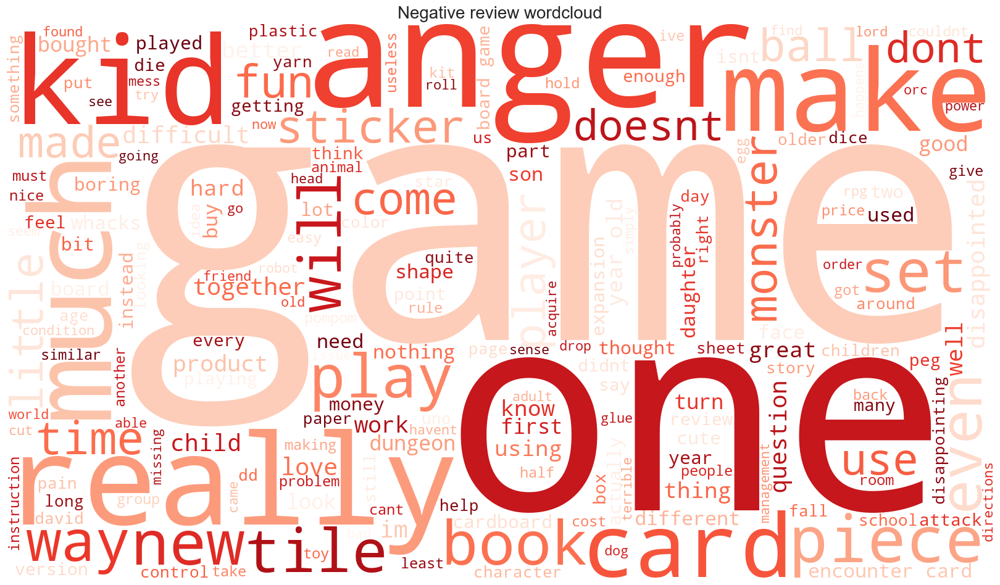

In [507]:
# Plot the WordCloud image for negative reviews.                        
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis('off') 
plt.tight_layout(pad = 0)
plt.title('Negative review wordcloud',fontsize=20)

> There are many negative words in this wordcloud. 'Anger' sticks out as a common word.

> Insights

- Strong Positive Feedback: Customer reviews and summaries predominantly express positive sentiment, with words like "fun," "love," "good," "great," and "play" appearing frequently.- Data Preparation is Key: Accurate sentiment analysis requires thorough text data cleaning and normalization.
- Comprehensive Analysis with NLP Tools: Combining TextBlob and VADER provides a well-rounded sentiment analysis, addressing both general language and review-specific nuance.
- Usability Issues: Customers find some games overly complex or poorly designed, hindering enjoyment.- Quality Concerns: Product quality is inconsistent, failing to meet customer expectations.
- Poor Value: Customers perceive products as overpriced for their actual value

> Recommendations

- Optimize Product Design & Experience - Simplify game mechanics and adjust complexity for target audiences to enhance usability. Prioritize functional design and interactive elements over purely aesthetic features. Ensure products deliver engaging experiences that match marketing promises.
- Improve Product Quality & Value - Implement rigorous quality control to meet customer expectations. Reassess pricing to align with perceived value and quality.
- Expand & Innovate Product Offerings - Capitalize on the success of educational products by expanding this range. Continue developing creative, crafting-based products with clear instructions and quality materials. Innovate for increase playability through dynamic content, expansions, or updates.


> Further analysis, insights and recommendations of all sections can be found in the technical report

# Thank you for reading

### For any further queries please contact me (Harshdeep Kohli) on my email: harshdeepkohli53@gmail.com

#